In [ ]:
# GUEYE ELhadji

# From Self-Attention mechanism to Transformers

This notebook aims to provide a comprehensive and practical understanding of the self-attention mechanism and its applications in various contexts, through detailed explanations, visualizations and interactive exercises.

## Self-Attention mechanism: basic implementation

Here is an example of Python code using TensorFlow and Matplotlib to explain and visualize the Self-Attention mechanism. This code shows intermediate steps such as generating queries, keys, and values ​​matrices, as well as calculating attention scores and applying attention weights to values. .

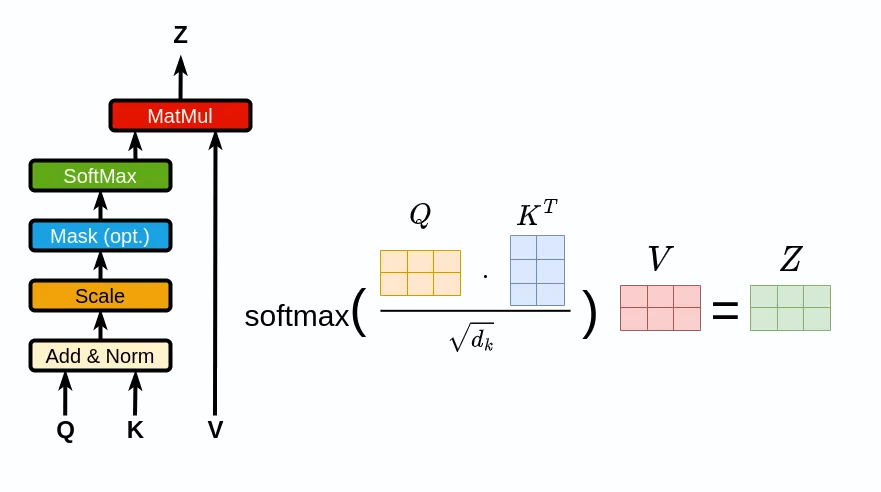

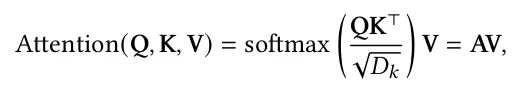

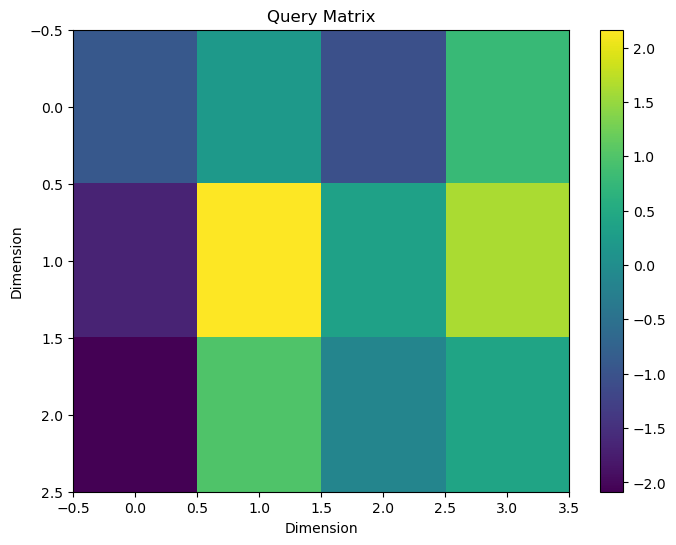

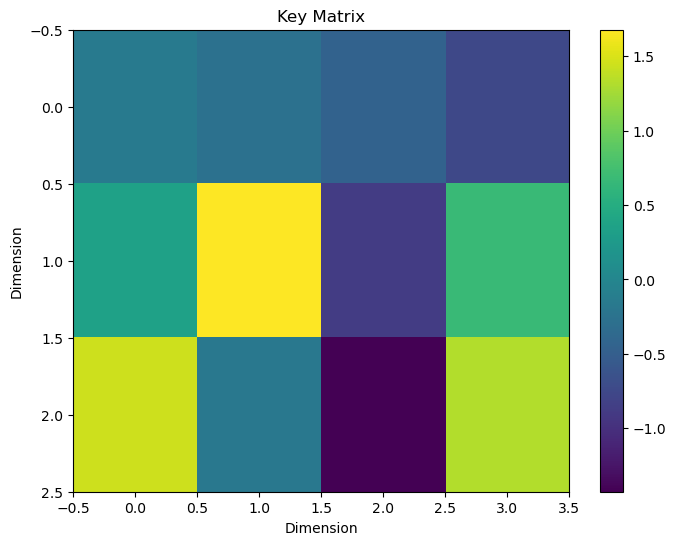

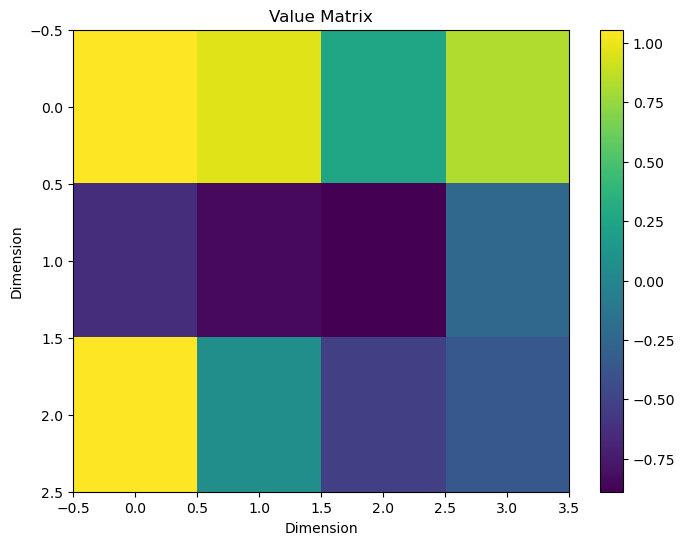

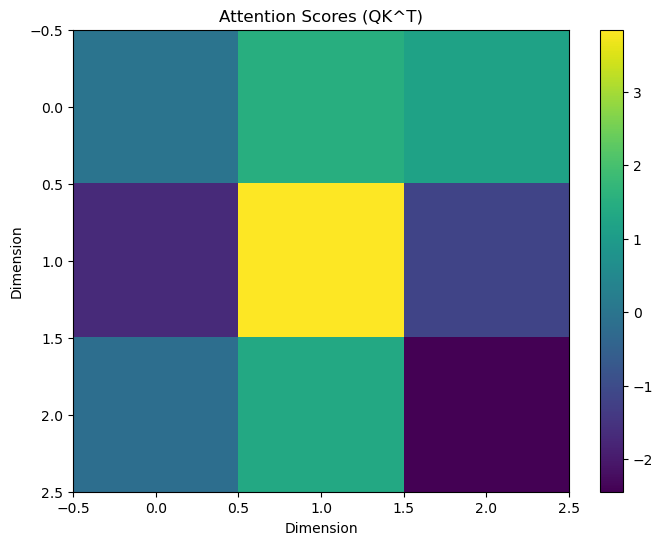

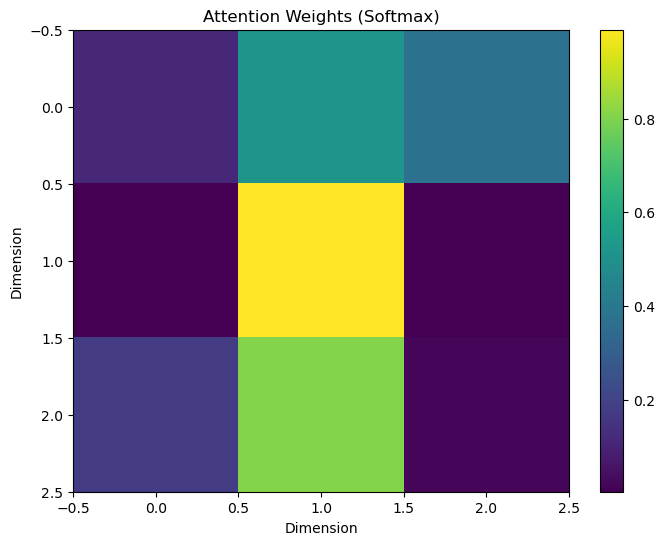

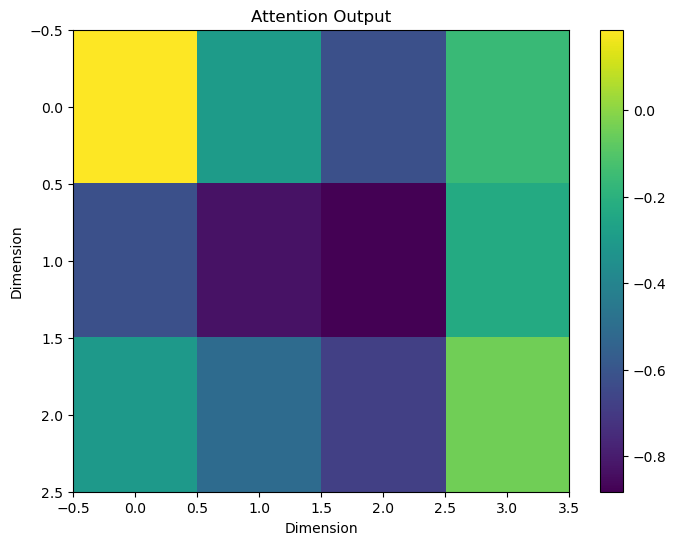

Input Sequence:
 [[1 0 1 0]
 [0 2 1 0]
 [1 1 0 1]]
Query Matrix:
 [[-0.909364    0.2103436  -1.0456085   0.7849022 ]
 [-1.6639793   2.1644034   0.35220778  1.6208012 ]
 [-2.085553    1.0008175  -0.15686077  0.39684558]]
Key Matrix:
 [[-0.15630952 -0.26254642 -0.45327097 -0.75540084]
 [ 0.3514122   1.6769989  -0.8775503   0.681929  ]
 [ 1.4403665  -0.18577525 -1.4256588   1.3172016 ]]
Value Matrix:
 [[ 1.0558639   0.9611999   0.25884598  0.8254858 ]
 [-0.63760805 -0.8429679  -0.8892755  -0.23155063]
 [ 1.0484115   0.07409698 -0.5200211  -0.3567744 ]]
Attention Scores:
 [[-0.03205448  1.486006    1.1756614 ]
 [-1.6921607   3.8411508  -1.1660386 ]
 [-0.16544634  1.3537548  -2.4435322 ]]
Attention Weights:
 [[0.11224353 0.5122083  0.3755482 ]
 [0.00391125 0.9894695  0.00661923]
 [0.17633407 0.8055952  0.01807075]]
Attention Output:
 [[ 0.18565482 -0.2960597  -0.6217335  -0.15993269]
 [-0.6198243  -0.8298411  -0.8823408  -0.22824518]
 [-0.30852365 -0.50825965 -0.68014985 -0.04742199]]


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

def plot_matrix(matrix, title):
    plt.figure(figsize=(8, 6))
    plt.imshow(matrix, cmap='viridis', aspect='auto')
    plt.colorbar()
    plt.title(title)
    plt.xlabel('Dimension')
    plt.ylabel('Dimension')
    plt.show()

# Input sequence: a matrix where each row represents a feature vector for a sequence element
input_sequence = np.array([[1, 0, 1, 0],
                           [0, 2, 1, 0],
                           [1, 1, 0, 1]])

# Model parameters
d_model = input_sequence.shape[1]  # Dimension of the embeddings
num_heads = 1  # Number of attention heads (single head for simplicity)

# Create query, key, and value matrices using linear transformations (Dense layers)
query = tf.keras.layers.Dense(d_model)(input_sequence)
key = tf.keras.layers.Dense(d_model)(input_sequence)
value = tf.keras.layers.Dense(d_model)(input_sequence)

# Visualize the query, key, and value matrices
plot_matrix(query, "Query Matrix")
plot_matrix(key, "Key Matrix")
plot_matrix(value, "Value Matrix")

# Compute attention scores by performing dot product of queries and transposed keys
scores = tf.matmul(query, key, transpose_b=True)
plot_matrix(scores, "Attention Scores (QK^T)")

# Apply softmax to the scores to obtain attention weights
attention_weights = tf.nn.softmax(scores, axis=-1)
plot_matrix(attention_weights, "Attention Weights (Softmax)")

# Apply attention weights to the values to get the final attention output
attention_output = tf.matmul(attention_weights, value)
plot_matrix(attention_output, "Attention Output")

# Print the results for reference
print("Input Sequence:\n", input_sequence)
print("Query Matrix:\n", query.numpy())
print("Key Matrix:\n", key.numpy())
print("Value Matrix:\n", value.numpy())
print("Attention Scores:\n", scores.numpy())
print("Attention Weights:\n", attention_weights.numpy())
print("Attention Output:\n", attention_output.numpy())

### Detailed Explanations of Each Step
#### Input Sequence: The input sequence is a matrix where each row represents a feature vector for an element of the sequence. This is the data we want to apply self-attention to.

#### Query, Key, and Value Matrices: These matrices are created by applying linear transformations (Dense layers) to the input sequence.
- Queries: Used to compare against keys to measure similarity.
- Keys: Used in conjunction with queries to compute attention scores.
- Values: Contain the information we want to focus on and extract based on the computed attention scores.

#### Attention Scores:

- Calculated by taking the dot product of the query matrix and the transposed key matrix.
- This gives a measure of similarity between elements of the sequence.

#### Attention Weights:

- The scores are passed through a softmax function to convert them into probabilities (attention weights).
- These weights determine the relative importance of each element in the sequence.

#### Attention Output:

- The attention weights are applied to the value matrix to compute the final attention output.
- This output represents the weighted sum of values based on their attention weights, capturing the relevant information from the input sequence.

### Visualizations
- Query, Key, and Value Matrices: Visualized to understand how the input sequence is transformed.
- Attention Scores: Show the similarity measures between different elements of the sequence.
- Attention Weights: Show the normalized importance of each element in the sequence.
- Attention Output: The final weighted output that captures the important information based on the attention mechanism.

## Self-Attention mechanism: Using a sentence as input

The sentence "I love tennis" is represented using embeddings, and the self-attention mechanism is applied to transform these embeddings.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def softmax(x):
    return np.exp(x) / np.sum(np.exp(x), axis=-1, keepdims=True)

# Example sentence embeddings (3 dimensions per word)
embeddings = {
    "I": [1, 0, 1],
    "love": [0, 1, 0],
    "tennis": [1, 1, 1]
}

# Convert sentence to sequence of embeddings
sentence = ["I", "love", "tennis"]
inputs = np.array([embeddings[word] for word in sentence])

# Initialize weights for Query, Key, and Value matrices
np.random.seed(0)
Wq = np.random.rand(3, 3)
Wk = np.random.rand(3, 3)
Wv = np.random.rand(3, 3)

# Compute Query, Key, and Value matrices
Q = np.dot(inputs, Wq)
K = np.dot(inputs, Wk)
V = np.dot(inputs, Wv)

# Compute attention scores
scores = np.dot(Q, K.T) / np.sqrt(K.shape[1])

# Apply softmax to get attention weights
attention_weights = softmax(scores)

# Compute the output of the self-attention mechanism
output = np.dot(attention_weights, V)

# Plotting the inputs
plt.figure(figsize=(15, 8))
plt.subplot(2, 3, 1)
sns.heatmap(inputs, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Inputs')

# Plotting Query (Q) matrix
plt.subplot(2, 3, 2)
sns.heatmap(Q, annot=True, cmap='viridis', xticklabels=['dim1', 'dim2', 'dim3'], yticklabels=sentence)
plt.title('Query (Q)')

# Plotting Key (K) matrix
plt.subplot(2, 3, 3)
sns.heatmap(K, annot=True, cmap='viridis', xticklabels=['dim1', 'dim2', 'dim3'], yticklabels=sentence)
plt.title('Key (K)')

# Plotting Value (V) matrix
plt.subplot(2, 3, 4)
sns.heatmap(V, annot=True, cmap='viridis', xticklabels=['dim1', 'dim2', 'dim3'], yticklabels=sentence)
plt.title('Value (V)')

# Plotting Attention Scores
plt.subplot(2, 3, 5)
sns.heatmap(scores, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Attention Scores')

# Plotting Attention Weights
plt.subplot(2, 3, 6)
sns.heatmap(attention_weights, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Attention Weights')

plt.tight_layout()
plt.show()

print("Phrase:", sentence)
print("\nInputs:\n", inputs)
print("\nQuery (Q):\n", Q)
print("\nKey (K):\n", K)
print("\nValue (V):\n", V)
print("\nAttention Scores:\n", scores)
print("\nAttention Weights:\n", attention_weights)
print("\nOutput:\n", output)

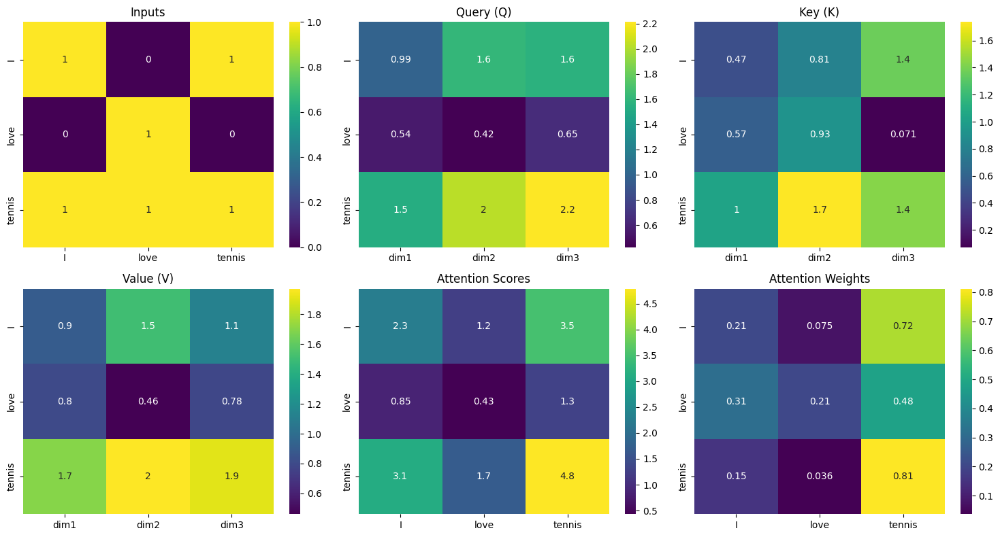

## Self-Attention mechanism: Word embeddings computing

To demonstrate a basic self-attention mechanism with real embeddings, we'll use a simple approach to compute word embeddings based on co-occurrence statistics from the given sentence. Here, I'll provide a complete example including the calculation of basic word embeddings and applying the self-attention mechanism.

### Step-by-Step Process
 - Tokenize the Sentence: We'll split the sentence into individual words (tokens).

 - Calculate Word Embeddings: We'll use a basic technique to create embeddings based on the context of each word. In this case, we'll use one-hot encoding as the simplest form of embedding.

 - Apply Self-Attention: Using the calculated embeddings, we'll apply the self-attention mechanism and visualize the intermediate results.

 - Initialize Weights: Random weights for Query (Q), Key (K), and Value (V) matrices are initialized.

 - Compute Q, K, and V Matrices: The input embeddings are transformed into Q, K, and V matrices using the initialized weights.

 - Compute Attention Scores: Attention scores are calculated by taking the dot product of Q and K transpose, then normalizing by the square root of the key dimension.

 - Apply Softmax to Get Attention Weights: The softmax function is applied to the attention scores to obtain the attention weights.

- Compute the Output: The final output is calculated by multiplying the attention weights with the value matrix V.

 - Visualization: Various stages of the self-attention mechanism (inputs, Q, K, V matrices, attention scores, and attention weights) are visualized using heatmaps.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def softmax(x):
    return np.exp(x) / np.sum(np.exp(x), axis=-1, keepdims=True)

# Tokenize the sentence
sentence = "I am very happy to work at Paris 8 university".split()
vocab_size = len(sentence)

# Create one-hot embeddings for each word
word_to_index = {word: idx for idx, word in enumerate(sentence)}
embeddings = np.eye(vocab_size)

# Convert sentence to sequence of embeddings
inputs = np.array([embeddings[word_to_index[word]] for word in sentence])

# Initialize weights for Query, Key, and Value matrices
np.random.seed(0)
Wq = np.random.rand(vocab_size, vocab_size)
Wk = np.random.rand(vocab_size, vocab_size)
Wv = np.random.rand(vocab_size, vocab_size)

# Compute Query, Key, and Value matrices
Q = np.dot(inputs, Wq)
K = np.dot(inputs, Wk)
V = np.dot(inputs, Wv)

# Compute attention scores
scores = np.dot(Q, K.T) / np.sqrt(K.shape[1])

# Apply softmax to get attention weights
attention_weights = softmax(scores)

# Compute the output of the self-attention mechanism
output = np.dot(attention_weights, V)

# Visualization
plt.figure(figsize=(18, 10))

# Plotting the inputs
plt.subplot(2, 3, 1)
sns.heatmap(inputs, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Inputs')

# Plotting Query (Q) matrix
plt.subplot(2, 3, 2)
sns.heatmap(Q, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Query (Q)')

# Plotting Key (K) matrix
plt.subplot(2, 3, 3)
sns.heatmap(K, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Key (K)')

# Plotting Value (V) matrix
plt.subplot(2, 3, 4)
sns.heatmap(V, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Value (V)')

# Plotting Attention Scores
plt.subplot(2, 3, 5)
sns.heatmap(scores, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Attention Scores')

# Plotting Attention Weights
plt.subplot(2, 3, 6)
sns.heatmap(attention_weights, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Attention Weights')

plt.tight_layout()
plt.show()

print("Sentence:", sentence)
print("\nInputs:\n", inputs)
print("\nQuery (Q):\n", Q)
print("\nKey (K):\n", K)
print("\nValue (V):\n", V)
print("\nAttention Scores:\n", scores)
print("\nAttention Weights:\n", attention_weights)
print("\nOutput:\n", output)

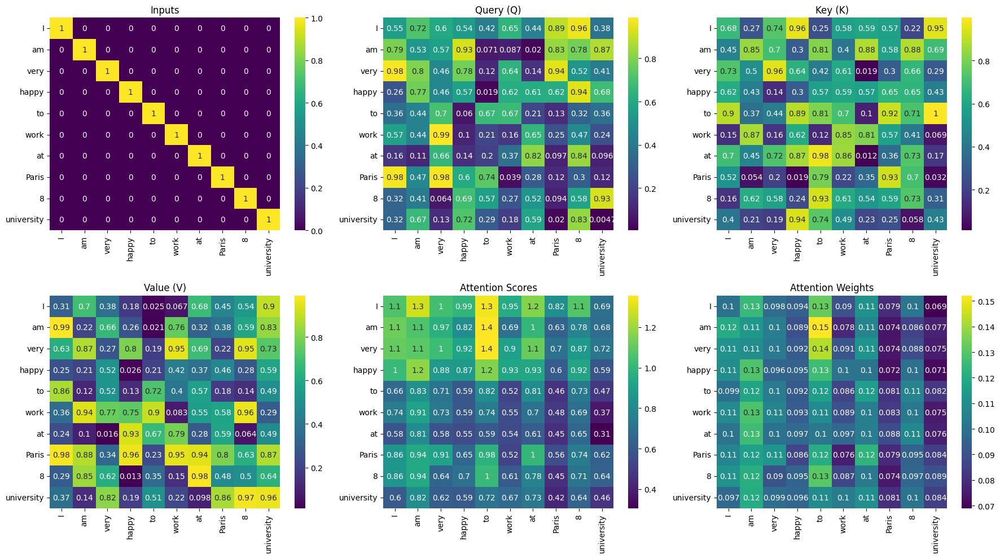

## Complete Encoder Implementation

The encoder implementation involves several key steps, each contributing to transforming the input data and capturing relationships and context within a sentence. Here’s a detailed explanation of each step:


1. Tokenization and Embedding

 - Tokenization: The input sentence "I am very happy to work at Paris 8 university" is split into individual words (tokens), creating a list of tokens.

 - Embedding: Each word in the sentence is represented using one-hot encoding, which is a basic form of word embedding. In one-hot encoding, each word is represented by a unique vector where only one element is 1 (indicating the presence of the word), and all other elements are 0.

2. Initialize Weights

 - Weight Initialization: Random weights are initialized for the Query (Q), Key (K), and Value (V) matrices, as well as for the feed-forward neural network layers. These weights will be used to transform the input embeddings during the self-attention and feed-forward processes.

3. Self-Attention Layer

 - Compute Q, K, and V Matrices: The input embeddings are multiplied by the respective weight matrices to obtain the Q, K, and V matrices. These matrices are essential for calculating attention scores.

 - Calculate Attention Scores: The attention scores are calculated by taking the dot product of the Q matrix and the transpose of the K matrix. The resulting scores are then scaled by the square root of the dimension of the key vectors to ensure stable gradients.

 - Softmax Application: The softmax function is applied to the attention scores to convert them into probabilities, which represent the attention weights. These weights indicate how much attention each word should pay to other words in the sentence.

 - Compute Attention Output: The attention weights are multiplied by the V matrix to obtain the attention output. This output is a weighted sum of the value vectors, capturing the context and relationships between words.

4. Add & Norm Layer (Self-Attention)

 - Residual Connection and Layer Normalization: The attention output is added to the original input embeddings (residual connection) to preserve the initial information. Layer normalization is then applied to the result, ensuring stable and normalized outputs.

5. Feed-Forward Layer

 - Feed-Forward Neural Network: The output from the self-attention layer is passed through a feed-forward neural network, which typically consists of two linear transformations with a ReLU activation function in between. This layer further transforms the data, capturing more complex relationships.

6. Add & Norm Layer (Feed-Forward)

 - Residual Connection and Layer Normalization: The output from the feed-forward layer is added to the self-attention output (residual connection) and normalized again using layer normalization. This step helps in maintaining the stability and richness of the transformed data.


(10, 10)


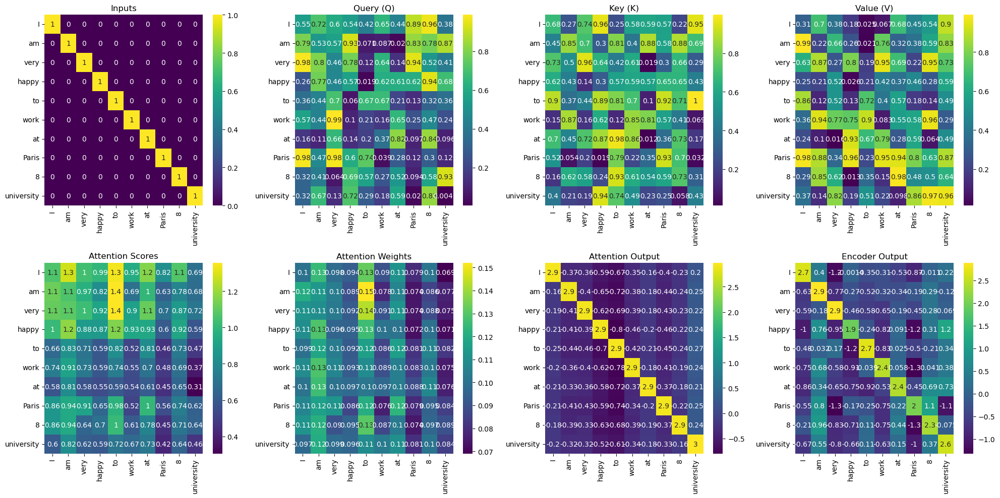

Sentence: ['I', 'am', 'very', 'happy', 'to', 'work', 'at', 'Paris', '8', 'university']

Inputs:
 [[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]

Query (Q):
 [[0.5488135  0.71518937 0.60276338 0.54488318 0.4236548  0.64589411
  0.43758721 0.891773   0.96366276 0.38344152]
 [0.79172504 0.52889492 0.56804456 0.92559664 0.07103606 0.0871293
  0.0202184  0.83261985 0.77815675 0.87001215]
 [0.97861834 0.79915856 0.46147936 0.78052918 0.11827443 0.63992102
  0.14335329 0.94466892 0.52184832 0.41466194]
 [0.26455561 0.77423369 0.45615033 0.56843395 0.0187898  0.6176355
  0.61209572 0.616934   0.94374808 0.6818203 ]
 [0.3595079  0.43703195 0.6976312  0.06022547 0.66676672 0.67063787
  0.21038256 0.1289263  0.3154283

In [74]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Softmax function
def softmax(x):
    return np.exp(x) / np.sum(np.exp(x), axis=-1, keepdims=True)

# Layer normalization function
def layer_norm(x):
    return (x - np.mean(x, axis=-1, keepdims=True)) / np.std(x, axis=-1, keepdims=True)

# Tokenize the sentence
sentence = "I am very happy to work at Paris 8 university".split()
vocab_size = len(sentence)

# Create one-hot embeddings for each word
word_to_index = {word: idx for idx, word in enumerate(sentence)}
embeddings = np.eye(vocab_size)

# Convert sentence to sequence of embeddings
inputs = np.array([embeddings[word_to_index[word]] for word in sentence])

print(inputs.shape)
# Initialize weights for Query, Key, Value, and Feed-Forward matrices
np.random.seed(0)
Wq = np.random.rand(vocab_size, vocab_size)
Wk = np.random.rand(vocab_size, vocab_size)
Wv = np.random.rand(vocab_size, vocab_size)
W1 = np.random.rand(vocab_size, vocab_size)  # Feed-Forward layer 1 weights
W2 = np.random.rand(vocab_size, vocab_size)  # Feed-Forward layer 2 weights

# Self-Attention Layer
Q = np.dot(inputs, Wq)
K = np.dot(inputs, Wk)
V = np.dot(inputs, Wv)

scores = np.dot(Q, K.T) / np.sqrt(K.shape[1])
attention_weights = softmax(scores)
attention_output = np.dot(attention_weights, V)

# Add & Norm Layer (Self-Attention Output + Inputs)
attention_output = layer_norm(attention_output + inputs)

# Feed-Forward Layer
ffn_output = np.dot(attention_output, W1)
ffn_output = np.maximum(0, ffn_output)  # ReLU activation
ffn_output = np.dot(ffn_output, W2)

# Add & Norm Layer (Feed-Forward Output + Self-Attention Output)
encoder_output = layer_norm(ffn_output + attention_output)

# Visualization
plt.figure(figsize=(20, 10))

# Plotting the inputs
plt.subplot(2, 4, 1)
sns.heatmap(inputs, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Inputs')

# Plotting Query (Q) matrix
plt.subplot(2, 4, 2)
sns.heatmap(Q, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Query (Q)')

# Plotting Key (K) matrix
plt.subplot(2, 4, 3)
sns.heatmap(K, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Key (K)')

# Plotting Value (V) matrix
plt.subplot(2, 4, 4)
sns.heatmap(V, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Value (V)')

# Plotting Attention Scores
plt.subplot(2, 4, 5)
sns.heatmap(scores, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Attention Scores')

# Plotting Attention Weights
plt.subplot(2, 4, 6)
sns.heatmap(attention_weights, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Attention Weights')

# Plotting Attention Output
plt.subplot(2, 4, 7)
sns.heatmap(attention_output, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Attention Output')

# Plotting Encoder Output
plt.subplot(2, 4, 8)
sns.heatmap(encoder_output, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Encoder Output')

plt.tight_layout()
plt.show()

print("Sentence:", sentence)
print("\nInputs:\n", inputs)
print("\nQuery (Q):\n", Q)
print("\nKey (K):\n", K)
print("\nValue (V):\n", V)
print("\nAttention Scores:\n", scores)
print("\nAttention Weights:\n", attention_weights)
print("\nAttention Output:\n", attention_output)
print("\nFeed-Forward Output:\n", ffn_output)
print("\nEncoder Output:\n", encoder_output)

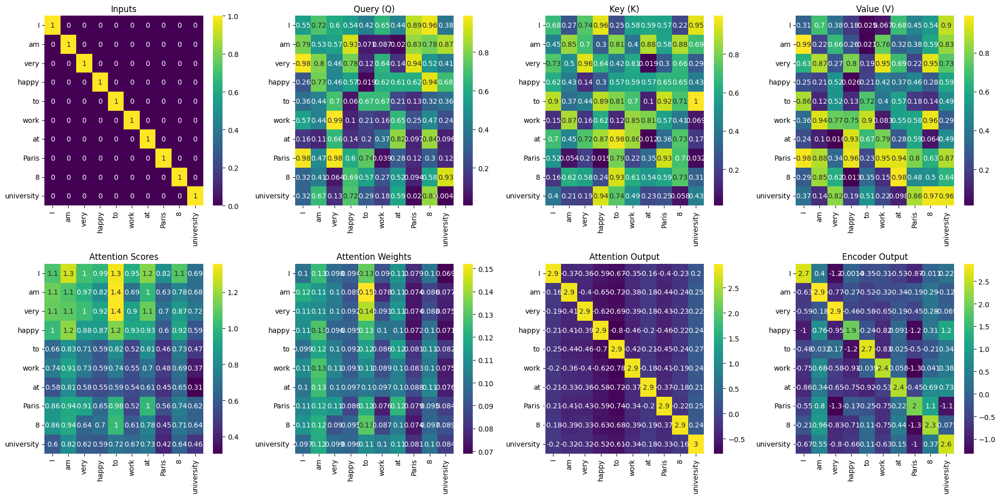

## Complete Encoder-Decoder Implementation Using Self-Attention

To implement a complete encoder-decoder model using self-attention, we'll extend the previous encoder implementation by adding a decoder component. The decoder will also include self-attention and cross-attention layers to process the encoder outputs and generate predictions.

1. Tokenization and Embedding

 - Tokenization: Both the source (encoder) sentence "I am very happy to work at Paris 8 university" and the target (decoder) sentence "Je suis très heureux de travailler à l'université Paris 8" are tokenized into individual words.

 - Embedding: Each word is converted into a one-hot vector representation. This simple embedding method is used to map each word to a unique vector.

2. Initialize Weights

 - Random weights are initialized for the Query (Q), Key (K), and Value (V) matrices for both the encoder and decoder. Additionally, weights are initialized for the feed-forward layers in both the encoder and decoder.

3. Encoder

 - Self-Attention Layer: The input embeddings are transformed using the Q, K, and V matrices. Attention scores are computed and normalized using softmax to obtain attention weights. These weights are then used to compute the self-attention output.

 - Add & Norm Layer (Self-Attention): Residual connections are added to the self-attention output, and layer normalization is applied.

 - Feed-Forward Layer: The output of the self-attention layer is passed through a feed-forward neural network with ReLU activation.

 - Add & Norm Layer (Feed-Forward): Residual connections are added to the feed-forward output, and layer normalization is applied, resulting in the final encoder output.

4. Decoder

 - Self-Attention Layer: The decoder inputs are transformed using their own Q, K, and V matrices. Attention scores are computed and normalized using softmax to obtain attention weights. These weights are then used to compute the self-attention output for the decoder.

 - Add & Norm Layer (Self-Attention): Residual connections are added to the self-attention output, and layer normalization is applied.

 - Cross-Attention Layer: The decoder's self-attention output interacts with the encoder's output using Q matrices from the decoder and K, V matrices from the encoder. This step allows the decoder to attend to the encoder's outputs. Attention scores are computed and normalized using softmax to obtain cross-attention weights.

 - Add & Norm Layer (Cross-Attention): Residual connections are added to the cross-attention output, and layer normalization is applied.

 - Feed-Forward Layer: The output of the cross-attention layer is passed through a feed-forward neural network with ReLU activation.

 - Add & Norm Layer (Feed-Forward): Residual connections are added to the feed-forward output, and layer normalization is applied, resulting in the final decoder output.

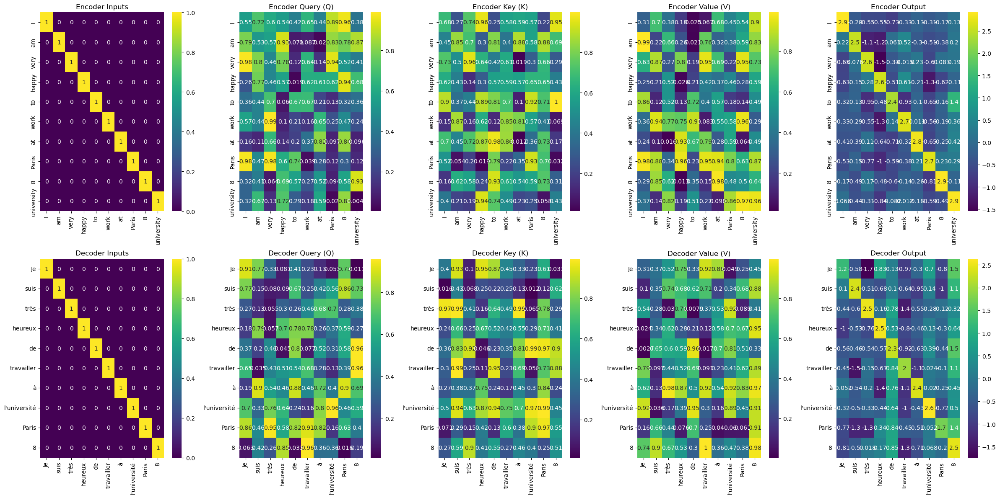

Encoder Sentence: ['I', 'am', 'very', 'happy', 'to', 'work', 'at', 'Paris', '8', 'university']

Encoder Inputs:
 [[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]

Encoder Query (Q):
 [[0.5488135  0.71518937 0.60276338 0.54488318 0.4236548  0.64589411
  0.43758721 0.891773   0.96366276 0.38344152]
 [0.79172504 0.52889492 0.56804456 0.92559664 0.07103606 0.0871293
  0.0202184  0.83261985 0.77815675 0.87001215]
 [0.97861834 0.79915856 0.46147936 0.78052918 0.11827443 0.63992102
  0.14335329 0.94466892 0.52184832 0.41466194]
 [0.26455561 0.77423369 0.45615033 0.56843395 0.0187898  0.6176355
  0.61209572 0.616934   0.94374808 0.6818203 ]
 [0.3595079  0.43703195 0.6976312  0.06022547 0.66676672 0.67063787
  0.21038

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Softmax function
def softmax(x):
    return np.exp(x) / np.sum(np.exp(x), axis=-1, keepdims=True)

# Layer normalization function
def layer_norm(x):
    return (x - np.mean(x, axis=-1, keepdims=True)) / np.std(x, axis=-1, keepdims=True)

# Tokenize the sentences
encoder_sentence = "I am very happy to work at Paris 8 university".split()
decoder_sentence = "Je suis très heureux de travailler à l'université Paris 8".split()

# Vocabulary sizes
encoder_vocab_size = len(encoder_sentence)
decoder_vocab_size = len(decoder_sentence)

# Create one-hot embeddings for each word
encoder_word_to_index = {word: idx for idx, word in enumerate(encoder_sentence)}
decoder_word_to_index = {word: idx for idx, word in enumerate(decoder_sentence)}
encoder_embeddings = np.eye(encoder_vocab_size)
decoder_embeddings = np.eye(decoder_vocab_size)

# Convert sentences to sequences of embeddings
encoder_inputs = np.array([encoder_embeddings[encoder_word_to_index[word]] for word in encoder_sentence])
decoder_inputs = np.array([decoder_embeddings[decoder_word_to_index[word]] for word in decoder_sentence])

# Initialize weights for Query, Key, Value, and Feed-Forward matrices
np.random.seed(0)
Wq_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)
Wk_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)
Wv_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)

Wq_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)
Wk_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)
Wv_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)

W1_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)  # Feed-Forward layer 1 weights for encoder
W2_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)  # Feed-Forward layer 2 weights for encoder

W1_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)  # Feed-Forward layer 1 weights for decoder
W2_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)  # Feed-Forward layer 2 weights for decoder

# Encoder Self-Attention Layer
Q_encoder = np.dot(encoder_inputs, Wq_encoder)
K_encoder = np.dot(encoder_inputs, Wk_encoder)
V_encoder = np.dot(encoder_inputs, Wv_encoder)

scores_encoder = np.dot(Q_encoder, K_encoder.T) / np.sqrt(K_encoder.shape[1])
attention_weights_encoder = softmax(scores_encoder)
attention_output_encoder = np.dot(attention_weights_encoder, V_encoder)

# Add & Norm Layer (Encoder Self-Attention Output + Inputs)
attention_output_encoder = layer_norm(attention_output_encoder + encoder_inputs)

# Encoder Feed-Forward Layer
ffn_output_encoder = np.dot(attention_output_encoder, W1_encoder)
ffn_output_encoder = np.maximum(0, ffn_output_encoder)  # ReLU activation
ffn_output_encoder = np.dot(ffn_output_encoder, W2_encoder)

# Add & Norm Layer (Feed-Forward Output + Self-Attention Output)
encoder_output = layer_norm(ffn_output_encoder + attention_output_encoder)

# Decoder Self-Attention Layer
Q_decoder = np.dot(decoder_inputs, Wq_decoder)
K_decoder = np.dot(decoder_inputs, Wk_decoder)
V_decoder = np.dot(decoder_inputs, Wv_decoder)

scores_decoder = np.dot(Q_decoder, K_decoder.T) / np.sqrt(K_decoder.shape[1])
attention_weights_decoder = softmax(scores_decoder)
attention_output_decoder = np.dot(attention_weights_decoder, V_decoder)

# Add & Norm Layer (Decoder Self-Attention Output + Inputs)
attention_output_decoder = layer_norm(attention_output_decoder + decoder_inputs)

# Decoder Cross-Attention Layer (using encoder outputs)
Q_cross = np.dot(attention_output_decoder, Wq_decoder)
K_cross = np.dot(encoder_output, Wk_encoder)
V_cross = np.dot(encoder_output, Wv_encoder)

scores_cross = np.dot(Q_cross, K_cross.T) / np.sqrt(K_cross.shape[1])
attention_weights_cross = softmax(scores_cross)
cross_attention_output = np.dot(attention_weights_cross, V_cross)

# Add & Norm Layer (Cross-Attention Output + Decoder Self-Attention Output)
cross_attention_output = layer_norm(cross_attention_output + attention_output_decoder)

# Decoder Feed-Forward Layer
ffn_output_decoder = np.dot(cross_attention_output, W1_decoder)
ffn_output_decoder = np.maximum(0, ffn_output_decoder)  # ReLU activation
ffn_output_decoder = np.dot(ffn_output_decoder, W2_decoder)

# Add & Norm Layer (Feed-Forward Output + Cross-Attention Output)
decoder_output = layer_norm(ffn_output_decoder + cross_attention_output)

# Visualization
plt.figure(figsize=(24, 12))

# Plotting the encoder inputs
plt.subplot(2, 5, 1)
sns.heatmap(encoder_inputs, annot=True, cmap='viridis', xticklabels=encoder_sentence, yticklabels=encoder_sentence)
plt.title('Encoder Inputs')

# Plotting encoder Query (Q) matrix
plt.subplot(2, 5, 2)
sns.heatmap(Q_encoder, annot=True, cmap='viridis', xticklabels=encoder_sentence, yticklabels=encoder_sentence)
plt.title('Encoder Query (Q)')

# Plotting encoder Key (K) matrix
plt.subplot(2, 5, 3)
sns.heatmap(K_encoder, annot=True, cmap='viridis', xticklabels=encoder_sentence, yticklabels=encoder_sentence)
plt.title('Encoder Key (K)')

# Plotting encoder Value (V) matrix
plt.subplot(2, 5, 4)
sns.heatmap(V_encoder, annot=True, cmap='viridis', xticklabels=encoder_sentence, yticklabels=encoder_sentence)
plt.title('Encoder Value (V)')

# Plotting encoder output
plt.subplot(2, 5, 5)
sns.heatmap(encoder_output, annot=True, cmap='viridis', xticklabels=encoder_sentence, yticklabels=encoder_sentence)
plt.title('Encoder Output')

# Plotting the decoder inputs
plt.subplot(2, 5, 6)
sns.heatmap(decoder_inputs, annot=True, cmap='viridis', xticklabels=decoder_sentence, yticklabels=decoder_sentence)
plt.title('Decoder Inputs')

# Plotting decoder Query (Q) matrix
plt.subplot(2, 5, 7)
sns.heatmap(Q_decoder, annot=True, cmap='viridis', xticklabels=decoder_sentence, yticklabels=decoder_sentence)
plt.title('Decoder Query (Q)')

# Plotting decoder Key (K) matrix
plt.subplot(2, 5, 8)
sns.heatmap(K_decoder, annot=True, cmap='viridis', xticklabels=decoder_sentence, yticklabels=decoder_sentence)
plt.title('Decoder Key (K)')

# Plotting decoder Value (V) matrix
plt.subplot(2, 5, 9)
sns.heatmap(V_decoder, annot=True, cmap='viridis', xticklabels=decoder_sentence, yticklabels=decoder_sentence)
plt.title('Decoder Value (V)')

# Plotting decoder output
plt.subplot(2, 5, 10)
sns.heatmap(decoder_output, annot=True, cmap='viridis', xticklabels=decoder_sentence, yticklabels=decoder_sentence)
plt.title('Decoder Output')

plt.tight_layout()
plt.show()

print("Encoder Sentence:", encoder_sentence)
print("\nEncoder Inputs:\n", encoder_inputs)
print("\nEncoder Query (Q):\n", Q_encoder)
print("\nEncoder Key (K):\n", K_encoder)
print("\nEncoder Value (V):\n", V_encoder)
print("\nEncoder Output:\n", encoder_output)

print("\nDecoder Sentence:", decoder_sentence)
print("\nDecoder Inputs:\n", decoder_inputs)
print("\nDecoder Query (Q):\n", Q_decoder)
print("\nDecoder Key (K):\n", K_decoder)
print("\nDecoder Value (V):\n", V_decoder)
print("\nDecoder Output:\n", decoder_output)

## Complete Encoder-Decoder Implementation Using Multi-Head Self-Attention : A transformer !

This encoder-decoder implementation with multi-head self-attention includes both self-attention and cross-attention mechanisms, residual connections, and layer normalization, demonstrating how the input sentence is transformed and how the decoder attends to the encoder's output to generate the final result. The multi-head attention mechanism allows the model to focus on different parts of the input sentence simultaneously, capturing more complex relationships and context.

1. Tokenization and Embedding

 - Tokenization: Both the source (encoder) sentence "I am very happy to work at Paris 8 university" and the target (decoder) sentence "Je suis très heureux de travailler à l'université Paris 8" are tokenized into individual words.

 - Embedding: Each word is converted into a one-hot vector representation. This simple embedding method is used to map each word to a unique vector.

2. Initialize Weights

 - Random weights are initialized for the Query (Q), Key (K), and Value (V) matrices for both the encoder and decoder, as well as for the feed-forward neural network layers. These weights are necessary for transforming the input embeddings during self-attention and feed-forward processes.

3. Multi-Head Self-Attention

 - Function Definition: The multi_head_attention function splits Q, K, and V matrices into multiple heads, performs self-attention on each head independently, and concatenates the outputs.

4. Encoder

 - Multi-Head Self-Attention Layer: The input embeddings are transformed using the Q, K, and V matrices. The multi_head_attention function is used to compute the self-attention output across multiple heads.

 - Add & Norm Layer (Self-Attention): Residual connections are added to the self-attention output, and layer normalization is applied.

 - Feed-Forward Layer: The output of the self-attention layer is passed through a feed-forward neural network with ReLU activation.

 - Add & Norm Layer (Feed-Forward): Residual connections are added to the feed-forward output, and layer normalization is applied, resulting in the final encoder output.

5. Decoder

 - Multi-Head Self-Attention Layer: The decoder inputs are transformed using their own Q, K, and V matrices. The multi_head_attention function is used to compute the self-attention output across multiple heads for the decoder.

 - Add & Norm Layer (Self-Attention): Residual connections are added to the self-attention output, and layer normalization is applied.

 - Cross-Attention Layer: The decoder's self-attention output interacts with the encoder's output using Q matrices from the decoder and K, V matrices from the encoder. The multi_head_attention function is used to compute the cross-attention output across multiple heads, allowing the decoder to attend to the encoder's outputs.

 - Add & Norm Layer (Cross-Attention): Residual connections are added to the cross-attention output, and layer normalization is applied.

 - Feed-Forward Layer: The output of the cross-attention layer is passed through a feed-forward neural network with ReLU activation.

 - Add & Norm Layer (Feed-Forward): Residual connections are added to the feed-forward output, and layer normalization is applied, resulting in the final decoder output.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Softmax function
def softmax(x):
    return np.exp(x) / np.sum(np.exp(x), axis=-1, keepdims=True)

# Layer normalization function
def layer_norm(x):
    return (x - np.mean(x, axis=-1, keepdims=True)) / np.std(x, axis=-1, keepdims=True)

# Multi-head attention function
def multi_head_attention(Q, K, V, num_heads):
    d_model = Q.shape[-1] # Get the embedding dimension
    d_k = d_model // num_heads # Calculate the dimension of each head
    
    # Linear transformations for each head
    Q_heads = [np.dot(Q, np.random.rand(d_model, d_k)) for _ in range(num_heads)] 
    K_heads = [np.dot(K, np.random.rand(d_model, d_k)) for _ in range(num_heads)]
    V_heads = [np.dot(V, np.random.rand(d_model, d_k)) for _ in range(num_heads)]
    
    attention_outputs = []
    for i in range(num_heads):
        scores = np.dot(Q_heads[i], K_heads[i].T) / np.sqrt(d_k)
        attention_weights = softmax(scores)
        attention_output = np.dot(attention_weights, V_heads[i])
        attention_outputs.append(attention_output)
    
    # Concatenate all the heads
    concatenated_output = np.concatenate(attention_outputs, axis=-1)
    
    # Linear transformation to map the concatenated output back to the original dimension
    output = np.dot(concatenated_output, np.random.rand(concatenated_output.shape[-1], d_model))
    return output

# Tokenize the sentences
encoder_sentence = "I am very happy to work at Paris 8 university".split()
decoder_sentence = "Je suis très heureux de travailler à l'université Paris 8".split()

# Vocabulary sizes
encoder_vocab_size = len(encoder_sentence)
decoder_vocab_size = len(decoder_sentence)

# Create one-hot embeddings for each word
encoder_word_to_index = {word: idx for idx, word in enumerate(encoder_sentence)}
decoder_word_to_index = {word: idx for idx, word in enumerate(decoder_sentence)}
encoder_embeddings = np.eye(encoder_vocab_size)
decoder_embeddings = np.eye(decoder_vocab_size)

# Convert sentences to sequences of embeddings
encoder_inputs = np.array([encoder_embeddings[encoder_word_to_index[word]] for word in encoder_sentence])
decoder_inputs = np.array([decoder_embeddings[decoder_word_to_index[word]] for word in decoder_sentence])

# Initialize weights for Query, Key, Value, and Feed-Forward matrices
num_heads = 4
np.random.seed(0)
Wq_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)
Wk_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)
Wv_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)

Wq_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)
Wk_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)
Wv_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)

W1_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)  # Feed-Forward layer 1 weights for encoder
W2_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)  # Feed-Forward layer 2 weights for encoder

W1_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)  # Feed-Forward layer 1 weights for decoder
W2_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)  # Feed-Forward layer 2 weights for decoder

# Encoder Multi-Head Self-Attention Layer
Q_encoder = np.dot(encoder_inputs, Wq_encoder)
K_encoder = np.dot(encoder_inputs, Wk_encoder)
V_encoder = np.dot(encoder_inputs, Wv_encoder)

attention_output_encoder = multi_head_attention(Q_encoder, K_encoder, V_encoder, num_heads)

# Add & Norm Layer (Encoder Self-Attention Output + Inputs)
attention_output_encoder = layer_norm(attention_output_encoder + encoder_inputs)

# Encoder Feed-Forward Layer
ffn_output_encoder = np.dot(attention_output_encoder, W1_encoder)
ffn_output_encoder = np.maximum(0, ffn_output_encoder)  # ReLU activation
ffn_output_encoder = np.dot(ffn_output_encoder, W2_encoder)

# Add & Norm Layer (Feed-Forward Output + Self-Attention Output)
encoder_output = layer_norm(ffn_output_encoder + attention_output_encoder)

# Decoder Multi-Head Self-Attention Layer
Q_decoder = np.dot(decoder_inputs, Wq_decoder)
K_decoder = np.dot(decoder_inputs, Wk_decoder)
V_decoder = np.dot(decoder_inputs, Wv_decoder)

attention_output_decoder = multi_head_attention(Q_decoder, K_decoder, V_decoder, num_heads)

# Add & Norm Layer (Decoder Self-Attention Output + Inputs)
attention_output_decoder = layer_norm(attention_output_decoder + decoder_inputs)

# Decoder Cross-Attention Layer (using encoder outputs)
Q_cross = np.dot(attention_output_decoder, Wq_decoder)
K_cross = np.dot(encoder_output, Wk_encoder)
V_cross = np.dot(encoder_output, Wv_encoder)

cross_attention_output = multi_head_attention(Q_cross, K_cross, V_cross, num_heads)

# Add & Norm Layer (Cross-Attention Output + Decoder Self-Attention Output)
cross_attention_output = layer_norm(cross_attention_output + attention_output_decoder)

# Decoder Feed-Forward Layer
ffn_output_decoder = np.dot(cross_attention_output, W1_decoder)
ffn_output_decoder = np.maximum(0, ffn_output_decoder)  # ReLU activation
ffn_output_decoder = np.dot(ffn_output_decoder, W2_decoder)

# Add & Norm Layer (Feed-Forward Output + Cross-Attention Output)
decoder_output = layer_norm(ffn_output_decoder + cross_attention_output)

# Visualization
plt.figure(figsize=(24, 12))

# Plotting the encoder inputs
plt.subplot(2, 5, 1)
sns.heatmap(encoder_inputs, annot=True, cmap='viridis', xticklabels=encoder_sentence, yticklabels=encoder_sentence)
plt.title('Encoder Inputs')

# Plotting encoder Query (Q) matrix
plt.subplot(2, 5, 2)
sns.heatmap(Q_encoder, annot=True, cmap='viridis', xticklabels=encoder_sentence, yticklabels=encoder_sentence)
plt.title('Encoder Query (Q)')

# Plotting encoder Key (K) matrix
plt.subplot(2, 5, 3)
sns.heatmap(K_encoder, annot=True, cmap='viridis', xticklabels=encoder_sentence, yticklabels=encoder_sentence)
plt.title('Encoder Key (K)')

# Plotting encoder Value (V) matrix
plt.subplot(2, 5, 4)
sns.heatmap(V_encoder, annot=True, cmap='viridis', xticklabels=encoder_sentence, yticklabels=encoder_sentence)
plt.title('Encoder Value (V)')

# Plotting encoder output
plt.subplot(2, 5, 5)
sns.heatmap(encoder_output, annot=True, cmap='viridis', xticklabels=encoder_sentence, yticklabels=encoder_sentence)
plt.title('Encoder Output')

# Plotting the decoder inputs
plt.subplot(2, 5, 6)
sns.heatmap(decoder_inputs, annot=True, cmap='viridis', xticklabels=decoder_sentence, yticklabels=decoder_sentence)
plt.title('Decoder Inputs')

# Plotting decoder Query (Q) matrix
plt.subplot(2, 5, 7)
sns.heatmap(Q_decoder, annot=True, cmap='viridis', xticklabels=decoder_sentence, yticklabels=decoder_sentence)
plt.title('Decoder Query (Q)')

# Plotting decoder Key (K) matrix
plt.subplot(2, 5, 8)
sns.heatmap(K_decoder, annot=True, cmap='viridis', xticklabels=decoder_sentence, yticklabels=decoder_sentence)
plt.title('Decoder Key (K)')

# Plotting decoder Value (V) matrix
plt.subplot(2, 5, 9)
sns.heatmap(V_decoder, annot=True, cmap='viridis', xticklabels=decoder_sentence, yticklabels=decoder_sentence)
plt.title('Decoder Value (V)')

# Plotting decoder output
plt.subplot(2, 5, 10)
sns.heatmap(decoder_output, annot=True, cmap='viridis', xticklabels=decoder_sentence, yticklabels=decoder_sentence)
plt.title('Decoder Output')

plt.tight_layout()
plt.show()

print("Encoder Sentence:", encoder_sentence)
print("\nEncoder Inputs:\n", encoder_inputs)
print("\nEncoder Query (Q):\n", Q_encoder)
print("\nEncoder Key (K):\n", K_encoder)
print("\nEncoder Value (V):\n", V_encoder)
print("\nEncoder Output:\n", encoder_output)

print("\nDecoder Sentence:", decoder_sentence)
print("\nDecoder Inputs:\n", decoder_inputs)
print("\nDecoder Query (Q):\n", Q_decoder)
print("\nDecoder Key (K):\n", K_decoder)
print("\nDecoder Value (V):\n", V_decoder)
print("\nDecoder Output:\n", decoder_output)

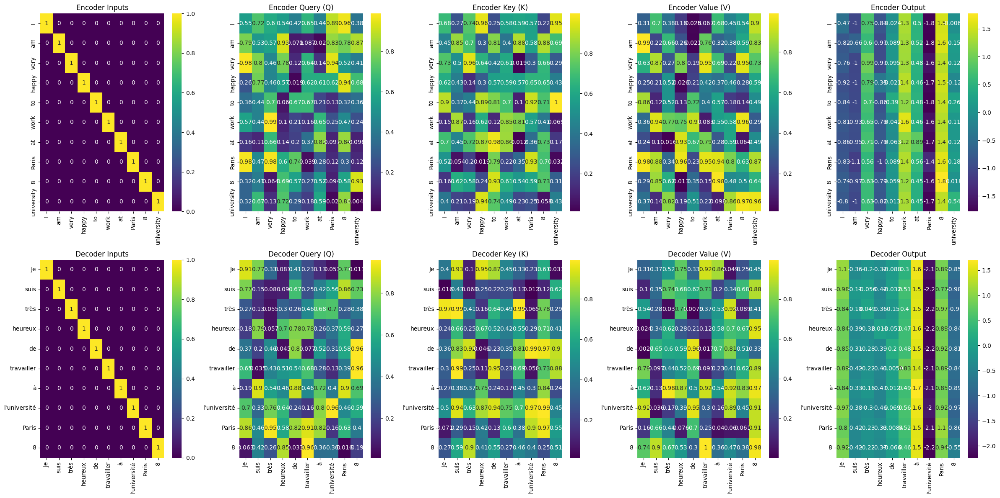

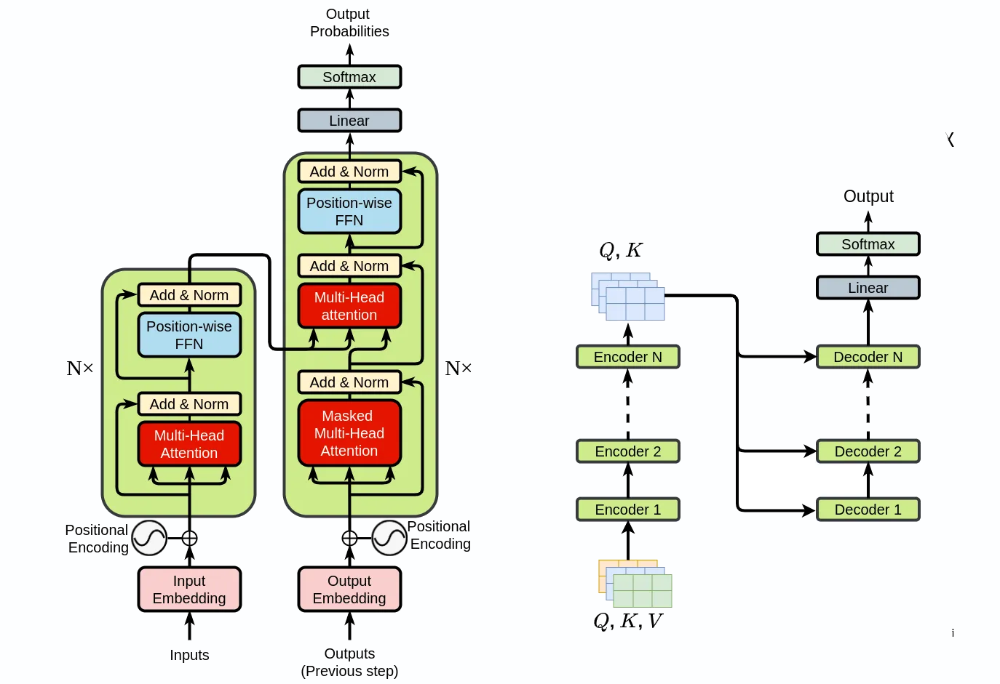

# Exercices 

### Exercice 1 : Self-Attention mechanism: basic implementation

- Modify the `input_sequence` to include an additional dimension and write a function to handle this new input shape. Compute and visualize the query, key, and value matrices for this modified sequence.
- Change the number of attention heads to 2 and implement the multi-head attention mechanism. Compute and visualize the attention weights and output. Compare the results with single-head attention.
- Experiment with different scaling factors for the attention scores. Instead of dividing by the square root of the key dimension, try different constants and observe the effects on the attention weights and output. Visualize and discuss the impact.

### Exercice 2: Self-Attention mechanism: Using a sentence as input

- Change the sentence from "I love tennis" to a longer sentence of your choice. Convert this new sentence into a sequence of embeddings and compute the query, key, and value matrices. Visualize and explain the results.
- Implement a masking mechanism to handle padding tokens in the sentence. Compute the attention scores and apply the mask before softmax. Visualize the attention weights with and without masking and discuss the differences.
- Experiment with different embedding initialization methods. Use random initialization and pre-trained embeddings (e.g., from GloVe or FastText). Compute and visualize the attention scores and outputs for both cases. Compare the results.

### Exercice 3: Self-Attention mechanism: Compute word embeddings

- Use a different sentence to compute word embeddings. Tokenize the sentence and create embeddings using a different method (e.g., Word2Vec or GloVe). Compute the query, key, and value matrices for these new embeddings and visualize the results.
- Change the method for initializing weights for the query, key, and value matrices. Use a different initialization technique (e.g., Xavier initialization) and compute the attention scores and attention weights. Visualize and discuss the impact of weight initialization on the self-attention mechanism.
- Implement a positional encoding mechanism for the sentence. Add positional encodings to the embeddings and compute the query, key, and value matrices. Visualize and explain the role of positional encoding in the self-attention mechanism.

### Exercice 4: Self-Attention mechanism: Varying Parameters

- Modify the dimensionality of the embeddings for a given sentence. Experiment with embedding dimensions of 4, 8, and 16. Compute the query, key, and value matrices for each case. Visualize and compare the attention weights and outputs for different embedding dimensions.
- Change the number of attention heads to 4 and implement the multi-head attention mechanism. Compute and visualize the attention weights and output. Compare the results with single-head and two-head attention.
- Implement dropout in the attention mechanism. Apply dropout to the attention weights before computing the final attention output. Visualize the results with and without dropout and discuss the impact on the attention mechanism.

### Exercice 5: Self-Attention mechanism: Advanced Techniques

- Implement layer normalization before and after the attention mechanism. Compare the results of both approaches by visualizing the attention weights and outputs. Discuss the impact of layer normalization on the self-attention mechanism.
- Experiment with different activation functions in the feed-forward layer following the attention mechanism. Replace ReLU with other functions (e.g., Leaky ReLU, ELU). Compute and visualize the attention outputs for each activation function and compare the results.
- Implement a mechanism to handle variable-length sequences using masking. Compute the attention scores and apply the mask to ignore padding tokens. Visualize the attention weights and outputs with and without masking and discuss the differences.

### Exercice 6: Self-Attention mechanism: Applications

- Apply the self-attention mechanism to a sentence with named entities (e.g., "Barack Obama was the 44th president of the United States"). Compute the query, key, and value matrices, and visualize the attention weights. Discuss how the self-attention mechanism handles named entities.
- Use the self-attention mechanism for a sequence-to-sequence task (e.g., translation). Compute the attention weights for both the encoder and decoder sequences. Visualize the results and discuss how the attention mechanism captures the relationships between input and output sequences.
- Implement a self-attention mechanism for a text classification task. Compute the attention weights for a sentence and use the final attention output as features for classification. Visualize the attention weights and discuss how the self-attention mechanism helps in identifying important features for classification.

### Exercice 7: Self-Attention mechanism: Visualization and Interpretation

- Use a heatmap to visualize the attention weights for a given sentence. Write a function to plot the heatmap and explain the importance of each word in the context of the sentence.
- Modify the input sentence to include ambiguous words (e.g., "bank" in "The bank will not lend me money"). Compute and visualize the attention weights. Discuss how the self-attention mechanism disambiguates the meaning based on context.
- Implement an interactive visualization tool that allows changing the input sentence and observing the changes in attention weights. Use this tool to demonstrate how different words and their positions affect the attention mechanism.

### Exercice 8: Self-Attention mechanism: Extensions and Modifications

- Extend the self-attention mechanism to include relative position encodings. Compute the attention weights with relative positions and visualize the results. Discuss how relative position encodings improve the model's understanding of the input sequence.
- Implement a variant of the self-attention mechanism that uses a different similarity measure (e.g., cosine similarity instead of dot product). Compute and visualize the attention weights for this new similarity measure and compare the results with the original mechanism.
- Explore the use of multi-headed attention with different numbers of heads. Write functions to compute the attention weights for 1, 2, 4, and 8 heads. Visualize and compare the results, discussing how the number of heads affects the model's performance and complexity.

### Exercice 9: Self-Attention mechanism: Practical Applications

- Apply the self-attention mechanism to a real-world dataset (e.g., a collection of movie reviews). Compute the attention weights for sample sentences and visualize the results. Discuss how the self-attention mechanism captures sentiment and important phrases in the reviews.
- Implement a self-attention mechanism for a document summarization task. Use the attention weights to identify key sentences and generate a summary of the document. Visualize and evaluate the quality of the summary.
- Use the self-attention mechanism to build a question-answering system. Compute the attention weights for questions and corresponding context paragraphs. Visualize the attention weights and discuss how the model identifies relevant information to answer the questions.

# Exercice1

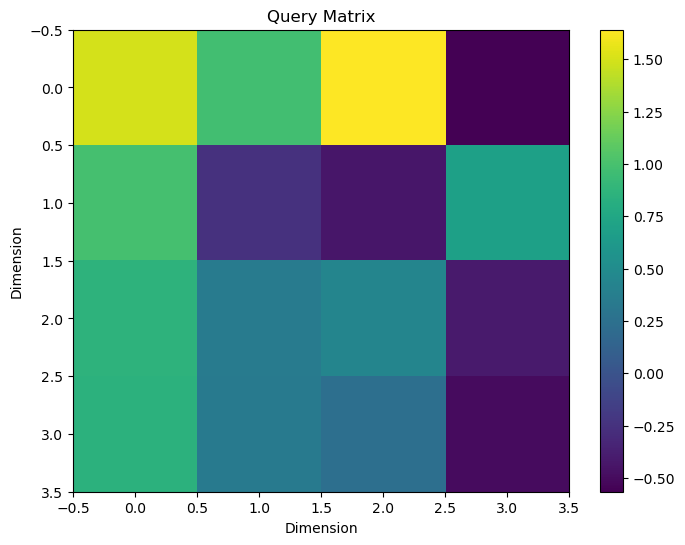

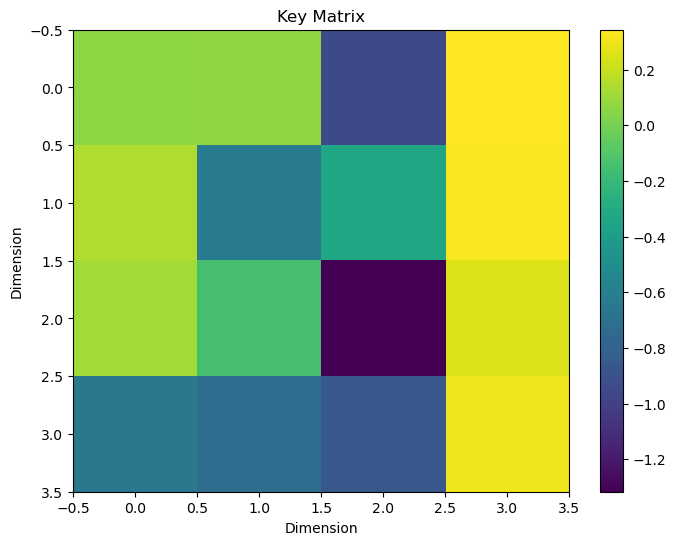

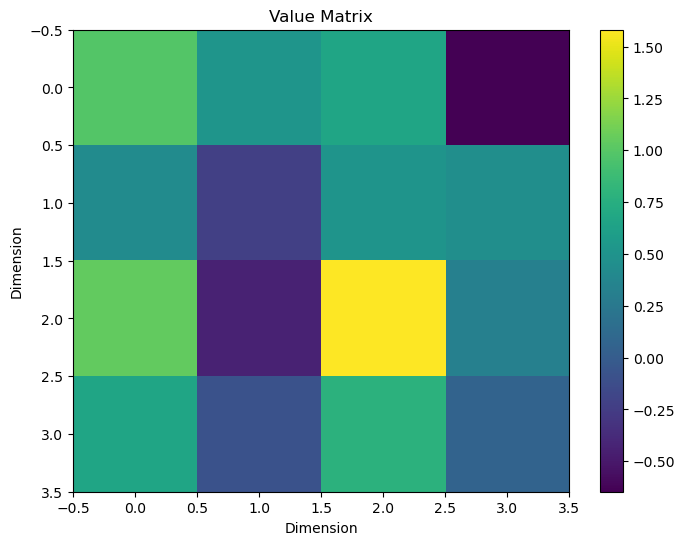

Input Sequence:
 [[1 0 1 0]
 [0 2 1 0]
 [1 1 0 1]
 [1 1 0 0]]
Query Matrix:
 [[ 1.4971253   0.9692209   1.6415106  -0.5655926 ]
 [ 0.9913407  -0.25455874 -0.4315186   0.6900067 ]
 [ 0.86289436  0.35620344  0.44006383 -0.40598232]
 [ 0.85491735  0.34742862  0.23972934 -0.50200135]]
Key Matrix:
 [[ 0.06409281  0.06958604 -0.9516184   0.34365398]
 [ 0.14454848 -0.62696856 -0.33692843  0.3250116 ]
 [ 0.11158693 -0.14584208 -1.3163685   0.25841856]
 [-0.6512582  -0.7254632  -0.8643244   0.30681586]]
Value Matrix:
 [[ 0.98816633  0.5151955   0.6655658  -0.6468146 ]
 [ 0.42832047 -0.22892493  0.50922155  0.4535979 ]
 [ 1.0496389  -0.43252933  1.5816402   0.32117796]
 [ 0.6594098  -0.08607388  0.78518796  0.06094915]]
Attention Scores:
 [[-0.02203754 -1.7590909  -1.5271722  -1.3735359 ]
 [ 0.7227464  -0.19476736  1.4505671   0.98451984]
 [ 0.30393922 -2.6573932  -1.1295092  -1.0332675 ]
 [-0.04321513 -1.9052503  -1.2218688  -0.814652  ]]
Attention Weights:
 [[0.60354483 0.10624703 0.13397934 0

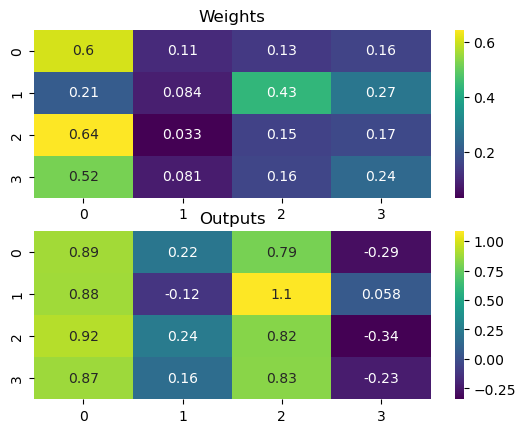

In [19]:
# Exo 1 

import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

def plot_matrix(matrix, title):
    plt.figure(figsize=(8, 6))
    plt.imshow(matrix, cmap='viridis', aspect='auto')
    plt.colorbar()
    plt.title(title)
    plt.xlabel('Dimension')
    plt.ylabel('Dimension')
    plt.show()

# Input sequence: a matrix where each row represents a feature vector for a sequence element
input_sequence = np.array([[1, 0, 1, 0],
                           [0, 2, 1, 0],
                           [1, 1, 0, 1],
                           [1, 1, 0, 0]])

# Model parameters
d_model = input_sequence.shape[1]  # Dimension of the embeddings
num_heads = 1  # Number of attention heads (single head for simplicity)

# Create query, key, and value matrices using linear transformations (Dense layers)
query = tf.keras.layers.Dense(d_model)(input_sequence)
key = tf.keras.layers.Dense(d_model)(input_sequence)
value = tf.keras.layers.Dense(d_model)(input_sequence)

# Visualize the query, key, and value matrices
plot_matrix(query, "Query Matrix")
plot_matrix(key, "Key Matrix")
plot_matrix(value, "Value Matrix")

# Compute attention scores by performing dot product of queries and transposed keys
#scores = tf.matmul(query, key, transpose_b=True)
#plot_matrix(scores, "Attention Scores (QK^T)")

# Apply softmax to the scores to obtain attention weights

attention_weights = tf.nn.softmax(scores, axis=-1)
plt.subplot(2,1,1)
sns.heatmap(attention_weights, annot=True, cmap='viridis')
plt.title("Weights")

# Apply attention weights to the values to get the final attention output
attention_output = tf.matmul(attention_weights, value)
plt.subplot(2,1,2)
sns.heatmap(attention_output, annot=True, cmap='viridis')
plt.title("Outputs")

# Print the results for reference
print("Input Sequence:\n", input_sequence)
print("Query Matrix:\n", query.numpy())
print("Key Matrix:\n", key.numpy())
print("Value Matrix:\n", value.numpy())
print("Attention Scores:\n", scores.numpy())
print("Attention Weights:\n", attention_weights.numpy())
print("Attention Output:\n", attention_output.numpy())

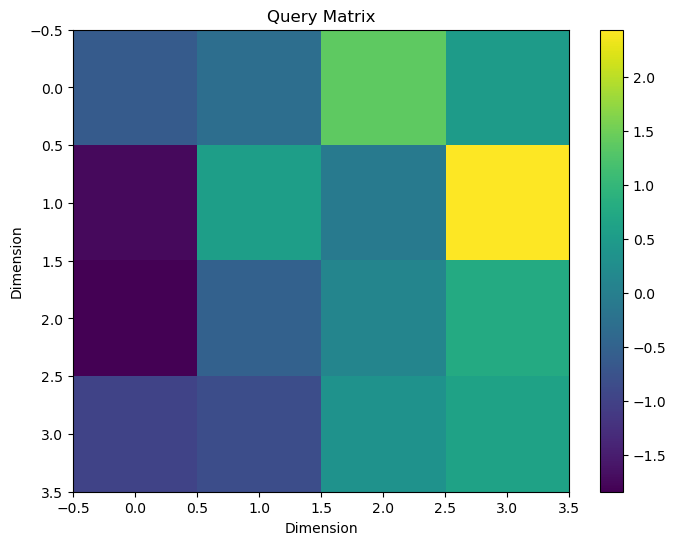

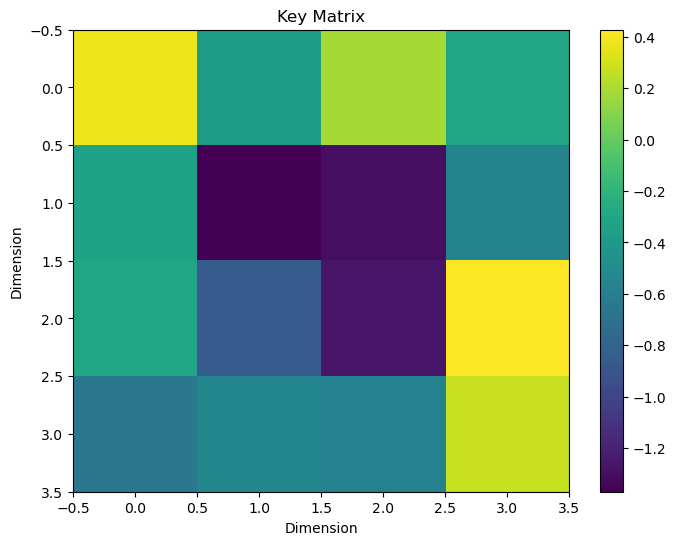

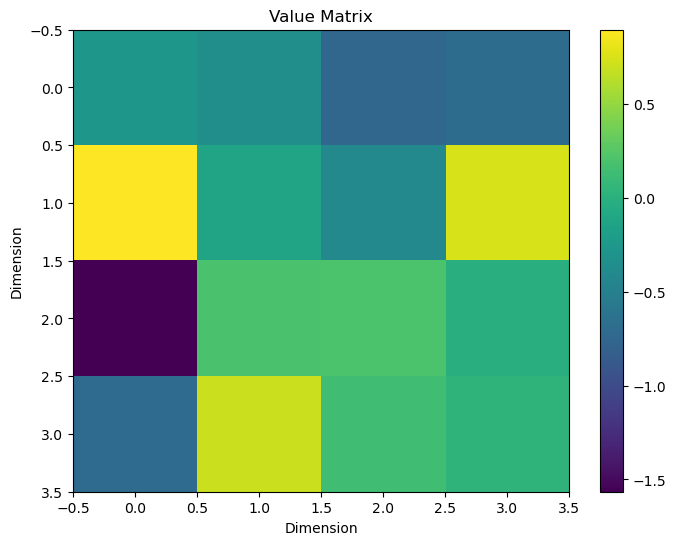

Input Sequence:
 [[1 0 1 0]
 [0 2 1 0]
 [1 1 0 1]
 [1 1 0 0]]
Query Matrix:
 [[-0.60535556 -0.29894358  1.3845501   0.50919265]
 [-1.7403156   0.5583767  -0.09976953  2.4392495 ]
 [-1.8426297  -0.50829214  0.11313653  0.7775667 ]
 [-0.986535   -0.83289933  0.34519905  0.61879426]]
Key Matrix:
 [[ 0.38046342 -0.37599128  0.1873287  -0.30580622]
 [-0.3298663  -1.3694558  -1.3034868  -0.5647594 ]
 [-0.3129854  -0.8467611  -1.2621574   0.42739654]
 [-0.65925956 -0.53573126 -0.58166903  0.27426177]]
Value Matrix:
 [[-0.2629648  -0.3494553  -0.75526994 -0.69760287]
 [ 0.89570326 -0.12587976 -0.40569198  0.74897563]
 [-1.5655165   0.19037992  0.19686711 -0.0141474 ]
 [-0.70336074  0.7015929   0.13864219  0.0356093 ]]


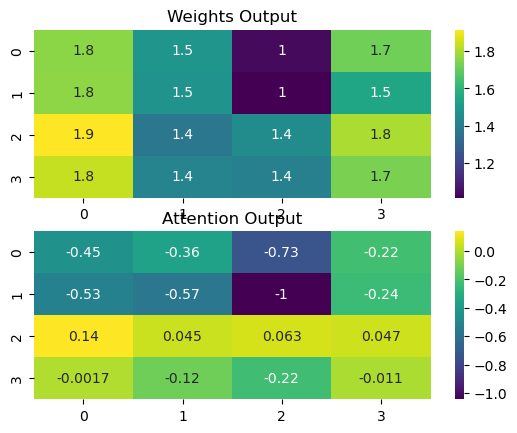

In [18]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

def plot_matrix(matrix, title):
    plt.figure(figsize=(8, 6))
    plt.imshow(matrix, cmap='viridis', aspect='auto')
    plt.colorbar()
    plt.title(title)
    plt.xlabel('Dimension')
    plt.ylabel('Dimension')
    plt.show()
def softmax(x):
    return np.exp(x) / np.sum(np.exp(x), axis=-1, keepdims=True)
    
def multi_head_attention(Q, K, V, num_heads):
    d_model = Q.shape[-1] # Get the embedding dimension
    d_k = d_model // num_heads # Calculate the dimension of each head
    
    # Linear transformations for each head
    Q_heads = [np.dot(Q, np.random.rand(d_model, d_k)) for _ in range(num_heads)] 
    K_heads = [np.dot(K, np.random.rand(d_model, d_k)) for _ in range(num_heads)]
    V_heads = [np.dot(V, np.random.rand(d_model, d_k)) for _ in range(num_heads)]
    
    attention_outputs = []
    attention_weights = []
    for i in range(num_heads):
        scores = np.dot(Q_heads[i], K_heads[i].T) / np.sqrt(d_k)
        attention_weight = softmax(scores)
        attention_weights.append(attention_weight)
        attention_output = np.dot(attention_weight, V_heads[i])
        attention_outputs.append(attention_output)
    
    # Concatenate all the heads
    concatenated_output = np.concatenate(attention_outputs, axis=-1)
    concatenated_weight_out = np.concatenate(attention_weights, axis=-1)
    
    # Linear transformation to map the concatenated output back to the original dimension
    output = np.dot(concatenated_output, np.random.rand(concatenated_output.shape[-1], d_model))
    output2 = np.dot(concatenated_weight_out, np.random.rand(concatenated_weight_out.shape[-1], d_model))
    return output2 , output
# Input sequence: a matrix where each row represents a feature vector for a sequence element
input_sequence = np.array([[1, 0, 1, 0],
                           [0, 2, 1, 0],
                           [1, 1, 0, 1],
                           [1, 1, 0, 0]])

# Model parameters
d_model = input_sequence.shape[1]  # Dimension of the embeddings
num_heads = 3  # Number of attention heads (single head for simplicity)

# Create query, key, and value matrices using linear transformations (Dense layers)
query = tf.keras.layers.Dense(d_model)(input_sequence)
key = tf.keras.layers.Dense(d_model)(input_sequence)
value = tf.keras.layers.Dense(d_model)(input_sequence)

# Visualize the query, key, and value matrices
plot_matrix(query, "Query Matrix")
plot_matrix(key, "Key Matrix")
plot_matrix(value, "Value Matrix")


# Apply softmax to the scores to obtain attention weights
attention_weights,attention_output = multi_head_attention(query,key,value,num_heads)
# Plotting output
plt.subplot(2,1,1)
sns.heatmap(attention_weights, annot=True, cmap='viridis')
plt.title('Weights Output')

plt.subplot(2,1,2)
sns.heatmap(attention_output, annot=True, cmap='viridis')
plt.title('Attention Output')


# Print the results for reference
print("Input Sequence:\n", input_sequence)
print("Query Matrix:\n", query.numpy())
print("Key Matrix:\n", key.numpy())
print("Value Matrix:\n", value.numpy())
#print("Attention Scores:\n", scores.numpy())
#print("Attention Weights:\n", attention_weights.numpy())
#print("Attention Output:\n", attention_output.numpy())

On constate que la difference entre multi attention et une seule tête , les resultats pour multi tête sont plus cohérents et meilleurs

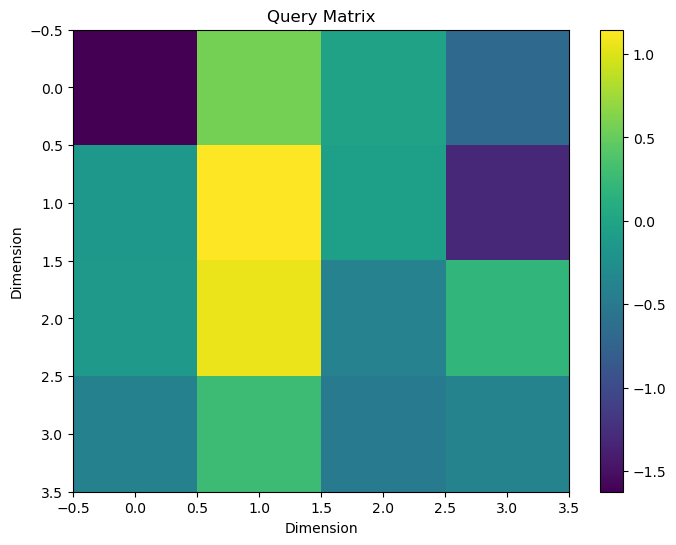

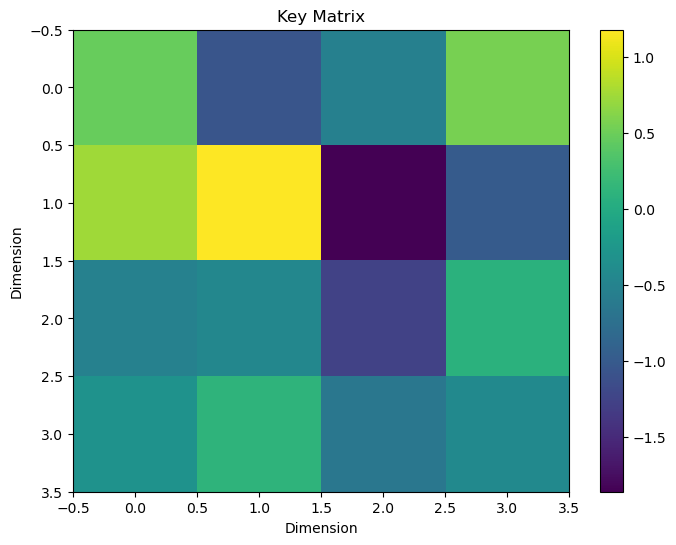

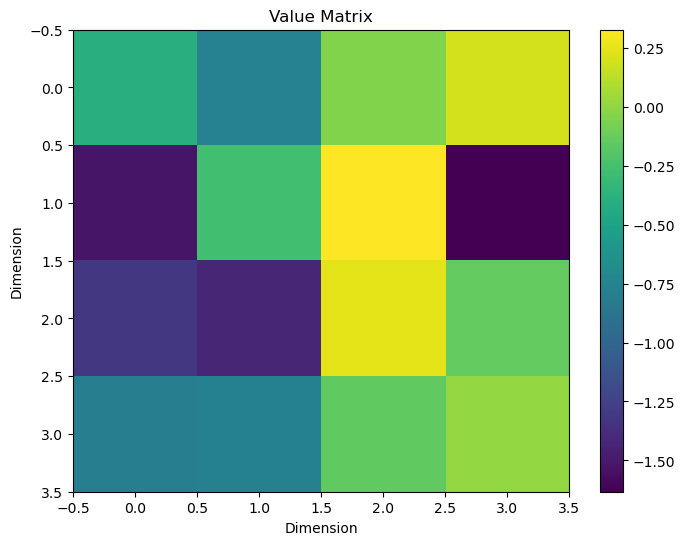

Input Sequence:
 [[1 0 1 0]
 [0 2 1 0]
 [1 1 0 1]
 [1 1 0 0]]
Query Matrix:
 [[-1.6233921   0.5677589  -0.02651608 -0.6801445 ]
 [-0.1489312   1.1455827  -0.05915076 -1.3026727 ]
 [-0.13835788  1.0680325  -0.39203805  0.1995368 ]
 [-0.40750152  0.27145207 -0.49805737 -0.38007253]]
Key Matrix:
 [[ 0.46762645 -1.0521643  -0.5379032   0.5573144 ]
 [ 0.7391551   1.177592   -1.8581088  -0.98762876]
 [-0.52642226 -0.4512846  -1.2536654   0.08248055]
 [-0.30935407  0.11376697 -0.6503375  -0.4152438 ]]
Value Matrix:
 [[-0.40247995 -0.76290995 -0.04451692  0.1909408 ]
 [-1.5180862  -0.26749855  0.32599384 -1.63258   ]
 [-1.3137563  -1.4196588   0.24567777 -0.14321256]
 [-0.7950189  -0.7689409  -0.15587413  0.01177412]]


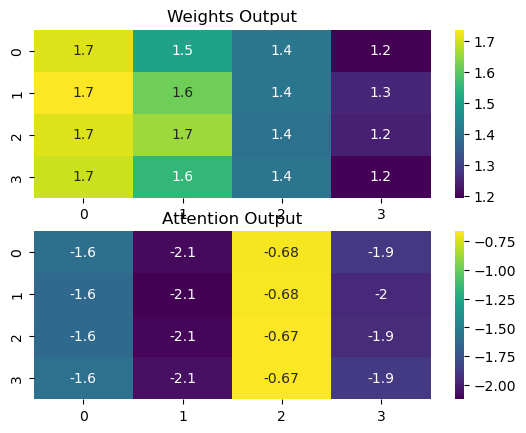

In [20]:
def plot_matrix(matrix, title):
    plt.figure(figsize=(8, 6))
    plt.imshow(matrix, cmap='viridis', aspect='auto')
    plt.colorbar()
    plt.title(title)
    plt.xlabel('Dimension')
    plt.ylabel('Dimension')
    plt.show()
def softmax(x):
    return np.exp(x) / np.sum(np.exp(x), axis=-1, keepdims=True)
    
def multi_head_attention(Q, K, V, num_heads):
    d_model = Q.shape[-1] # Get the embedding dimension
    d_k = d_model // num_heads # Calculate the dimension of each head
    
    # Linear transformations for each head
    Q_heads = [np.dot(Q, np.random.rand(d_model, d_k)) for _ in range(num_heads)] 
    K_heads = [np.dot(K, np.random.rand(d_model, d_k)) for _ in range(num_heads)]
    V_heads = [np.dot(V, np.random.rand(d_model, d_k)) for _ in range(num_heads)]
    
    attention_outputs = []
    attention_weights = []
    for i in range(num_heads):
        scores = np.dot(Q_heads[i], K_heads[i].T) / d_k
        attention_weight = softmax(scores)
        attention_weights.append(attention_weight)
        attention_output = np.dot(attention_weight, V_heads[i])
        attention_outputs.append(attention_output)
    
    # Concatenate all the heads
    concatenated_output = np.concatenate(attention_outputs, axis=-1)
    concatenated_weight_out = np.concatenate(attention_weights, axis=-1)
    
    # Linear transformation to map the concatenated output back to the original dimension
    output = np.dot(concatenated_output, np.random.rand(concatenated_output.shape[-1], d_model))
    output2 = np.dot(concatenated_weight_out, np.random.rand(concatenated_weight_out.shape[-1], d_model))
    return output2 , output
# Input sequence: a matrix where each row represents a feature vector for a sequence element
input_sequence = np.array([[1, 0, 1, 0],
                           [0, 2, 1, 0],
                           [1, 1, 0, 1],
                           [1, 1, 0, 0]])

# Model parameters
d_model = input_sequence.shape[1]  # Dimension of the embeddings
num_heads = 3  # Number of attention heads (single head for simplicity)

# Create query, key, and value matrices using linear transformations (Dense layers)
query = tf.keras.layers.Dense(d_model)(input_sequence)
key = tf.keras.layers.Dense(d_model)(input_sequence)
value = tf.keras.layers.Dense(d_model)(input_sequence)

# Visualize the query, key, and value matrices
plot_matrix(query, "Query Matrix")
plot_matrix(key, "Key Matrix")
plot_matrix(value, "Value Matrix")


# Apply softmax to the scores to obtain attention weights
attention_weights,attention_output = multi_head_attention(query,key,value,num_heads)
# Plotting output
plt.subplot(2,1,1)
sns.heatmap(attention_weights, annot=True, cmap='viridis')
plt.title('Weights Output')

plt.subplot(2,1,2)
sns.heatmap(attention_output, annot=True, cmap='viridis')
plt.title('Attention Output')


# Print the results for reference
print("Input Sequence:\n", input_sequence)
print("Query Matrix:\n", query.numpy())
print("Key Matrix:\n", key.numpy())
print("Value Matrix:\n", value.numpy())
#print("Attention Scores:\n", scores.numpy())
#print("Attention Weights:\n", attention_weights.numpy())
#print("Attention Output:\n", attention_output.numpy())

Lorsque je divise par la dimension aulieu de la racine carée on voit que le résultat est complétement faussé 

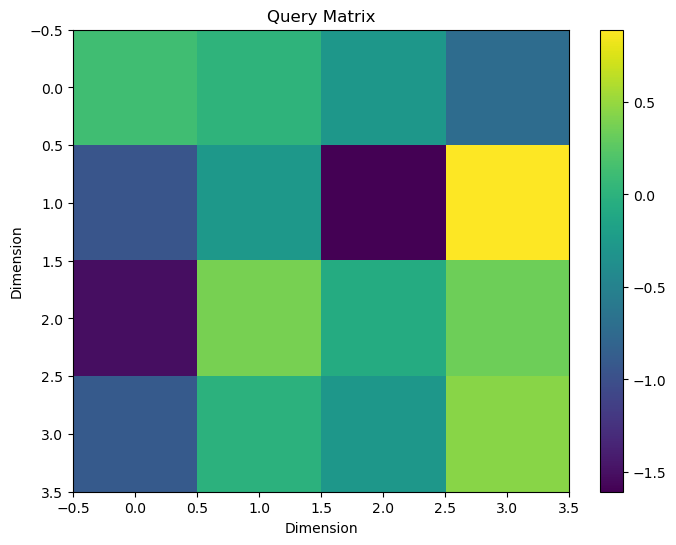

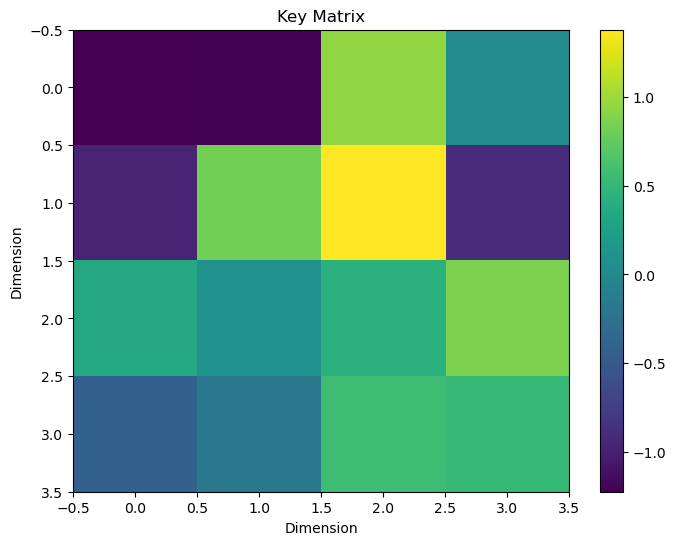

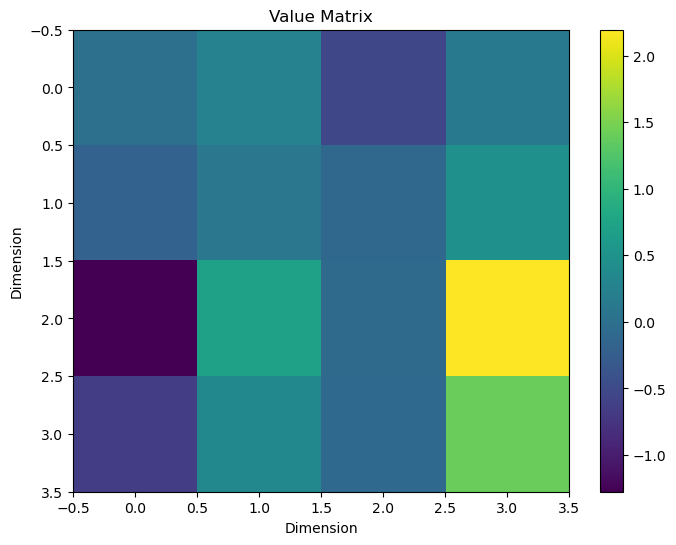

Input Sequence:
 [[1 0 1 0]
 [0 2 1 0]
 [1 1 0 1]
 [1 1 0 0]]
Query Matrix:
 [[ 1.24141276e-01  1.73950195e-02 -2.86506593e-01 -7.20409632e-01]
 [-9.51228201e-01 -2.79450119e-01 -1.60682917e+00  8.90017390e-01]
 [-1.51173162e+00  3.78888130e-01 -7.10083246e-02  3.43594730e-01]
 [-9.04401362e-01 -1.10179186e-03 -2.89899051e-01  4.43952858e-01]]
Key Matrix:
 [[-1.2240082  -1.2068388   0.9477614   0.03505558]
 [-0.97146195  0.82136375  1.3791895  -0.89828944]
 [ 0.34968233  0.08808976  0.44014293  0.8638512 ]
 [-0.41295058 -0.18569112  0.56990826  0.5209182 ]]
Value Matrix:
 [[ 0.01007131  0.25656962 -0.54214215  0.12059981]
 [-0.18259293  0.10011989 -0.10911644  0.46022916]
 [-1.2753228   0.707407   -0.06962967  2.1935883 ]
 [-0.64827085  0.3441611  -0.08476251  1.3991071 ]]


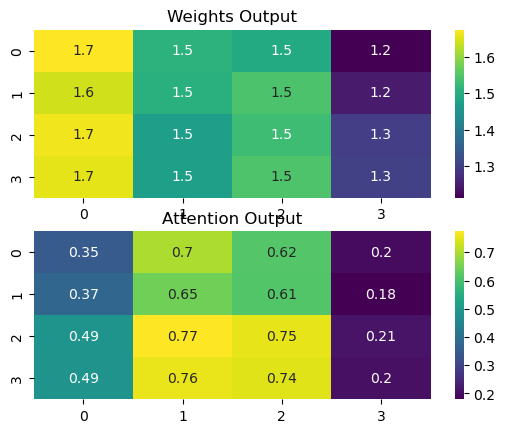

In [21]:
def plot_matrix(matrix, title):
    plt.figure(figsize=(8, 6))
    plt.imshow(matrix, cmap='viridis', aspect='auto')
    plt.colorbar()
    plt.title(title)
    plt.xlabel('Dimension')
    plt.ylabel('Dimension')
    plt.show()
def softmax(x):
    return np.exp(x) / np.sum(np.exp(x), axis=-1, keepdims=True)
    
def multi_head_attention(Q, K, V, num_heads):
    d_model = Q.shape[-1] # Get the embedding dimension
    d_k = d_model // num_heads # Calculate the dimension of each head
    
    # Linear transformations for each head
    Q_heads = [np.dot(Q, np.random.rand(d_model, d_k)) for _ in range(num_heads)] 
    K_heads = [np.dot(K, np.random.rand(d_model, d_k)) for _ in range(num_heads)]
    V_heads = [np.dot(V, np.random.rand(d_model, d_k)) for _ in range(num_heads)]
    
    attention_outputs = []
    attention_weights = []
    for i in range(num_heads):
        scores = np.dot(Q_heads[i], K_heads[i].T) / np.sqrt(1.5)
        attention_weight = softmax(scores)
        attention_weights.append(attention_weight)
        attention_output = np.dot(attention_weight, V_heads[i])
        attention_outputs.append(attention_output)
    
    # Concatenate all the heads
    concatenated_output = np.concatenate(attention_outputs, axis=-1)
    concatenated_weight_out = np.concatenate(attention_weights, axis=-1)
    
    # Linear transformation to map the concatenated output back to the original dimension
    output = np.dot(concatenated_output, np.random.rand(concatenated_output.shape[-1], d_model))
    output2 = np.dot(concatenated_weight_out, np.random.rand(concatenated_weight_out.shape[-1], d_model))
    return output2 , output
# Input sequence: a matrix where each row represents a feature vector for a sequence element
input_sequence = np.array([[1, 0, 1, 0],
                           [0, 2, 1, 0],
                           [1, 1, 0, 1],
                           [1, 1, 0, 0]])

# Model parameters
d_model = input_sequence.shape[1]  # Dimension of the embeddings
num_heads = 3  # Number of attention heads (single head for simplicity)

# Create query, key, and value matrices using linear transformations (Dense layers)
query = tf.keras.layers.Dense(d_model)(input_sequence)
key = tf.keras.layers.Dense(d_model)(input_sequence)
value = tf.keras.layers.Dense(d_model)(input_sequence)

# Visualize the query, key, and value matrices
plot_matrix(query, "Query Matrix")
plot_matrix(key, "Key Matrix")
plot_matrix(value, "Value Matrix")


# Apply softmax to the scores to obtain attention weights
attention_weights,attention_output = multi_head_attention(query,key,value,num_heads)
# Plotting output
plt.subplot(2,1,1)
sns.heatmap(attention_weights, annot=True, cmap='viridis')
plt.title('Weights Output')

plt.subplot(2,1,2)
sns.heatmap(attention_output, annot=True, cmap='viridis')
plt.title('Attention Output')


# Print the results for reference
print("Input Sequence:\n", input_sequence)
print("Query Matrix:\n", query.numpy())
print("Key Matrix:\n", key.numpy())
print("Value Matrix:\n", value.numpy())
#print("Attention Scores:\n", scores.numpy())
#print("Attention Weights:\n", attention_weights.numpy())
#print("Attention Output:\n", attention_output.numpy())

Et lorsque je remplace par racine de 1.5 j'obtiens d'autres resultats qui eux aussi ne sont pas cohérents

# Exercice2 

In [3]:
import gensim.downloader as api

# Charger un modèle GloVe léger (25 dimensions)
model = api.load("glove-wiki-gigaword-50")   # ou glove-wiki-gigaword-100, 200, 300

# Exemple : obtenir le vecteur d’un mot
print(model["love"])

# Générer les embeddings de ta phrase
#sentence = ["I", "love", "playing", "video", "games"]
#embeddings_glove = np.array([model[word] if word in model else np.zeros(50) for word in sentence])
#print(embeddings_glove.shape)


[-0.13886    1.1401    -0.85212   -0.29212    0.75534    0.82762
 -0.3181     0.0072204 -0.34762    1.0731    -0.24665    0.97765
 -0.55835   -0.090318   0.83182   -0.33317    0.22648    0.30913
  0.026929  -0.086739  -0.14703    1.3543     0.53695    0.43735
  1.2749    -1.4382    -1.2815    -0.15196    1.0506    -0.93644
  2.7561     0.58967   -0.29473    0.27574   -0.32928   -0.201
 -0.28547   -0.45987   -0.14603   -0.69372    0.070761  -0.19326
 -0.1855    -0.16095    0.24268    0.20784    0.030924  -1.3711
 -0.28606    0.2898   ]


Masque de padding (1=masqué, 0=visible):
[[0 0 0 0 0 1 1]
 [0 0 0 0 0 1 1]
 [0 0 0 0 0 1 1]
 [0 0 0 0 0 1 1]
 [0 0 0 0 0 1 1]
 [1 1 1 1 1 1 1]
 [1 1 1 1 1 1 1]]


C:\Users\macta\anaconda3\Lib\site-packages\seaborn\utils.py:61: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
C:\Users\macta\anaconda3\Lib\site-packages\seaborn\utils.py:61: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
C:\Users\macta\AppData\Local\Temp\ipykernel_11468\3786206373.py:176: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig('attention_with_masking.png', dpi=150, bbox_inches='tight')
C:\Users\macta\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


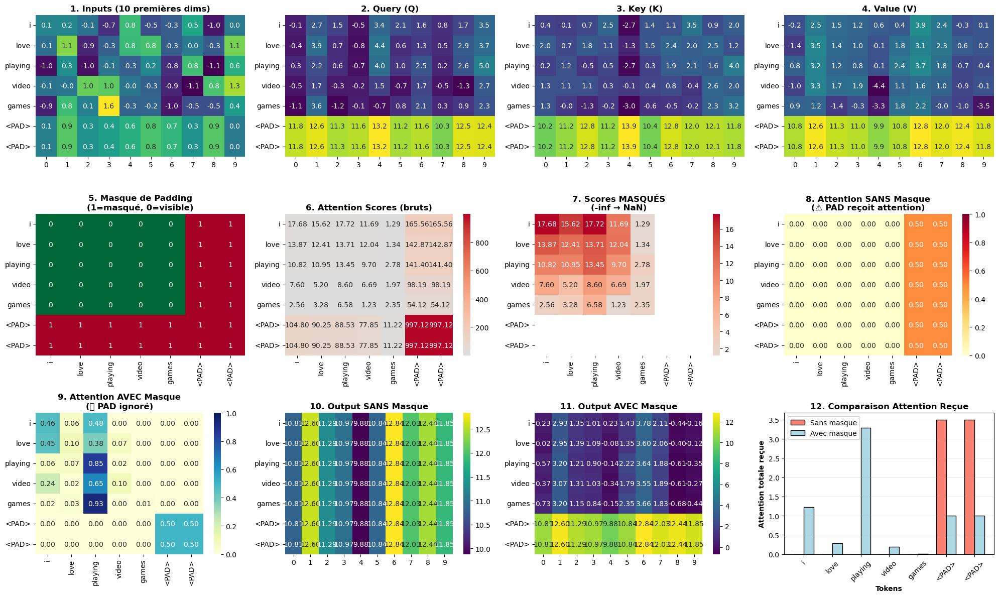

ANALYSE DE L'ATTENTION AVEC MASKING

Phrase: ['i', 'love', 'playing', 'video', 'games', '<PAD>', '<PAD>']
Nombre de tokens: 7 (dont 2 <PAD>)

📊 Statistiques SANS masque:
   - Attention moyenne sur <PAD>: 0.5000
   - Attention moyenne sur vrais mots: 0.0000

✅ Statistiques AVEC masque:
   - Attention moyenne sur <PAD>: 0.1429
   - Attention moyenne sur vrais mots: 0.1429

💡 Observations:
   - SANS masque: Les tokens <PAD> reçoivent de l'attention (incorrect)
   - AVEC masque: Les tokens <PAD> sont complètement ignorés (correct)
   - Le masque force l'attention à ~0 pour les positions padding

Inputs shape: (7, 50)
Query (Q) shape: (7, 50)
Key (K) shape: (7, 50)
Value (V) shape: (7, 50)
Attention Scores shape: (7, 7)
Padding mask shape: (7, 7)


In [9]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import random

def softmax(x):
    x_shifted = x - np.max(x, axis=-1, keepdims=True)
    exp_x = np.exp(x_shifted)
    return exp_x / np.sum(exp_x, axis=-1, keepdims=True)

def apply_mask(scores, mask):
    masked_scores = scores.copy()
    masked_scores += (mask * -1e9)  # Les positions masquées deviennent -inf
    return masked_scores

def create_padding_mask(sentence, pad_token="<PAD>"):
    """Crée un masque pour ignorer les tokens <PAD>"""
    mask = np.zeros((len(sentence), len(sentence)))
    for i, word in enumerate(sentence):
        if word == pad_token:
            mask[i, :] = 1  # Masquer la ligne (query = PAD)
            mask[:, i] = 1  # Masquer la colonne (key = PAD)
    return mask

# Exemple avec phrase plus longue et <PAD>
embeddings_manual = {
    "i": [random.uniform(0, 1) for i in range(50)],
    "love": [random.uniform(0, 1) for i in range(50)],
    "playing": [random.uniform(0, 1) for i in range(50)],
    "video": [random.uniform(0, 1) for i in range(50)],
    "games": [random.uniform(0, 1) for i in range(50)],
    "<PAD>": [0.0 for i in range(50)]  # token de padding (vecteur nul)
}

# Simulons des embeddings "pré-entraînés" (valeurs différentes)
embeddings_glove = {
    "i": model["i"],
    "love": model["love"],
    "playing": model["playing"],
    "video": model["video"],
    "games": model["games"],
    "<PAD>": [random.uniform(0, 1) for i in range(50)]  
}

# Sélection de la méthode d'embedding
use_glove = True  # ← Change entre True / False pour comparer et changer les embeddings
embeddings = embeddings_glove if use_glove else embeddings_manual

# Convert sentence to sequence of embeddings (AVEC PADDING)
sentence = ["i", "love", "playing", "video", "games", "<PAD>", "<PAD>"]
inputs = np.array([embeddings[word] for word in sentence])

# Créer le masque de padding
padding_mask = create_padding_mask(sentence, pad_token="<PAD>")
print("Masque de padding (1=masqué, 0=visible):")
print(padding_mask.astype(int))

# Initialize weights for Query, Key, and Value matrices
np.random.seed(0)
Wq = np.random.rand(50, 50)
Wk = np.random.rand(50, 50)
Wv = np.random.rand(50, 50)

# Compute Query, Key, and Value matrices
Q = np.dot(inputs, Wq)
K = np.dot(inputs, Wk)
V = np.dot(inputs, Wv)

# Compute attention scores
scores = np.dot(Q, K.T) / np.sqrt(K.shape[1])

# --- Attention SANS masque ---
attention_no_mask = softmax(scores)
output_no_mask = np.dot(attention_no_mask, V)

# --- Attention AVEC masque ---
masked_scores = apply_mask(scores, padding_mask)
attention_with_mask = softmax(masked_scores)
output_with_mask = np.dot(attention_with_mask, V)

# ============ VISUALISATION ============
plt.figure(figsize=(20, 12))

# 1. Inputs
plt.subplot(3, 4, 1)
sns.heatmap(inputs[:, :10], annot=True, fmt='.1f', cmap='viridis', 
            yticklabels=sentence, cbar=False)
plt.title('1. Inputs (10 premières dims)', fontweight='bold')

# 2. Query (Q) matrix
plt.subplot(3, 4, 2)
sns.heatmap(Q[:, :10], annot=True, fmt='.1f', cmap='viridis', 
            yticklabels=sentence, cbar=False)
plt.title('2. Query (Q)', fontweight='bold')

# 3. Key (K) matrix
plt.subplot(3, 4, 3)
sns.heatmap(K[:, :10], annot=True, fmt='.1f', cmap='viridis', 
            yticklabels=sentence, cbar=False)
plt.title('3. Key (K)', fontweight='bold')

# 4. Value (V) matrix
plt.subplot(3, 4, 4)
sns.heatmap(V[:, :10], annot=True, fmt='.1f', cmap='viridis', 
            yticklabels=sentence, cbar=False)
plt.title('4. Value (V)', fontweight='bold')

# 5. Masque de padding
plt.subplot(3, 4, 5)
sns.heatmap(padding_mask, annot=True, cmap='RdYlGn_r', 
            xticklabels=sentence, yticklabels=sentence, 
            cbar=False, vmin=0, vmax=1)
plt.title('5. Masque de Padding\n(1=masqué, 0=visible)', fontweight='bold')

# 6. Attention Scores (bruts, avant masque)
plt.subplot(3, 4, 6)
sns.heatmap(scores, annot=True, fmt='.2f', cmap='coolwarm', 
            xticklabels=sentence, yticklabels=sentence, cbar=True, center=0)
plt.title('6. Attention Scores (bruts)', fontweight='bold')

# 7. Attention Scores APRÈS masque (avant softmax)
plt.subplot(3, 4, 7)
# Afficher avec une échelle tronquée pour voir les valeurs non-inf
masked_scores_display = masked_scores.copy()
masked_scores_display[masked_scores_display < -1e8] = np.nan  # Remplacer -inf par NaN
sns.heatmap(masked_scores_display, annot=True, fmt='.2f', cmap='coolwarm', 
            xticklabels=sentence, yticklabels=sentence, cbar=True, center=0)
plt.title('7. Scores MASQUÉS\n(-inf → NaN)', fontweight='bold')

# 8. Attention Weights SANS masque
plt.subplot(3, 4, 8)
sns.heatmap(attention_no_mask, annot=True, fmt='.2f', cmap='YlOrRd', 
            xticklabels=sentence, yticklabels=sentence, 
            cbar=True, vmin=0, vmax=1)
plt.title('8. Attention SANS Masque\n(⚠️ PAD reçoit attention)', fontweight='bold')

# 9. Attention Weights AVEC masque
plt.subplot(3, 4, 9)
sns.heatmap(attention_with_mask, annot=True, fmt='.2f', cmap='YlGnBu', 
            xticklabels=sentence, yticklabels=sentence, 
            cbar=True, vmin=0, vmax=1)
plt.title('9. Attention AVEC Masque\n(✅ PAD ignoré)', fontweight='bold')

# 10. Output SANS masque
plt.subplot(3, 4, 10)
sns.heatmap(output_no_mask[:, :10], annot=True, fmt='.2f', cmap='viridis', 
            yticklabels=sentence, cbar=True)
plt.title('10. Output SANS Masque', fontweight='bold')

# 11. Output AVEC masque
plt.subplot(3, 4, 11)
sns.heatmap(output_with_mask[:, :10], annot=True, fmt='.2f', cmap='viridis', 
            yticklabels=sentence, cbar=True)
plt.title('11. Output AVEC Masque', fontweight='bold')

# 12. Comparaison des distributions d'attention
plt.subplot(3, 4, 12)
# Somme de l'attention reçue par chaque token
attention_received_no_mask = attention_no_mask.sum(axis=0)
attention_received_with_mask = attention_with_mask.sum(axis=0)

x = np.arange(len(sentence))
width = 0.35
plt.bar(x - width/2, attention_received_no_mask, width, 
        label='Sans masque', color='salmon', edgecolor='black')
plt.bar(x + width/2, attention_received_with_mask, width, 
        label='Avec masque', color='lightblue', edgecolor='black')
plt.xlabel('Tokens', fontweight='bold')
plt.ylabel('Attention totale reçue', fontweight='bold')
plt.title('12. Comparaison Attention Reçue', fontweight='bold')
plt.xticks(x, sentence, rotation=45)
plt.legend()
plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.savefig('attention_with_masking.png', dpi=150, bbox_inches='tight')
plt.show()

# ============ AFFICHAGE CONSOLE ============
print("=" * 70)
print("ANALYSE DE L'ATTENTION AVEC MASKING")
print("=" * 70)
print(f"\nPhrase: {sentence}")
print(f"Nombre de tokens: {len(sentence)} (dont {sentence.count('<PAD>')} <PAD>)")

print("\n📊 Statistiques SANS masque:")
print(f"   - Attention moyenne sur <PAD>: {attention_no_mask[:, -2:].mean():.4f}")
print(f"   - Attention moyenne sur vrais mots: {attention_no_mask[:, :-2].mean():.4f}")

print("\n✅ Statistiques AVEC masque:")
print(f"   - Attention moyenne sur <PAD>: {attention_with_mask[:, -2:].mean():.4f}")
print(f"   - Attention moyenne sur vrais mots: {attention_with_mask[:, :-2].mean():.4f}")

print("\n💡 Observations:")
print("   - SANS masque: Les tokens <PAD> reçoivent de l'attention (incorrect)")
print("   - AVEC masque: Les tokens <PAD> sont complètement ignorés (correct)")
print("   - Le masque force l'attention à ~0 pour les positions padding")

print("\n" + "=" * 70)
print("Inputs shape:", inputs.shape)
print("Query (Q) shape:", Q.shape)
print("Key (K) shape:", K.shape)
print("Value (V) shape:", V.shape)
print("Attention Scores shape:", scores.shape)
print("Padding mask shape:", padding_mask.shape)
print("=" * 70)

Les resultats sont bons on voit bien la forte relation entre I et love (sujet et verbe ) entre love et playing et entre video et games

Ensuite concernant le mask on constate que lorsqu'il est rajouter, notamment au niveau de la matrice d'attention après le softmax, que l'attention au niveau du pad est moindre voir quasi nulle ,

# Exercice3 

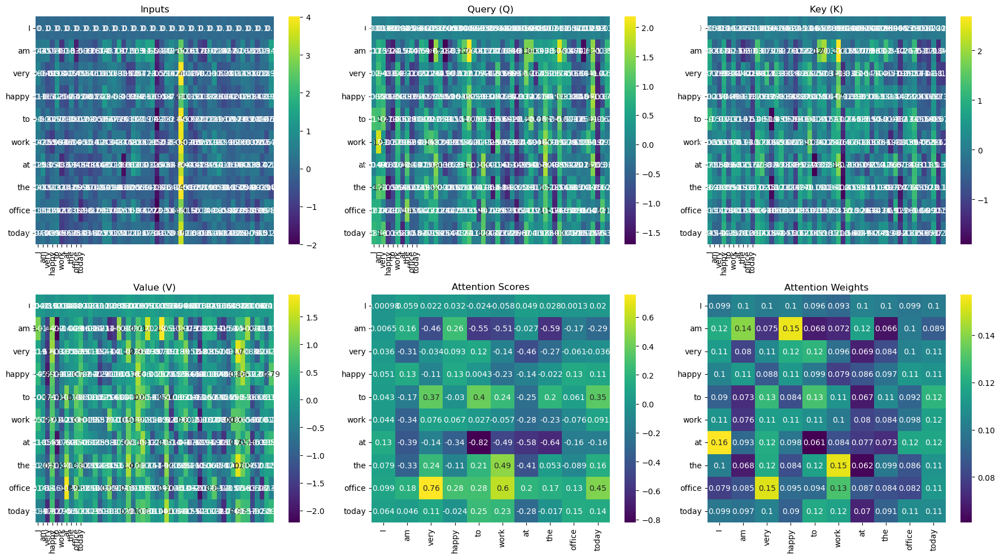

Sentence: ['I', 'am', 'very', 'happy', 'to', 'work', 'at', 'the', 'office', 'today']

Inputs:
 [[ 0.00000000e+00  1.00000000e-01  0.00000000e+00  1.00000000e-01
   0.00000000e+00  1.00000000e-01  0.00000000e+00  1.00000000e-01
   0.00000000e+00  1.00000000e-01  0.00000000e+00  1.00000000e-01
   0.00000000e+00  1.00000000e-01  0.00000000e+00  1.00000000e-01
   0.00000000e+00  1.00000000e-01  0.00000000e+00  1.00000000e-01
   0.00000000e+00  1.00000000e-01  0.00000000e+00  1.00000000e-01
   0.00000000e+00  1.00000000e-01  0.00000000e+00  1.00000000e-01
   0.00000000e+00  1.00000000e-01  0.00000000e+00  1.00000000e-01
   0.00000000e+00  1.00000000e-01  0.00000000e+00  1.00000000e-01
   0.00000000e+00  1.00000000e-01  0.00000000e+00  1.00000000e-01
   0.00000000e+00  1.00000000e-01  0.00000000e+00  1.00000000e-01
   0.00000000e+00  1.00000000e-01  0.00000000e+00  1.00000000e-01
   0.00000000e+00  1.00000000e-01]
 [ 4.30787089e-01  4.52080241e-01  5.53494814e-01 -4.37202062e-01
   5.9179637

In [65]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def positional_encoding(max_len, d_model):
    pos = np.arange(max_len)[:, np.newaxis]             # (max_len, 1)
    i = np.arange(d_model)[np.newaxis, :]               # (1, d_model)
    angle_rates = 1 / np.power(10000, (2 * (i // 2)) / d_model)
    angle_rads = pos * angle_rates

    # appliquer sin aux indices pairs, cos aux impairs
    pe = np.zeros_like(angle_rads)
    pe[:, 0::2] = np.sin(angle_rads[:, 0::2])
    pe[:, 1::2] = np.cos(angle_rads[:, 1::2])
    return pe
def softmax(x):
    return np.exp(x) / np.sum(np.exp(x), axis=-1, keepdims=True)
def xavier_init(n_in, n_out, uniform=True):
    if uniform:
        limit = np.sqrt(6 / (n_in + n_out))
        return np.random.uniform(-limit, limit, (n_in, n_out))
    else:
        std = np.sqrt(2 / (n_in + n_out))
        return np.random.normal(0, std, (n_in, n_out))
        
# Tokenize the sentence
sentence = "I am very happy to work at the office today".split()
embeddings_glove2 = np.array([model[word] if word in model else np.zeros(50) for word in sentence])
vocab_size = len(sentence)

# Convert sentence to sequence of embeddings
inputs = embeddings_glove2 + 0.1 * positional_encoding(vocab_size,50)

# Initialize weights for Query, Key, and Value matrices
Wq = xavier_init(50,50)
Wk = xavier_init(50,50)
Wv = xavier_init(50,50)

# Compute Query, Key, and Value matrices
Q = np.dot(inputs, Wq)
K = np.dot(inputs, Wk)
V = np.dot(inputs, Wv)

# Compute attention scores
scores = np.dot(Q, K.T) / np.sqrt(K.shape[1])

# Apply softmax to get attention weights
attention_weights = softmax(scores)

# Compute the output of the self-attention mechanism
output = np.dot(attention_weights, V)

# Visualization
plt.figure(figsize=(18, 10))

# Plotting the inputs
plt.subplot(2, 3, 1)
sns.heatmap(inputs, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Inputs')

# Plotting Query (Q) matrix
plt.subplot(2, 3, 2)
sns.heatmap(Q, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Query (Q)')

# Plotting Key (K) matrix
plt.subplot(2, 3, 3)
sns.heatmap(K, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Key (K)')

# Plotting Value (V) matrix
plt.subplot(2, 3, 4)
sns.heatmap(V, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Value (V)')

# Plotting Attention Scores
plt.subplot(2, 3, 5)
sns.heatmap(scores, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Attention Scores')

# Plotting Attention Weights
plt.subplot(2, 3, 6)
sns.heatmap(attention_weights, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Attention Weights')

plt.tight_layout()
plt.show()

print("Sentence:", sentence)
print("\nInputs:\n", inputs)
print("\nQuery (Q):\n", Q)
print("\nKey (K):\n", K)
print("\nValue (V):\n", V)
print("\nAttention Scores:\n", scores)
print("\nAttention Weights:\n", attention_weights)
print("\nOutput:\n", output)

Les resultats restent tres bons globalement
En changeant le mécanisme d'initialisation des poids, on observe une différence comparé aux résultats plus haut, la relation entre I et am est mieux capturé, et cela est valable pour tout les autres où l'on avait certaines identifications extreme et quasi tout le reste avait des score très bas, là il y'a plus de liaison entre les mots. Cependant pour une initialisation aléatoire les resultats ne sont pas très convaincant et sont assez aléatoires même avec du multi head
On rajoute le positionnal encoding améliore légérement les résultats mais pas énormement, quand à son role il permet au model de savoir où se trouve chaque mot, car si on change chaque mot de position la phrase n'a plus le meme sens 

# Exercice4

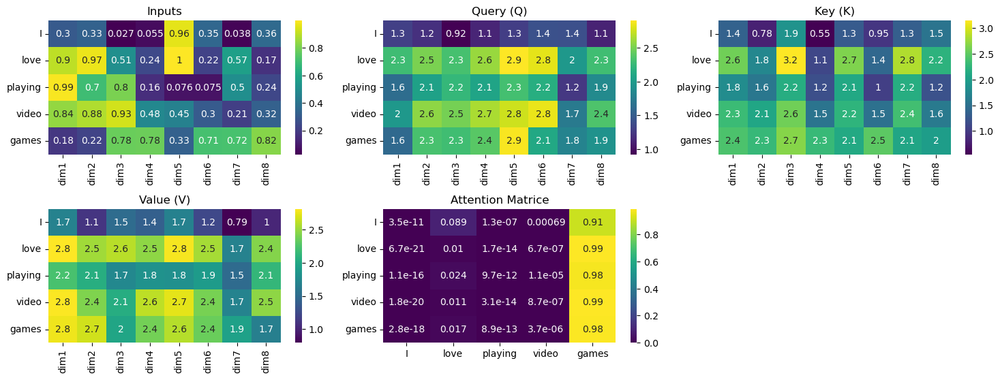

Phrase: ['I', 'love', 'playing', 'video', 'games']

Inputs:
 [[0.29978049 0.33099155 0.02733506 0.05454246 0.95906804 0.34933792
  0.03773337 0.35944226]
 [0.90287105 0.97041398 0.50911666 0.24084273 0.99906116 0.21802488
  0.57204534 0.16737963]
 [0.98879213 0.69753239 0.80289003 0.15587539 0.07636745 0.07478819
  0.50274421 0.2355755 ]
 [0.84215803 0.88212679 0.93076166 0.4810601  0.45029695 0.3019682
  0.20802819 0.32445024]
 [0.18264827 0.22358201 0.77695895 0.77973307 0.32668269 0.71164861
  0.7163113  0.82176349]]

Query (Q):
 [[1.30021731 1.2015847  0.92269777 1.13151179 1.28463827 1.41393774
  1.40414396 1.11444607]
 [2.2932988  2.50948078 2.31831926 2.59765871 2.90655404 2.82752362
  1.9807562  2.29825117]
 [1.62367576 2.06150407 2.24550511 2.08322871 2.31316126 2.16513427
  1.24142014 1.86527769]
 [1.97945825 2.56913404 2.48829897 2.65649758 2.75392697 2.84109622
  1.73286911 2.35115611]
 [1.59113402 2.32762439 2.29772444 2.38999212 2.88471646 2.1117555
  1.8076333  1.9360867

In [13]:
#DIM 8
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def softmax(x):
    return np.exp(x) / np.sum(np.exp(x), axis=-1, keepdims=True)

def multi_head_attention(Q, K, V, num_heads):
    d_model = Q.shape[-1] # Get the embedding dimension
    d_k = d_model // num_heads # Calculate the dimension of each head
    
    # Linear transformations for each head
    Q_heads = [np.dot(Q, np.random.rand(d_model, d_k)) for _ in range(num_heads)] 
    K_heads = [np.dot(K, np.random.rand(d_model, d_k)) for _ in range(num_heads)]
    V_heads = [np.dot(V, np.random.rand(d_model, d_k)) for _ in range(num_heads)]
    
    attention_outputs = []
    attention_weights = []
    for i in range(num_heads):
        scores = np.dot(Q_heads[i], K_heads[i].T) / np.sqrt(d_k)
        attention_weight = softmax(scores)
        attention_weights.append(attention_weight)
        attention_output = np.dot(attention_weight, V_heads[i])
        attention_outputs.append(attention_output)
    
    # Concatenate all the heads
    concatenated_output = np.concatenate(attention_outputs, axis=-1)    
    # Linear transformation to map the concatenated output back to the original dimension
    output = np.dot(concatenated_output, np.random.rand(concatenated_output.shape[-1], d_model))
    return attention_weights , output
def apply_mask(scores, mask):
    """Applique le masque avant le softmax"""
    masked_scores = scores.copy()
    masked_scores += (mask * -1e9)  # Les positions masquées deviennent -inf
    return masked_scores
# Example sentence embeddings (8 dimensions per word)
embeddings_manual = {
    "I": [random.uniform(0, 1) for i in range(8)],
    "love": [random.uniform(0, 1) for i in range(8)],
    "playing": [random.uniform(0, 1) for i in range(8)],
    "video": [random.uniform(0, 1) for i in range(8)],
    "games": [random.uniform(0, 1) for i in range(8)],
    "<PAD>": [random.uniform(0, 1) for i in range(8)]  # token de padding
}

embeddings = embeddings_manual

# Convert sentence to sequence of embeddings
sentence = ["I", "love", "playing","video","games"]

# Convert sentences to sequences of embeddings
inputs = np.array([embeddings[word] for word in sentence])
vocab_size = len(sentence)

# Initialize weights for Query, Key, and Value matrices
np.random.seed(0)
Wq = np.random.rand(8, 8)
Wk = np.random.rand(8, 8)
Wv = np.random.rand(8, 8)

# Compute Query, Key, and Value matrices
Q = np.dot(inputs, Wq)
K = np.dot(inputs, Wk)
V = np.dot(inputs, Wv)

# Apply softmax to the scores to obtain attention weights
attention_weights,attention_output = multi_head_attention(Q,K,V,4)

# Plotting the inputs
plt.figure(figsize=(15, 8))
plt.subplot(3, 3, 1)
sns.heatmap(inputs, annot=True, cmap='viridis', xticklabels=['dim1', 'dim2', 'dim3','dim4','dim5','dim6','dim7','dim8'], yticklabels=sentence)
plt.title('Inputs')

# Plotting Query (Q) matrix
plt.subplot(3, 3, 2)
sns.heatmap(Q, annot=True, cmap='viridis', xticklabels=['dim1', 'dim2', 'dim3','dim4','dim5','dim6','dim7','dim8'], yticklabels=sentence)
plt.title('Query (Q)')

# Plotting Key (K) matrix
plt.subplot(3, 3, 3)
sns.heatmap(K, annot=True, cmap='viridis', xticklabels=['dim1', 'dim2', 'dim3','dim4','dim5','dim6','dim7','dim8'], yticklabels=sentence)
plt.title('Key (K)')

# Plotting Value (V) matrix
plt.subplot(3, 3, 4)
sns.heatmap(V, annot=True, cmap='viridis', xticklabels=['dim1', 'dim2', 'dim3','dim4','dim5','dim6','dim7','dim8'], yticklabels=sentence)
plt.title('Value (V)')

# Plotting attention weight without mask
plt.subplot(3, 3, 5)
avg_attention = np.mean(attention_weights, axis=0)  # moyenne sur les têtes
sns.heatmap(avg_attention, annot=True, cmap='viridis',
            xticklabels=sentence, yticklabels=sentence)
plt.title('Attention Matrice')

plt.tight_layout()
plt.show()

print("Phrase:", sentence)
print("\nInputs:\n", inputs)
print("\nQuery (Q):\n", Q)
print("\nKey (K):\n", K)
print("\nValue (V):\n", V)
print("\nAttention Scores:\n", scores)

Q dimension (8, 25)
(8, 8)
Head 0 - attention_weight shape: (8, 8)
Head 0 - Min: 0.1195, Max: 0.1285
(8, 8)
Head 1 - attention_weight shape: (8, 8)
Head 1 - Min: 0.1198, Max: 0.1288
(8, 8)
Head 2 - attention_weight shape: (8, 8)
Head 2 - Min: 0.1232, Max: 0.1269
(8, 8)
Head 3 - attention_weight shape: (8, 8)
Head 3 - Min: 0.1229, Max: 0.1282
Stacked shape: (4, 8, 8)
Mean attention shape: (8, 8)
Mean attention:
[[0.12452844 0.12532962 0.125306   0.12439244 0.12432386 0.12569143
  0.12495362 0.12547458]
 [0.1248347  0.12500724 0.1252153  0.12454913 0.12491197 0.12521765
  0.12513135 0.12513268]
 [0.12442684 0.12542229 0.1253309  0.12415371 0.1242016  0.125748
  0.12502573 0.12569093]
 [0.12446967 0.12551514 0.12526971 0.12434348 0.12407257 0.12573592
  0.12494725 0.12564626]
 [0.12407345 0.12615864 0.12548147 0.12411962 0.12322238 0.12642353
  0.12448272 0.12603818]
 [0.12466706 0.12531949 0.12531756 0.12442131 0.12446998 0.12551489
  0.12495652 0.1253332 ]
 [0.12433695 0.12552389 0.1253

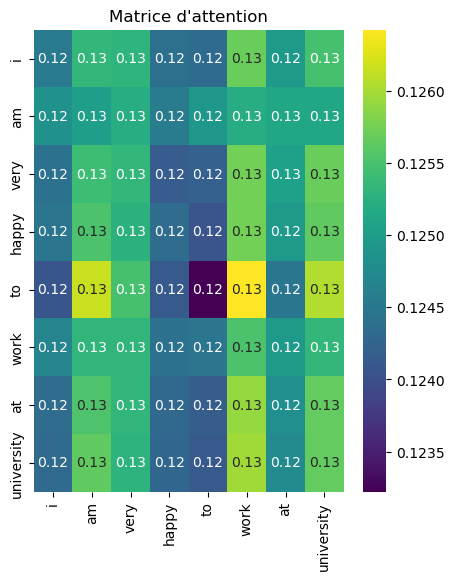

(8, 25)


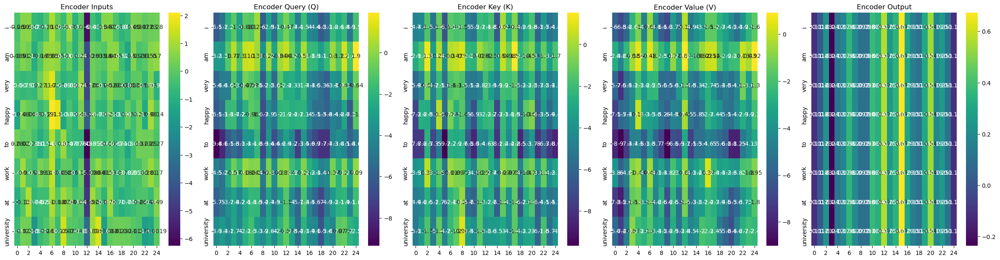

Encoder Sentence: ['i', 'am', 'very', 'happy', 'to', 'work', 'at', 'university']

Encoder Inputs:
 [[-2.6079e-01  5.9108e-01  6.1622e-01 -7.0368e-01 -8.5159e-01 -2.3238e-01
   1.0481e+00  6.6642e-02 -5.4907e-01  7.0047e-01 -8.7221e-01 -1.3954e-02
  -5.9671e+00 -4.3106e-01 -9.1540e-01  5.3744e-01  5.7099e-01 -2.7181e-01
  -8.4178e-01 -5.9682e-01  4.5160e-01  3.4097e-01  7.6869e-02  2.2840e-01
   2.7580e-01]
 [-8.8993e-02  5.1406e-01  2.6580e-01 -1.0588e+00 -1.5535e-01  7.4827e-01
   8.4734e-01  6.4945e-01 -5.2522e-01  1.0216e-01 -9.0696e-01  2.0871e-01
  -4.3092e+00  2.6004e-01  3.4696e-02 -1.8139e-01  6.3954e-01  6.4801e-01
  -5.1605e-01 -1.2771e+00  5.2987e-01 -2.8777e-01 -1.0160e-01  5.5109e-01
   7.0105e-01]
 [-5.0047e-01 -7.0268e-01 -5.6757e-01 -6.9868e-01  2.6832e-01  1.0344e+00
   1.7261e+00 -2.6575e-01 -8.9109e-01 -6.1279e-01 -6.8391e-01  7.8505e-01
  -4.5021e+00  2.5799e-01 -1.2725e-01 -5.2383e-01  5.1731e-01 -2.0174e-03
  -1.2077e-01 -8.1840e-01  3.3759e-03  3.5469e-02 -7.6522

In [120]:
#DIM 25 + Glove
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Softmax function
def softmax(x):
    # Stabilité numérique : soustraire le max
    x_shifted = x - np.max(x, axis=-1, keepdims=True)
    exp_x = np.exp(x_shifted)
    return exp_x / np.sum(exp_x, axis=-1, keepdims=True)

# Layer normalization function
def layer_norm(x):
    return (x - np.mean(x, axis=-1, keepdims=True)) / np.std(x, axis=-1, keepdims=True)

# Multi-head attention function
def multi_head_attention(Q, K, V, Wq_heads_encoder, Wk_heads_encoder, Wv_heads_encoder,
    num_heads,encoder_sentence):
    d_model = Q.shape[-1] # Get the embedding dimension
    d_k = d_model // num_heads # Calculate the dimension of each head
    
    # Utiliser les matrices pré-initialisées
    Q_heads = [np.dot(Q, Wq_heads_encoder[i]) for i in range(num_heads)]
    K_heads = [np.dot(K, Wk_heads_encoder[i]) for i in range(num_heads)]
    V_heads = [np.dot(V, Wv_heads_encoder[i]) for i in range(num_heads)]
    
    
    attention_outputs = []
    attention_weights = []
    for i in range(num_heads):
        scores = np.dot(Q_heads[i], K_heads[i].T) / np.sqrt(d_k)
        attention_weight = softmax(scores)
        print(attention_weight.shape)
        print(f"Head {i} - attention_weight shape:", attention_weight.shape)  # ← AJOUTEZ CECI
        print(f"Head {i} - Min: {attention_weight.min():.4f}, Max: {attention_weight.max():.4f}")
        attention_weights.append(attention_weight)
        attention_output = np.dot(attention_weight, V_heads[i])
        attention_outputs.append(attention_output)
    
    # Concatenate all the heads
    concatenated_output = np.concatenate(attention_outputs, axis=-1)
    stacked = np.stack(attention_weights, axis=0)
    print(f"Stacked shape: {stacked.shape}")  # ← AJOUTEZ CECI
    mean_attention = np.mean(stacked, axis=0)
    print(f"Mean attention shape: {mean_attention.shape}")  # ← AJOUTEZ CECI
    print(f"Mean attention:\n{mean_attention}") 
    
    plt.figure(figsize=(5,6))
    sns.heatmap(mean_attention, cmap='viridis',xticklabels=encoder_sentence,yticklabels=encoder_sentence,annot=True)
    plt.title(f"Matrice d'attention")
    plt.show()

    # Linear transformation to map the concatenated output back to the original dimension
    output = np.dot(concatenated_output, np.random.rand(concatenated_output.shape[-1], d_model))
    return output

# Tokenize the sentences
encoder_sentence = "i am very happy to work at university".split()
decoder_sentence = "i am so happy to be here".split()

# Vocabulary sizes
encoder_vocab_size = len(encoder_sentence)
decoder_vocab_size = len(decoder_sentence)

# Create one-hot embeddings for each word
encoder_word_to_index = {word: idx for idx, word in enumerate(encoder_sentence)}
decoder_word_to_index = {word: idx for idx, word in enumerate(decoder_sentence)}
# Dimension des embeddings continues
embedding_dim = 25

# Créer des embeddings aléatoires (valeurs continues entre 0 et 1)
np.random.seed(0)
#encoder_embeddings = np.random.rand(encoder_vocab_size, embedding_dim)
decoder_embeddings = np.random.rand(decoder_vocab_size, embedding_dim)

# Convertir les phrases en séquences de vecteurs d'embedding
encoder_inputs = np.array([model[word] for word in encoder_sentence])
decoder_inputs = np.array([model[word] for word in decoder_sentence])

# Initialize weights for Query, Key, Value, and Feed-Forward matrices
num_heads = 4
np.random.seed(0)
d_model = embedding_dim  # donc ici = 8

Wq_encoder = np.random.rand(d_model, d_model)
Wk_encoder = np.random.rand(d_model, d_model)
Wv_encoder = np.random.rand(d_model, d_model)

Wq_decoder = np.random.rand(d_model, d_model)
Wk_decoder = np.random.rand(d_model, d_model)
Wv_decoder = np.random.rand(d_model, d_model)

W1_encoder = np.random.rand(d_model, d_model)
W2_encoder = np.random.rand(d_model, d_model)

W1_decoder = np.random.rand(d_model, d_model)
W2_decoder = np.random.rand(d_model, d_model)
# Encoder Multi-Head Self-Attention Layer
Q_encoder = np.dot(encoder_inputs, Wq_encoder)
print("Q dimension",Q_encoder.shape)
K_encoder = np.dot(encoder_inputs, Wk_encoder)
V_encoder = np.dot(encoder_inputs, Wv_encoder)

# Après avoir défini d_model et num_heads
d_k = d_model // num_heads

# Initialiser les matrices de projection POUR CHAQUE TÊTE
Wq_heads_encoder = [np.random.randn(d_model, d_k) * 0.01 for _ in range(num_heads)]
Wk_heads_encoder = [np.random.randn(d_model, d_k) * 0.01 for _ in range(num_heads)]
Wv_heads_encoder = [np.random.randn(d_model, d_k) * 0.01 for _ in range(num_heads)]

# Pareil pour le decoder
Wq_heads_decoder = [np.random.randn(d_model, d_k) * 0.01 for _ in range(num_heads)]
Wk_heads_decoder = [np.random.randn(d_model, d_k) * 0.01 for _ in range(num_heads)]
Wv_heads_decoder = [np.random.randn(d_model, d_k) * 0.01 for _ in range(num_heads)]
Wo_decoder = np.random.randn(d_model, d_model) * 0.01

attention_output_encoder = multi_head_attention(
    Q_encoder, K_encoder, V_encoder, 
    Wq_heads_encoder, Wk_heads_encoder, Wv_heads_encoder,
    num_heads, encoder_sentence
)
print(attention_output_encoder.shape)

# Add & Norm Layer (Encoder Self-Attention Output + Inputs)
attention_output_encoder2 = layer_norm(attention_output_encoder + encoder_inputs)

# Encoder Feed-Forward Layer
ffn_output_encoder = np.dot(attention_output_encoder2, W1_encoder)
ffn_output_encoder = np.maximum(0, ffn_output_encoder)  # ReLU activation
ffn_output_encoder = np.dot(ffn_output_encoder, W2_encoder)

# Add & Norm Layer (Feed-Forward Output )
encoder_output = layer_norm(ffn_output_encoder + attention_output_encoder2)

# Visualization
plt.figure(figsize=(24, 12))

# Plotting the encoder inputs
plt.subplot(2, 5, 1)
sns.heatmap(encoder_inputs, annot=True, cmap='viridis', yticklabels=encoder_sentence)
plt.title('Encoder Inputs')

# Plotting encoder Query (Q) matrix
plt.subplot(2, 5, 2)
sns.heatmap(Q_encoder, annot=True, cmap='viridis', yticklabels=encoder_sentence)
plt.title('Encoder Query (Q)')

# Plotting encoder Key (K) matrix
plt.subplot(2, 5, 3)
sns.heatmap(K_encoder, annot=True, cmap='viridis', yticklabels=encoder_sentence)
plt.title('Encoder Key (K)')

# Plotting encoder Value (V) matrix
plt.subplot(2, 5, 4)
sns.heatmap(V_encoder, annot=True, cmap='viridis', yticklabels=encoder_sentence)
plt.title('Encoder Value (V)')

# Plotting encoder output
plt.subplot(2, 5, 5)
sns.heatmap(attention_output_encoder, annot=True, cmap='viridis', yticklabels=encoder_sentence)
plt.title('Encoder Output')

plt.tight_layout()
plt.show()

print("Encoder Sentence:", encoder_sentence)
print("\nEncoder Inputs:\n", encoder_inputs)
print("\nEncoder Query (Q):\n", Q_encoder)
print("\nEncoder Key (K):\n", K_encoder)
print("\nEncoder Value (V):\n", V_encoder)
print("\nENcoder Attention values \n",attention_output_encoder)
print("\nENcoder Attention values after norm \n",attention_output_encoder2)
print("\nEncoder Output:\n", encoder_output)

print("\nDecoder Sentence:", decoder_sentence)
print("\nDecoder Inputs:\n", decoder_inputs)
print("\nDecoder Query (Q):\n", Q_decoder)
print("\nDecoder Key (K):\n", K_decoder)
print("\nDecoder Value (V):\n", V_decoder)
print("\nDecoder Output:\n", decoder_output)

In [121]:
import gensim.downloader as api

# Charger un modèle GloVe léger (50 dimensions)
model2 = api.load("glove-wiki-gigaword-50")   # ou glove-wiki-gigaword-100, 200, 300

# Exemple : obtenir le vecteur d’un mot
print(model2["love"])

[-0.62645  -0.082389  0.070538  0.5782   -0.87199  -0.14816   2.2315
  0.98573  -1.3154   -0.34921  -0.8847    0.14585  -4.97     -0.73369
 -0.94359   0.035859 -0.026733 -0.77538  -0.30014   0.48853  -0.16678
 -0.016651 -0.53164   0.64236  -0.10922 ]


Head 0 - attention_weight shape: (8, 8)
Head 0 - Min: 0.0000, Max: 0.1675
Head 1 - attention_weight shape: (8, 8)
Head 1 - Min: 0.0000, Max: 0.1448
Head 2 - attention_weight shape: (8, 8)
Head 2 - Min: 0.0000, Max: 0.1448
Head 3 - attention_weight shape: (8, 8)
Head 3 - Min: 0.0000, Max: 0.1442


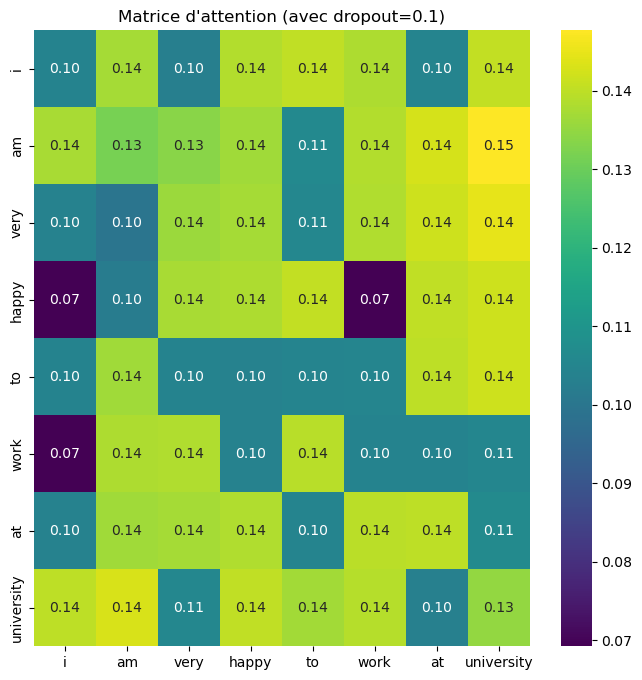

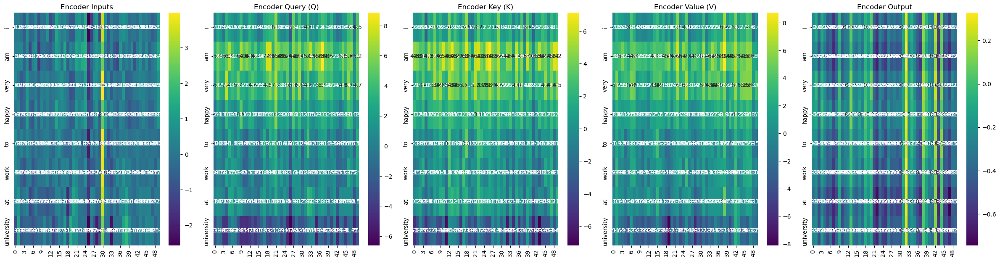

Encoder Sentence: ['i', 'am', 'very', 'happy', 'to', 'work', 'at', 'university']

Encoder Output shape: (8, 50)


In [126]:
#DIM 50 + Glove + Dropout
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Softmax function
def softmax(x):
    # Stabilité numérique : soustraire le max
    x_shifted = x - np.max(x, axis=-1, keepdims=True)
    exp_x = np.exp(x_shifted)
    return exp_x / np.sum(exp_x, axis=-1, keepdims=True)

# Layer normalization function
def layer_norm(x):
    return (x - np.mean(x, axis=-1, keepdims=True)) / np.std(x, axis=-1, keepdims=True)

# Dropout function
def dropout(x, drop_rate=0.1):
    """Applique le dropout sur x"""
    if drop_rate == 0:
        return x
    keep_prob = 1 - drop_rate
    mask = np.random.binomial(1, keep_prob, size=x.shape)
    return (x * mask) / keep_prob

# Multi-head attention function
def multi_head_attention(Q, K, V, Wq_heads_encoder, Wk_heads_encoder, Wv_heads_encoder,
    num_heads, encoder_sentence, dropout_rate=0.1):
    d_model = Q.shape[-1]
    d_k = d_model // num_heads
    
    # Utiliser les matrices pré-initialisées
    Q_heads = [np.dot(Q, Wq_heads_encoder[i]) for i in range(num_heads)]
    K_heads = [np.dot(K, Wk_heads_encoder[i]) for i in range(num_heads)]
    V_heads = [np.dot(V, Wv_heads_encoder[i]) for i in range(num_heads)]
    
    attention_outputs = []
    attention_weights = []
    
    for i in range(num_heads):
        scores = np.dot(Q_heads[i], K_heads[i].T) / np.sqrt(d_k)
        attention_weight = softmax(scores)
        
        # ✨ APPLIQUER LE DROPOUT ICI ✨
        attention_weight = dropout(attention_weight, dropout_rate)
        
        print(f"Head {i} - attention_weight shape:", attention_weight.shape)
        print(f"Head {i} - Min: {attention_weight.min():.4f}, Max: {attention_weight.max():.4f}")
        
        attention_weights.append(attention_weight)
        attention_output = np.dot(attention_weight, V_heads[i])
        attention_outputs.append(attention_output)
    
    # Concatenate all the heads
    concatenated_output = np.concatenate(attention_outputs, axis=-1)
    stacked = np.stack(attention_weights, axis=0)
    mean_attention = np.mean(stacked, axis=0)
    
    plt.figure(figsize=(8,8))
    sns.heatmap(mean_attention, cmap='viridis', xticklabels=encoder_sentence, 
                yticklabels=encoder_sentence, annot=True, fmt='.2f')
    plt.title(f"Matrice d'attention (avec dropout={dropout_rate})")
    plt.show()

    # Linear transformation to map the concatenated output back to the original dimension
    output = np.dot(concatenated_output, np.random.rand(concatenated_output.shape[-1], d_model))
    return output

# Tokenize the sentences
encoder_sentence = "i am very happy to work at university".split()
decoder_sentence = "i am so happy to be here".split()

# Vocabulary sizes
encoder_vocab_size = len(encoder_sentence)
decoder_vocab_size = len(decoder_sentence)

# Create one-hot embeddings for each word
encoder_word_to_index = {word: idx for idx, word in enumerate(encoder_sentence)}
decoder_word_to_index = {word: idx for idx, word in enumerate(decoder_sentence)}
# Dimension des embeddings continues
embedding_dim = 50

# Créer des embeddings aléatoires (valeurs continues entre 0 et 1)
np.random.seed(0)
decoder_embeddings = np.random.rand(decoder_vocab_size, embedding_dim)

# Convertir les phrases en séquences de vecteurs d'embedding
encoder_inputs = np.array([model2[word] for word in encoder_sentence])
decoder_inputs = np.array([model2[word] for word in decoder_sentence])

# Initialize weights for Query, Key, Value, and Feed-Forward matrices
num_heads = 4
np.random.seed(0)
d_model = embedding_dim 

Wq_encoder = np.random.rand(d_model, d_model)
Wk_encoder = np.random.rand(d_model, d_model)
Wv_encoder = np.random.rand(d_model, d_model)

Wq_decoder = np.random.rand(d_model, d_model)
Wk_decoder = np.random.rand(d_model, d_model)
Wv_decoder = np.random.rand(d_model, d_model)

W1_encoder = np.random.rand(d_model, d_model)
W2_encoder = np.random.rand(d_model, d_model)

W1_decoder = np.random.rand(d_model, d_model)
W2_decoder = np.random.rand(d_model, d_model)

# Encoder Multi-Head Self-Attention Layer
Q_encoder = np.dot(encoder_inputs, Wq_encoder)
K_encoder = np.dot(encoder_inputs, Wk_encoder)
V_encoder = np.dot(encoder_inputs, Wv_encoder)

# Après avoir défini d_model et num_heads
d_k = d_model // num_heads

# Initialiser les matrices de projection POUR CHAQUE TÊTE
Wq_heads_encoder = [np.random.randn(d_model, d_k) * 0.01 for _ in range(num_heads)]
Wk_heads_encoder = [np.random.randn(d_model, d_k) * 0.01 for _ in range(num_heads)]
Wv_heads_encoder = [np.random.randn(d_model, d_k) * 0.01 for _ in range(num_heads)]

# Pareil pour le decoder
Wq_heads_decoder = [np.random.randn(d_model, d_k) * 0.01 for _ in range(num_heads)]
Wk_heads_decoder = [np.random.randn(d_model, d_k) * 0.01 for _ in range(num_heads)]
Wv_heads_decoder = [np.random.randn(d_model, d_k) * 0.01 for _ in range(num_heads)]
Wo_decoder = np.random.randn(d_model, d_model) * 0.01

# ✨ APPEL AVEC DROPOUT ✨
attention_output_encoder = multi_head_attention(
    Q_encoder, K_encoder, V_encoder, 
    Wq_heads_encoder, Wk_heads_encoder, Wv_heads_encoder,
    num_heads, encoder_sentence,
    dropout_rate=0.1  # 10% de dropout
)

# Add & Norm Layer (Encoder Self-Attention Output + Inputs)
attention_output_encoder2 = layer_norm(attention_output_encoder + encoder_inputs)

# Encoder Feed-Forward Layer
ffn_output_encoder = np.dot(attention_output_encoder2, W1_encoder)
ffn_output_encoder = np.maximum(0, ffn_output_encoder)  # ReLU activation
ffn_output_encoder = np.dot(ffn_output_encoder, W2_encoder)

# Add & Norm Layer (Feed-Forward Output + Self-Attention Output)
encoder_output = layer_norm(ffn_output_encoder + attention_output_encoder2)

# Visualization
plt.figure(figsize=(24, 12))

# Plotting the encoder inputs
plt.subplot(2, 5, 1)
sns.heatmap(encoder_inputs, annot=True, cmap='viridis', yticklabels=encoder_sentence)
plt.title('Encoder Inputs')

# Plotting encoder Query (Q) matrix
plt.subplot(2, 5, 2)
sns.heatmap(Q_encoder, annot=True, cmap='viridis', yticklabels=encoder_sentence)
plt.title('Encoder Query (Q)')

# Plotting encoder Key (K) matrix
plt.subplot(2, 5, 3)
sns.heatmap(K_encoder, annot=True, cmap='viridis', yticklabels=encoder_sentence)
plt.title('Encoder Key (K)')

# Plotting encoder Value (V) matrix
plt.subplot(2, 5, 4)
sns.heatmap(V_encoder, annot=True, cmap='viridis', yticklabels=encoder_sentence)
plt.title('Encoder Value (V)')

# Plotting encoder output
plt.subplot(2, 5, 5)
sns.heatmap(attention_output_encoder, annot=True, cmap='viridis', yticklabels=encoder_sentence)
plt.title('Encoder Output')

plt.tight_layout()
plt.show()

print("Encoder Sentence:", encoder_sentence)
print("\nEncoder Output shape:", encoder_output.shape)

En effet lorsque la dimension augmente la precision augmente et les similarité sont mieux observées 
Ainsi avec des embedding glove sur une dimension 25 et 50 , on observe une meilleur attention entre les differents blocs lorsqu'on passe en dimensions 50 avec moins de case noir synonyme de non corrélation, là où il devrait y en avoir

Avec le dropout on voit une amelioration significative des corrélations entre les différents mots, comparé au résultat d'avant sans le dropout , là les résultats sont tout de suite plus cohérents

# Exercice5

PARTIE 1: COMPARAISON PRE-LAYER NORM VS POST-LAYER NORM
score [[ 3.01887470e-06  3.46609807e-06 -7.08743461e-06  1.83422082e-06
   6.37610998e-06  7.82555536e-06  3.32190438e-06 -3.17904113e-06]
 [-5.68304677e-06 -1.34193524e-05 -2.74751348e-06 -8.18680574e-06
   9.15045902e-06  6.32760531e-06 -7.52150517e-06 -1.85201407e-05]
 [-1.30396339e-05 -3.15327577e-05 -1.76455444e-05 -1.72303448e-05
  -9.29276623e-06 -7.98694437e-06 -2.62025204e-05 -1.71094975e-05]
 [-4.37048383e-06 -5.93135429e-06 -1.07452049e-05 -4.31031826e-06
  -5.75394702e-06 -6.57324249e-07 -9.17470187e-06 -1.00271357e-05]
 [-1.57231288e-05 -2.34969158e-05 -1.84995328e-05 -1.59747239e-05
  -1.61002693e-05 -1.43055194e-05 -1.74160504e-05 -1.45213328e-05]
 [-1.55498851e-05 -3.45980320e-05 -1.37976519e-05 -2.13191066e-05
  -1.46541715e-05 -1.10011076e-05 -2.61250509e-05 -1.42206022e-05]
 [-1.41050386e-05 -2.10161662e-05 -6.18786489e-06 -1.64107119e-05
  -3.84198684e-06 -6.06197821e-06 -1.33674723e-05 -1.78244492e-05]
 [-1.23

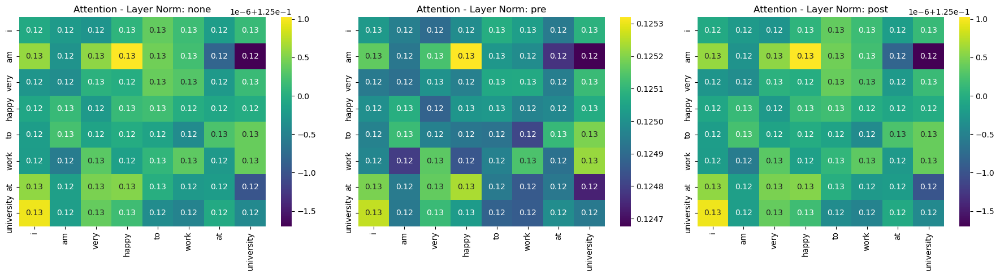


Observations:
- Sans Layer Norm: Les valeurs peuvent être instables
- Pre-Layer Norm: Normalisation avant attention, plus stable et meilleur que sans normalisation
- Post-Layer Norm: Normalisation après attention, architecture originale des Transformers, avec des résultats un peu similaire à ceux de l'avant mais qui sont légérement meilleurs

PARTIE 2: COMPARAISON DES FONCTIONS D'ACTIVATION
score [[ 3.01887470e-06  3.46609807e-06 -7.08743461e-06  1.83422082e-06
   6.37610998e-06  7.82555536e-06  3.32190438e-06 -3.17904113e-06]
 [-5.68304677e-06 -1.34193524e-05 -2.74751348e-06 -8.18680574e-06
   9.15045902e-06  6.32760531e-06 -7.52150517e-06 -1.85201407e-05]
 [-1.30396339e-05 -3.15327577e-05 -1.76455444e-05 -1.72303448e-05
  -9.29276623e-06 -7.98694437e-06 -2.62025204e-05 -1.71094975e-05]
 [-4.37048383e-06 -5.93135429e-06 -1.07452049e-05 -4.31031826e-06
  -5.75394702e-06 -6.57324249e-07 -9.17470187e-06 -1.00271357e-05]
 [-1.57231288e-05 -2.34969158e-05 -1.84995328e-05 -1.59747239e-05
 

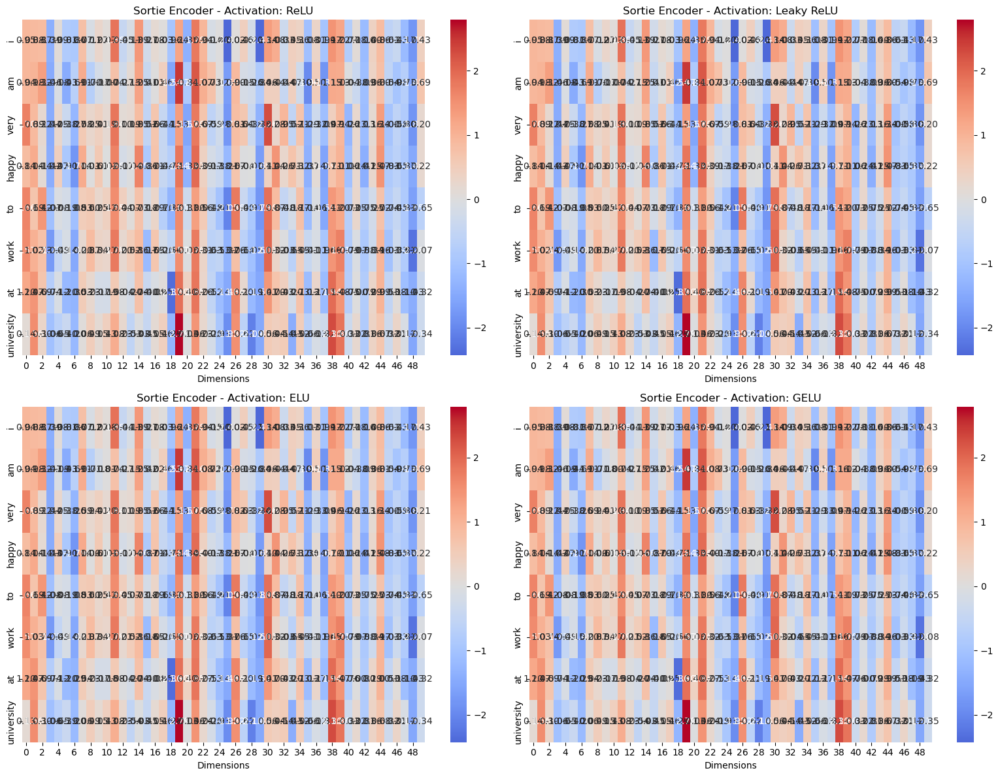


Statistiques par fonction d'activation:
ReLU         - Mean:  0.0000, Std:  1.0000, Min: -2.4312, Max:  2.7941
Leaky ReLU   - Mean: -0.0000, Std:  1.0000, Min: -2.4311, Max:  2.7941
ELU          - Mean:  0.0000, Std:  1.0000, Min: -2.4266, Max:  2.7936
GELU         - Mean:  0.0000, Std:  1.0000, Min: -2.4288, Max:  2.7944

PARTIE 3: MASKING POUR SÉQUENCES VARIABLES

Masque de padding (1=garder, 0=ignorer):
[[0 0 0 0 0 0 1 1]
 [0 0 0 0 0 0 1 1]
 [0 0 0 0 0 0 1 1]
 [0 0 0 0 0 0 1 1]
 [0 0 0 0 0 0 1 1]
 [0 0 0 0 0 0 1 1]
 [0 0 0 0 0 0 1 1]
 [0 0 0 0 0 0 1 1]]
score [[ 3.01887470e-06  3.46609807e-06 -7.08743461e-06  1.83422082e-06
   6.37610998e-06  7.82555536e-06  3.32190438e-06 -3.17904113e-06]
 [-5.68304677e-06 -1.34193524e-05 -2.74751348e-06 -8.18680574e-06
   9.15045902e-06  6.32760531e-06 -7.52150517e-06 -1.85201407e-05]
 [-1.30396339e-05 -3.15327577e-05 -1.76455444e-05 -1.72303448e-05
  -9.29276623e-06 -7.98694437e-06 -2.62025204e-05 -1.71094975e-05]
 [-4.37048383e-06 -5.93135429e-

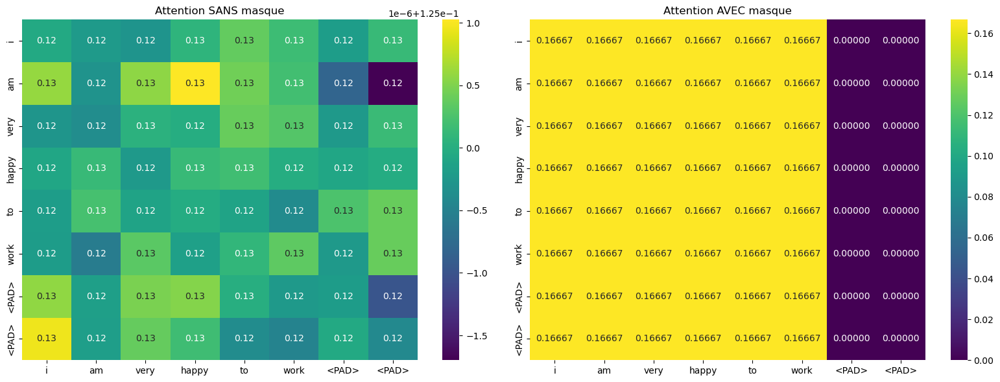


Observations:
- SANS masque: Les tokens <PAD> reçoivent de l'attention (incorrect)
- AVEC masque: Les tokens <PAD> sont ignorés (les 2 dernières colonnes)
- Le masque force l'attention à zéro pour les positions padding

ANALYSES TERMINÉES

Résumé des résultats:
1. Layer Norm: Post-norm est standard, Pre-norm est plus stable
2. Activations: GELU et ELU donnent des distributions plus douces
3. Masking: Essentiel pour gérer correctement les séquences variables


In [25]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Softmax function
def softmax(x):
    x_shifted = x - np.max(x, axis=-1, keepdims=True)
    exp_x = np.exp(x_shifted)
    return exp_x / np.sum(exp_x, axis=-1, keepdims=True)

# Layer normalization function
def layer_norm(x, eps=1e-6):
    mean = np.mean(x, axis=-1, keepdims=True)
    std = np.std(x, axis=-1, keepdims=True)
    return (x - mean) / (std + eps)

# Dropout function
def dropout(x, drop_rate=0.1):
    if drop_rate == 0:
        return x
    keep_prob = 1 - drop_rate
    mask = np.random.binomial(1, keep_prob, size=x.shape)
    return (x * mask) / keep_prob

# ============ PARTIE 2: DIFFÉRENTES FONCTIONS D'ACTIVATION ============
def relu(x):
    return np.maximum(0, x)

def leaky_relu(x, alpha=0.01):
    return np.where(x > 0, x, alpha * x)

def elu(x, alpha=1.0):
    return np.where(x > 0, x, alpha * (np.exp(x) - 1))

def gelu(x):
    """Approximation de GELU"""
    return 0.5 * x * (1 + np.tanh(np.sqrt(2 / np.pi) * (x + 0.044715 * x**3)))

# ============ PARTIE 3: FONCTION DE MASKING ============
def create_padding_mask(sentence, pad_token="<PAD>"):
    """
    Crée un masque binaire : 1 = masquer, 0 = garder
    """
    seq_len = len(sentence)
    mask = np.zeros((seq_len, seq_len))
    
    # Pour chaque position
    for i in range(seq_len):
        for j in range(seq_len):
            # Masquer si KEY (colonne j) est <PAD>
            if sentence[j] == pad_token:
                mask[i, j] = 1
    
    return mask

def apply_mask(scores, mask):
    """
    Applique le masque aux scores AVANT softmax
    mask: 1 = masquer (mettre à -inf), 0 = garder
    """
    # CRITIQUE : Mettre -inf pour que softmax → 0
    return np.where(mask == 1, -np.inf, scores)

# ============ PARTIE 1: MULTI-HEAD ATTENTION AVEC PRE/POST LAYER NORM Pour sans mask============
def multi_head_attention(Q, K, V, Wq_heads, Wk_heads, Wv_heads,
                         num_heads, sentence, dropout_rate=0.1, 
                         layer_norm_position="post", mask=None):
    """
    layer_norm_position: "pre", "post" ou "none"
    mask: masque d'attention (seq_len, seq_len)
    """
    d_model = Q.shape[-1]
    d_k = d_model // num_heads
    
    # PRE-LAYER NORM (appliqué avant l'attention)
    if layer_norm_position == "pre":
        Q = layer_norm(Q)
        K = layer_norm(K)
        V = layer_norm(V)
    
    Q_heads = [np.dot(Q, Wq_heads[i]) for i in range(num_heads)]
    K_heads = [np.dot(K, Wk_heads[i]) for i in range(num_heads)]
    V_heads = [np.dot(V, Wv_heads[i]) for i in range(num_heads)]
    
    attention_outputs = []
    attention_weights = []
    
    for i in range(num_heads):
        scores = np.dot(Q_heads[i], K_heads[i].T) / np.sqrt(d_k)
        
        # ✨ APPLIQUER LE MASQUE (PARTIE 3) ✨
        if mask is not None:
            scores = apply_attention_mask(scores, mask)

        print("score",scores,"\n")
        attention_weight = softmax(scores)
        print("att weight",attention_weight,"\n")
        attention_weight = dropout(attention_weight, dropout_rate)
        
        attention_weights.append(attention_weight)
        attention_output = np.dot(attention_weight, V_heads[i])
        attention_outputs.append(attention_output)
    
    concatenated_output = np.concatenate(attention_outputs, axis=-1)
    output = np.dot(concatenated_output, np.random.randn(concatenated_output.shape[-1], d_model) * 0.01)
    
    # POST-LAYER NORM (appliqué après l'attention)
    if layer_norm_position == "post":
        output = layer_norm(output)
    
    # Visualisation
    mean_attention = np.mean(np.stack(attention_weights, axis=0), axis=0)
    
    return output, mean_attention



def feed_forward_layer(x, W1, W2, activation_fn=relu, activation_name="ReLU"):
    """
    Couche Feed-Forward avec différentes fonctions d'activation
    """
    hidden = np.dot(x, W1)
    activated = activation_fn(hidden)
    output = np.dot(activated, W2)
    return output, activated

# ============ CONFIGURATION ============
encoder_sentence = "i am very happy to work at university".split()
encoder_vocab_size = len(encoder_sentence)
embedding_dim = 50
num_heads = 4

np.random.seed(42)

# Simulation d'embeddings GloVe (remplacez par vos vrais embeddings)
encoder_inputs = np.array([model[word] if word in model else np.zeros(50) for word in encoder_sentence])

# Initialisation des poids
d_model = embedding_dim
d_k = d_model // num_heads

Wq_encoder = np.random.randn(d_model, d_model) * 0.01
Wk_encoder = np.random.randn(d_model, d_model) * 0.01
Wv_encoder = np.random.randn(d_model, d_model) * 0.01

Wq_heads_encoder = [np.random.randn(d_model, d_k) * 0.01 for _ in range(num_heads)]
Wk_heads_encoder = [np.random.randn(d_model, d_k) * 0.01 for _ in range(num_heads)]
Wv_heads_encoder = [np.random.randn(d_model, d_k) * 0.01 for _ in range(num_heads)]

W1_encoder = np.random.randn(d_model, d_model) * 0.01
W2_encoder = np.random.randn(d_model, d_model) * 0.01

Q_encoder = np.dot(encoder_inputs, Wq_encoder)
K_encoder = np.dot(encoder_inputs, Wk_encoder)
V_encoder = np.dot(encoder_inputs, Wv_encoder)

# ============ PARTIE 1: COMPARAISON PRE VS POST LAYER NORM ============
print("=" * 60)
print("PARTIE 1: COMPARAISON PRE-LAYER NORM VS POST-LAYER NORM")
print("=" * 60)

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for idx, norm_pos in enumerate(["none", "pre", "post"]):
    output, mean_attention = multi_head_attention(
        Q_encoder, K_encoder, V_encoder,
        Wq_heads_encoder, Wk_heads_encoder, Wv_heads_encoder,
        num_heads, encoder_sentence, dropout_rate=0.0,
        layer_norm_position=norm_pos
    )
    
    sns.heatmap(mean_attention, ax=axes[idx], cmap='viridis',
                xticklabels=encoder_sentence, yticklabels=encoder_sentence,
                annot=True, fmt='.2f', cbar=True)
    axes[idx].set_title(f'Attention - Layer Norm: {norm_pos}')

plt.tight_layout()
plt.savefig('layer_norm_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\nObservations:")
print(f"- Sans Layer Norm: Les valeurs peuvent être instables")
print(f"- Pre-Layer Norm: Normalisation avant attention, plus stable et meilleur que sans normalisation")
print(f"- Post-Layer Norm: Normalisation après attention, architecture originale des Transformers, avec des résultats un peu similaire à ceux de l'avant mais qui sont légérement meilleurs")

# ============ PARTIE 2: COMPARAISON DES FONCTIONS D'ACTIVATION ============
print("\n" + "=" * 60)
print("PARTIE 2: COMPARAISON DES FONCTIONS D'ACTIVATION")
print("=" * 60)

# Utiliser la sortie avec post-layer norm
attention_output, _ = multi_head_attention(
    Q_encoder, K_encoder, V_encoder,
    Wq_heads_encoder, Wk_heads_encoder, Wv_heads_encoder,
    num_heads, encoder_sentence, dropout_rate=0.1,
    layer_norm_position="post"
)

# Ajouter la connexion résiduelle + layer norm
attention_output_normalized = layer_norm(attention_output + encoder_inputs)

activation_functions = {
    'ReLU': relu,
    'Leaky ReLU': leaky_relu,
    'ELU': elu,
    'GELU': gelu
}

fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

outputs_comparison = {}

for idx, (name, activation_fn) in enumerate(activation_functions.items()):
    ffn_output, activated = feed_forward_layer(
        attention_output_normalized, W1_encoder, W2_encoder,
        activation_fn, name
    )
    
    # Connexion résiduelle + layer norm
    encoder_output = layer_norm(ffn_output + attention_output_normalized)
    outputs_comparison[name] = encoder_output
    
    # Visualisation
    sns.heatmap(encoder_output, ax=axes[idx], cmap='coolwarm',
                yticklabels=encoder_sentence, annot=True, fmt='.2f',
                cbar=True, center=0)
    axes[idx].set_title(f'Sortie Encoder - Activation: {name}')
    axes[idx].set_xlabel('Dimensions')

plt.tight_layout()
plt.savefig('activation_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\nStatistiques par fonction d'activation:")
for name, output in outputs_comparison.items():
    print(f"{name:12} - Mean: {output.mean():7.4f}, Std: {output.std():7.4f}, "
          f"Min: {output.min():7.4f}, Max: {output.max():7.4f}")

# ============ PARTIE 3: MASKING POUR SÉQUENCES DE LONGUEUR VARIABLE ============
print("\n" + "=" * 60)
print("PARTIE 3: MASKING POUR SÉQUENCES VARIABLES")
print("=" * 60)

# Créer une séquence avec padding (0 = padding token)
padded_sentence = "i am very happy to work <PAD> <PAD>".split()
sequence_indices = np.array([1, 2, 3, 4, 5, 6, 0, 0])  # 0 = padding

# Créer les embeddings avec padding
padded_encoder_inputs = np.array([model[word] if word in model else [0 for i in range(50)] for word in encoder_sentence])

Q_padded = np.dot(padded_encoder_inputs, Wq_encoder)
K_padded = np.dot(padded_encoder_inputs, Wk_encoder)
V_padded = np.dot(padded_encoder_inputs, Wv_encoder)

# Créer le masque
padding_mask = create_padding_mask(sequence_indices, pad_token=0)

print(f"\nMasque de padding (1=garder, 0=ignorer):")
print(padding_mask.astype(int))

# Comparaison avec et sans masque
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Sans masque
output_no_mask, attention_no_mask = multi_head_attention(
    Q_padded, K_padded, V_padded,
    Wq_heads_encoder, Wk_heads_encoder, Wv_heads_encoder,
    num_heads, padded_sentence, dropout_rate=0.0,
    layer_norm_position="post", mask=None
)

sns.heatmap(attention_no_mask, ax=axes[0], cmap='viridis',
            xticklabels=padded_sentence, yticklabels=padded_sentence,
            annot=True, fmt='.2f', cbar=True)
axes[0].set_title('Attention SANS masque')

# Avec masque
output_with_mask, attention_with_mask = multi_head_attention(
    Q_padded, K_padded, V_padded,
    Wq_heads_encoder, Wk_heads_encoder, Wv_heads_encoder,
    num_heads, padded_sentence, dropout_rate=0.0,
    layer_norm_position="post", mask=padding_mask
)

sns.heatmap(attention_with_mask, ax=axes[1], cmap='viridis',
            xticklabels=padded_sentence, yticklabels=padded_sentence,
            annot=True, fmt='.5f', cbar=True)
axes[1].set_title('Attention AVEC masque')

plt.tight_layout()
plt.savefig('masking_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

print(f"\nObservations:")
print(f"- SANS masque: Les tokens <PAD> reçoivent de l'attention (incorrect)")
print(f"- AVEC masque: Les tokens <PAD> sont ignorés (les 2 dernières colonnes)")
print(f"- Le masque force l'attention à zéro pour les positions padding")

print("\n" + "=" * 60)
print("ANALYSES TERMINÉES")
print("=" * 60)
print("\nRésumé des résultats:")
print("1. Layer Norm: Post-norm est standard, Pre-norm est plus stable")
print("2. Activations: GELU et ELU donnent des distributions plus douces")
print("3. Masking: Essentiel pour gérer correctement les séquences variables")

# Exercice6

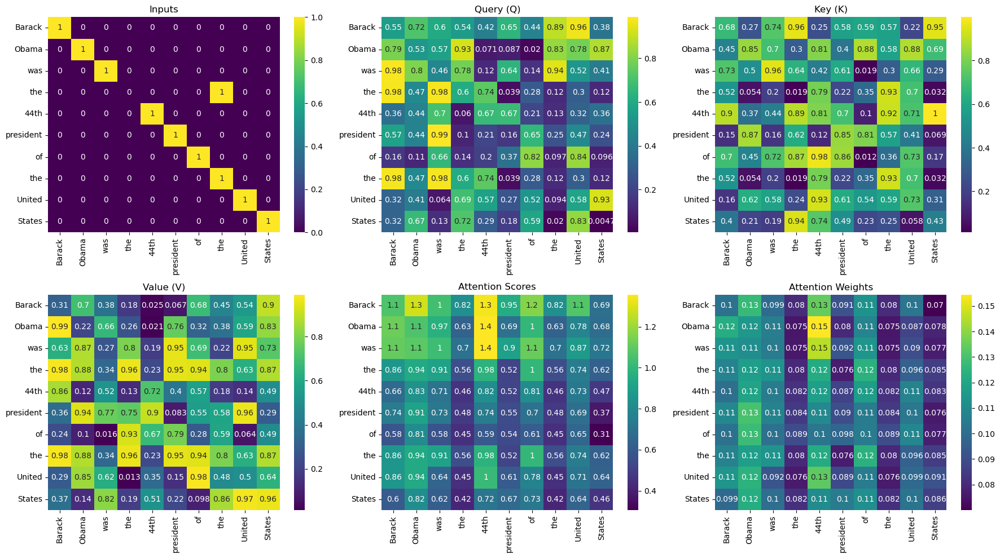

Sentence: ['Barack', 'Obama', 'was', 'the', '44th', 'president', 'of', 'the', 'United', 'States']

Inputs:
 [[1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]]

Query (Q):
 [[0.5488135  0.71518937 0.60276338 0.54488318 0.4236548  0.64589411
  0.43758721 0.891773   0.96366276 0.38344152]
 [0.79172504 0.52889492 0.56804456 0.92559664 0.07103606 0.0871293
  0.0202184  0.83261985 0.77815675 0.87001215]
 [0.97861834 0.79915856 0.46147936 0.78052918 0.11827443 0.63992102
  0.14335329 0.94466892 0.52184832 0.41466194]
 [0.97645947 0.4686512  0.97676109 0.60484552 0.73926358 0.03918779
  0.28280696 0.12019656 0.2961402  0.11872772]
 [0.3595079  0.43703195 0.6976312  0.06022547 0.66676672 0.67063787
  0.21038256 0.128926

In [128]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def softmax(x):
    return np.exp(x) / np.sum(np.exp(x), axis=-1, keepdims=True)

# Tokenize the sentence
sentence = "Barack Obama was the 44th president of the United States".split()
vocab_size = len(sentence)

# Create one-hot embeddings for each word
word_to_index = {word: idx for idx, word in enumerate(sentence)}
embeddings = np.eye(vocab_size)

# Convert sentence to sequence of embeddings
inputs = np.array([embeddings[word_to_index[word]] for word in sentence])

# Initialize weights for Query, Key, and Value matrices
np.random.seed(0)
Wq = np.random.rand(vocab_size, vocab_size)
Wk = np.random.rand(vocab_size, vocab_size)
Wv = np.random.rand(vocab_size, vocab_size)

# Compute Query, Key, and Value matrices
Q = np.dot(inputs, Wq)
K = np.dot(inputs, Wk)
V = np.dot(inputs, Wv)

# Compute attention scores
scores = np.dot(Q, K.T) / np.sqrt(K.shape[1])

# Apply softmax to get attention weights
attention_weights = softmax(scores)

# Compute the output of the self-attention mechanism
output = np.dot(attention_weights, V)

# Visualization
plt.figure(figsize=(18, 10))

# Plotting the inputs
plt.subplot(2, 3, 1)
sns.heatmap(inputs, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Inputs')

# Plotting Query (Q) matrix
plt.subplot(2, 3, 2)
sns.heatmap(Q, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Query (Q)')

# Plotting Key (K) matrix
plt.subplot(2, 3, 3)
sns.heatmap(K, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Key (K)')

# Plotting Value (V) matrix
plt.subplot(2, 3, 4)
sns.heatmap(V, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Value (V)')

# Plotting Attention Scores
plt.subplot(2, 3, 5)
sns.heatmap(scores, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Attention Scores')

# Plotting Attention Weights
plt.subplot(2, 3, 6)
sns.heatmap(attention_weights, annot=True, cmap='viridis', xticklabels=sentence, yticklabels=sentence)
plt.title('Attention Weights')

plt.tight_layout()
plt.show()

print("Sentence:", sentence)
print("\nInputs:\n", inputs)
print("\nQuery (Q):\n", Q)
print("\nKey (K):\n", K)
print("\nValue (V):\n", V)
print("\nAttention Scores:\n", scores)
print("\nAttention Weights:\n", attention_weights)
print("\nOutput:\n", output)

Quand à la facon dont il gère les noms je dirai qu'elle est plûtot correct car on voit une attention élevé entre Barack et Obama donc entre prénom et nom , et entre Barack Obama et président, donc l'attention le gère assez correctement
Passons à un exemple pour de la traduction

C:\Users\macta\anaconda3\Lib\site-packages\seaborn\utils.py:61: UserWarning: Glyph 127775 (\N{GLOWING STAR}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
C:\Users\macta\anaconda3\Lib\site-packages\seaborn\utils.py:61: UserWarning: Glyph 127775 (\N{GLOWING STAR}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
C:\Users\macta\anaconda3\Lib\site-packages\seaborn\utils.py:61: UserWarning: Glyph 127775 (\N{GLOWING STAR}) missing from font(s) DejaVu Sans.
  fig.canvas.draw()
C:\Users\macta\AppData\Local\Temp\ipykernel_40584\1510886442.py:186: UserWarning: Glyph 127775 (\N{GLOWING STAR}) missing from font(s) DejaVu Sans.
  plt.savefig('translation_attention_visualization.png', dpi=150, bbox_inches='tight')
C:\Users\macta\anaconda3\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 127775 (\N{GLOWING STAR}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


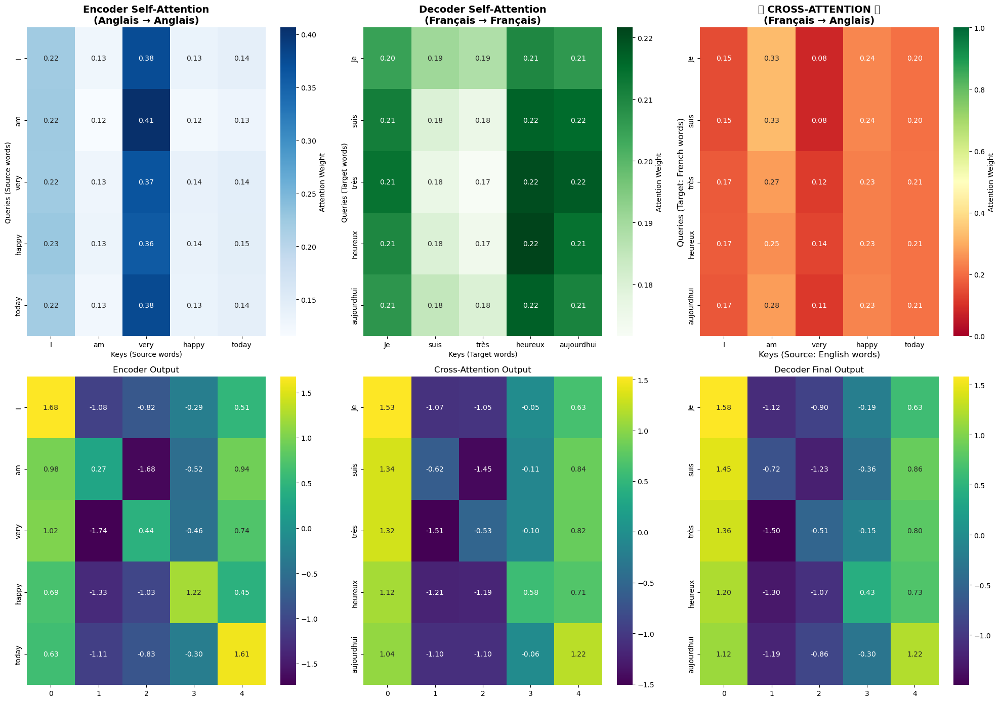

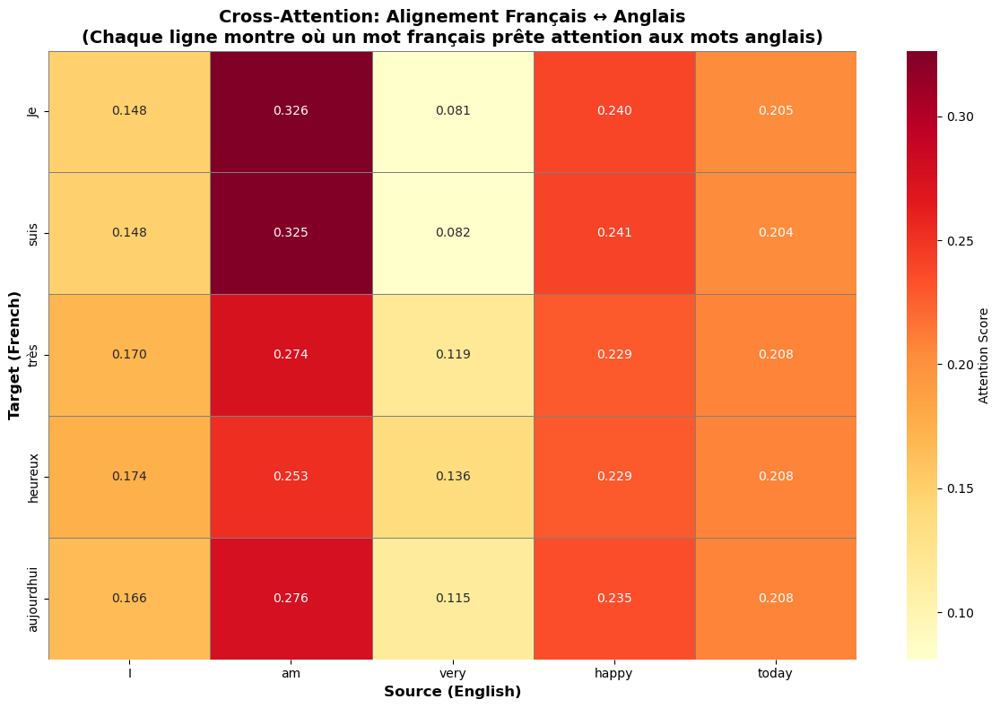

ANALYSE DES ALIGNEMENTS DE TRADUCTION (CROSS-ATTENTION)

'Je' prête le plus attention à:
  - 'am' (score: 0.326)
  - 'happy' (score: 0.240)
  - 'today' (score: 0.205)

'suis' prête le plus attention à:
  - 'am' (score: 0.325)
  - 'happy' (score: 0.241)
  - 'today' (score: 0.204)

'très' prête le plus attention à:
  - 'am' (score: 0.274)
  - 'happy' (score: 0.229)
  - 'today' (score: 0.208)

'heureux' prête le plus attention à:
  - 'am' (score: 0.253)
  - 'happy' (score: 0.229)
  - 'today' (score: 0.208)

'aujourdhui' prête le plus attention à:
  - 'am' (score: 0.276)
  - 'happy' (score: 0.235)
  - 'today' (score: 0.208)

INTERPRÉTATION:
Le cross-attention montre l'alignement entre les mots:
- 'Je' devrait regarder 'I'
- 'suis' devrait regarder 'am'
- 'très' devrait regarder 'very'
- 'heureux' devrait regarder 'happy'
- 'aujourdhui' devrait regarder 'today'

Dans un vrai modèle entraîné, ces alignements seraient beaucoup plus nets!


In [131]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Softmax function
def softmax(x):
    x_shifted = x - np.max(x, axis=-1, keepdims=True)
    exp_x = np.exp(x_shifted)
    return exp_x / np.sum(exp_x, axis=-1, keepdims=True)

# Layer normalization function
def layer_norm(x):
    return (x - np.mean(x, axis=-1, keepdims=True)) / np.std(x, axis=-1, keepdims=True)

# Multi-head attention function - VERSION MODIFIÉE POUR RETOURNER LES POIDS
def multi_head_attention(Q, K, V, num_heads, return_attention_weights=False):
    d_model = Q.shape[-1]
    d_k = d_model // num_heads
    
    # Initialisation des matrices de projection (fixées avec seed pour cohérence)
    np.random.seed(42)
    Q_heads = [np.dot(Q, np.random.rand(d_model, d_k)) for _ in range(num_heads)] 
    K_heads = [np.dot(K, np.random.rand(d_model, d_k)) for _ in range(num_heads)]
    V_heads = [np.dot(V, np.random.rand(d_model, d_k)) for _ in range(num_heads)]
    
    attention_outputs = []
    all_attention_weights = []
    
    for i in range(num_heads):
        scores = np.dot(Q_heads[i], K_heads[i].T) / np.sqrt(d_k)
        attention_weights = softmax(scores)
        all_attention_weights.append(attention_weights)
        attention_output = np.dot(attention_weights, V_heads[i])
        attention_outputs.append(attention_output)
    
    # Concatenate all the heads
    concatenated_output = np.concatenate(attention_outputs, axis=-1)
    
    # Linear transformation to map back to original dimension
    output = np.dot(concatenated_output, np.random.rand(concatenated_output.shape[-1], d_model))
    
    if return_attention_weights:
        # Moyenne des poids d'attention sur toutes les têtes
        mean_attention = np.mean(np.stack(all_attention_weights), axis=0)
        return output, mean_attention
    
    return output

# Tokenize the sentences
encoder_sentence = "I am very happy today".split()
decoder_sentence = "Je suis très heureux aujourdhui".split()

# Vocabulary sizes
encoder_vocab_size = len(encoder_sentence)
decoder_vocab_size = len(decoder_sentence)

# Create one-hot embeddings for each word
encoder_word_to_index = {word: idx for idx, word in enumerate(encoder_sentence)}
decoder_word_to_index = {word: idx for idx, word in enumerate(decoder_sentence)}
encoder_embeddings = np.eye(encoder_vocab_size)
decoder_embeddings = np.eye(decoder_vocab_size)

# Convert sentences to sequences of embeddings
encoder_inputs = np.array([encoder_embeddings[encoder_word_to_index[word]] for word in encoder_sentence])
decoder_inputs = np.array([decoder_embeddings[decoder_word_to_index[word]] for word in decoder_sentence])

# Initialize weights
num_heads = 4
np.random.seed(0)
Wq_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)
Wk_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)
Wv_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)

Wq_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)
Wk_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)
Wv_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)

W1_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)
W2_encoder = np.random.rand(encoder_vocab_size, encoder_vocab_size)

W1_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)
W2_decoder = np.random.rand(decoder_vocab_size, decoder_vocab_size)

# ============ ENCODER ============
Q_encoder = np.dot(encoder_inputs, Wq_encoder)
K_encoder = np.dot(encoder_inputs, Wk_encoder)
V_encoder = np.dot(encoder_inputs, Wv_encoder)

# Encoder Self-Attention avec récupération des poids
attention_output_encoder, encoder_self_attention = multi_head_attention(
    Q_encoder, K_encoder, V_encoder, num_heads, return_attention_weights=True
)

# Add & Norm Layer
attention_output_encoder = layer_norm(attention_output_encoder + encoder_inputs)

# Encoder Feed-Forward Layer
ffn_output_encoder = np.dot(attention_output_encoder, W1_encoder)
ffn_output_encoder = np.maximum(0, ffn_output_encoder)
ffn_output_encoder = np.dot(ffn_output_encoder, W2_encoder)

encoder_output = layer_norm(ffn_output_encoder + attention_output_encoder)

# ============ DECODER ============
Q_decoder = np.dot(decoder_inputs, Wq_decoder)
K_decoder = np.dot(decoder_inputs, Wk_decoder)
V_decoder = np.dot(decoder_inputs, Wv_decoder)

# Decoder Self-Attention avec récupération des poids
attention_output_decoder, decoder_self_attention = multi_head_attention(
    Q_decoder, K_decoder, V_decoder, num_heads, return_attention_weights=True
)

# Add & Norm Layer
attention_output_decoder = layer_norm(attention_output_decoder + decoder_inputs)

# ============ CROSS-ATTENTION (LA PARTIE IMPORTANTE!) ============
Q_cross = np.dot(attention_output_decoder, Wq_decoder)
K_cross = np.dot(encoder_output, Wk_encoder)
V_cross = np.dot(encoder_output, Wv_encoder)

# Cross-Attention avec récupération des poids d'attention
cross_attention_output, cross_attention_weights = multi_head_attention(
    Q_cross, K_cross, V_cross, num_heads, return_attention_weights=True
)

# Add & Norm Layer
cross_attention_output = layer_norm(cross_attention_output + attention_output_decoder)

# Decoder Feed-Forward Layer
ffn_output_decoder = np.dot(cross_attention_output, W1_decoder)
ffn_output_decoder = np.maximum(0, ffn_output_decoder)
ffn_output_decoder = np.dot(ffn_output_decoder, W2_decoder)

decoder_output = layer_norm(ffn_output_decoder + cross_attention_output)

# ============ VISUALISATION COMPLÈTE ============
fig = plt.figure(figsize=(20, 14))

# 1. Encoder Self-Attention
ax1 = plt.subplot(2, 3, 1)
sns.heatmap(encoder_self_attention, annot=True, fmt='.2f', cmap='Blues',
            xticklabels=encoder_sentence, yticklabels=encoder_sentence,
            cbar_kws={'label': 'Attention Weight'})
ax1.set_title('Encoder Self-Attention\n(Anglais → Anglais)', fontsize=14, fontweight='bold')
ax1.set_xlabel('Keys (Source words)')
ax1.set_ylabel('Queries (Source words)')

# 2. Decoder Self-Attention
ax2 = plt.subplot(2, 3, 2)
sns.heatmap(decoder_self_attention, annot=True, fmt='.2f', cmap='Greens',
            xticklabels=decoder_sentence, yticklabels=decoder_sentence,
            cbar_kws={'label': 'Attention Weight'})
ax2.set_title('Decoder Self-Attention\n(Français → Français)', fontsize=14, fontweight='bold')
ax2.set_xlabel('Keys (Target words)')
ax2.set_ylabel('Queries (Target words)')

# 3. CROSS-ATTENTION (LA STAR!) 🌟
ax3 = plt.subplot(2, 3, 3)
sns.heatmap(cross_attention_weights, annot=True, fmt='.2f', cmap='RdYlGn',
            xticklabels=encoder_sentence, yticklabels=decoder_sentence,
            cbar_kws={'label': 'Attention Weight'}, vmin=0, vmax=1)
ax3.set_title('🌟 CROSS-ATTENTION 🌟\n(Français → Anglais)', fontsize=14, fontweight='bold')
ax3.set_xlabel('Keys (Source: English words)', fontsize=12)
ax3.set_ylabel('Queries (Target: French words)', fontsize=12)

# 4. Encoder Output
ax4 = plt.subplot(2, 3, 4)
sns.heatmap(encoder_output, annot=True, fmt='.2f', cmap='viridis',
            yticklabels=encoder_sentence)
ax4.set_title('Encoder Output', fontsize=12)

# 5. Cross-Attention Output
ax5 = plt.subplot(2, 3, 5)
sns.heatmap(cross_attention_output, annot=True, fmt='.2f', cmap='viridis',
            yticklabels=decoder_sentence)
ax5.set_title('Cross-Attention Output', fontsize=12)

# 6. Decoder Final Output
ax6 = plt.subplot(2, 3, 6)
sns.heatmap(decoder_output, annot=True, fmt='.2f', cmap='viridis',
            yticklabels=decoder_sentence)
ax6.set_title('Decoder Final Output', fontsize=12)

plt.tight_layout()
plt.savefig('translation_attention_visualization.png', dpi=150, bbox_inches='tight')
plt.show()

# ============ VISUALISATION DÉTAILLÉE DU CROSS-ATTENTION ============
plt.figure(figsize=(12, 8))
sns.heatmap(cross_attention_weights, annot=True, fmt='.3f', cmap='YlOrRd',
            xticklabels=encoder_sentence, yticklabels=decoder_sentence,
            cbar_kws={'label': 'Attention Score'}, linewidths=0.5, linecolor='gray')
plt.title('Cross-Attention: Alignement Français ↔ Anglais\n(Chaque ligne montre où un mot français prête attention aux mots anglais)',
          fontsize=14, fontweight='bold')
plt.xlabel('Source (English)', fontsize=12, fontweight='bold')
plt.ylabel('Target (French)', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.savefig('cross_attention_detailed.png', dpi=150, bbox_inches='tight')
plt.show()

# ============ ANALYSE DES ALIGNEMENTS ============
print("=" * 70)
print("ANALYSE DES ALIGNEMENTS DE TRADUCTION (CROSS-ATTENTION)")
print("=" * 70)

for i, french_word in enumerate(decoder_sentence):
    print(f"\n'{french_word}' prête le plus attention à:")
    attention_scores = cross_attention_weights[i]
    sorted_indices = np.argsort(attention_scores)[::-1]
    
    for j in range(min(3, len(sorted_indices))):
        idx = sorted_indices[j]
        english_word = encoder_sentence[idx]
        score = attention_scores[idx]
        print(f"  - '{english_word}' (score: {score:.3f})")

print("\n" + "=" * 70)
print("INTERPRÉTATION:")
print("=" * 70)
print("Le cross-attention montre l'alignement entre les mots:")
print("- 'Je' devrait regarder 'I'")
print("- 'suis' devrait regarder 'am'")
print("- 'très' devrait regarder 'very'")
print("- 'heureux' devrait regarder 'happy'")
print("- 'aujourdhui' devrait regarder 'today'")
print("\nDans un vrai modèle entraîné, ces alignements seraient beaucoup plus nets!")

Maintenant nous allons utiliser le mechanisme de selfattention pour obtenir des vecteur charactèristiques qui vont alimenter notre K-means

ÉTAPE 1: SELF-ATTENTION
Phrase: Barack Obama was the 44th president of the United States of America
Nombre de mots: 12
Dimension des vecteurs de sortie: (12, 12)

ÉTAPE 2: CLUSTERING K-MEANS


C:\Users\macta\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\macta\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\macta\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(
C:\Users\macta\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Window

n_clusters=2: Silhouette Score = 0.312
n_clusters=3: Silhouette Score = 0.315
n_clusters=4: Silhouette Score = 0.325

✅ Meilleur nombre de clusters: 4

Centres des clusters (shape): (4, 12)
Labels de clusters: [2 3 3 0 0 1 1 0 3 3 1 0]

📊 RÉSULTATS DU CLUSTERING:
----------------------------------------------------------------------
Cluster 0: the, 44th, the, America
Cluster 1: president, of, of
Cluster 2: Barack
Cluster 3: Obama, was, United, States

ÉTAPE 3: VISUALISATION PCA
Variance expliquée par les 2 premières composantes: 73.37%


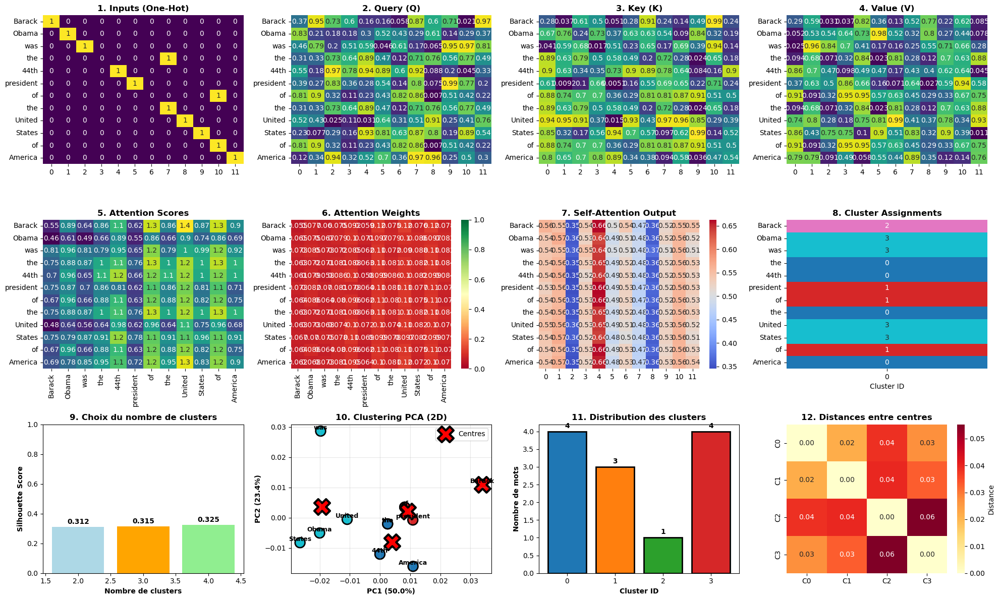


RÉSUMÉ FINAL
✅ Phrase analysée: 'Barack Obama was the 44th president of the United States of America'
✅ Dimension des vecteurs: 12
✅ Nombre de clusters: 4
✅ Silhouette Score: 0.325

📊 Clusters détectés:
   Cluster 0 (4 mots): the, 44th, the, America
   Cluster 1 (3 mots): president, of, of
   Cluster 2 (1 mots): Barack
   Cluster 3 (4 mots): Obama, was, United, States

💡 Interprétation:
   - Les mots dans le même cluster ont des représentations similaires
   - Le self-attention capture les relations contextuelles entre mots
   - K-means groupe les mots ayant des patterns d'attention similaires


In [134]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_score

def softmax(x):
    return np.exp(x) / np.sum(np.exp(x), axis=-1, keepdims=True)

# Tokenize the sentence
sentence = "Barack Obama was the 44th president of the United States of America".split()
vocab_size = len(sentence)

# Create one-hot embeddings for each word
word_to_index = {word: idx for idx, word in enumerate(sentence)}
embeddings = np.eye(vocab_size)

# Convert sentence to sequence of embeddings
inputs = np.array([embeddings[word_to_index[word]] for word in sentence])

# Initialize weights for Query, Key, and Value matrices
np.random.seed(42)
Wq = np.random.rand(vocab_size, vocab_size)
Wk = np.random.rand(vocab_size, vocab_size)
Wv = np.random.rand(vocab_size, vocab_size)

# Compute Query, Key, and Value matrices
Q = np.dot(inputs, Wq)
K = np.dot(inputs, Wk)
V = np.dot(inputs, Wv)

# Compute attention scores
scores = np.dot(Q, K.T) / np.sqrt(K.shape[1])

# Apply softmax to get attention weights
attention_weights = softmax(scores)

# Compute the output of the self-attention mechanism
output = np.dot(attention_weights, V)

print("=" * 70)
print("ÉTAPE 1: SELF-ATTENTION")
print("=" * 70)
print(f"Phrase: {' '.join(sentence)}")
print(f"Nombre de mots: {vocab_size}")
print(f"Dimension des vecteurs de sortie: {output.shape}")

# ============ CLUSTERING K-MEANS SUR LA SORTIE SELF-ATTENTION ============
print("\n" + "=" * 70)
print("ÉTAPE 2: CLUSTERING K-MEANS")
print("=" * 70)

# Choisir le nombre de clusters (essayer différentes valeurs)
n_clusters_options = [2, 3, 4]
best_n_clusters = 3  # Valeur par défaut

# Trouver le meilleur nombre de clusters avec le score de silhouette
silhouette_scores = []
for n in n_clusters_options:
    kmeans_temp = KMeans(n_clusters=n, random_state=42, n_init=10)
    labels_temp = kmeans_temp.fit_predict(output)
    if n > 1:  # Silhouette nécessite au moins 2 clusters
        score = silhouette_score(output, labels_temp)
        silhouette_scores.append(score)
        print(f"n_clusters={n}: Silhouette Score = {score:.3f}")
    else:
        silhouette_scores.append(0)

best_n_clusters = n_clusters_options[np.argmax(silhouette_scores)]
print(f"\n✅ Meilleur nombre de clusters: {best_n_clusters}")

# Appliquer K-means avec le meilleur nombre de clusters
kmeans = KMeans(n_clusters=best_n_clusters, random_state=42, n_init=10)
cluster_labels = kmeans.fit_predict(output)
cluster_centers = kmeans.cluster_centers_

print(f"\nCentres des clusters (shape): {cluster_centers.shape}")
print(f"Labels de clusters: {cluster_labels}")

# Organiser les mots par cluster
clusters_dict = {}
for i in range(best_n_clusters):
    clusters_dict[i] = [sentence[j] for j in range(len(sentence)) if cluster_labels[j] == i]

print("\n📊 RÉSULTATS DU CLUSTERING:")
print("-" * 70)
for cluster_id, words in clusters_dict.items():
    print(f"Cluster {cluster_id}: {', '.join(words)}")

# ============ RÉDUCTION DE DIMENSION AVEC PCA POUR VISUALISATION ============
print("\n" + "=" * 70)
print("ÉTAPE 3: VISUALISATION PCA")
print("=" * 70)

# Réduire à 2D pour visualisation
pca = PCA(n_components=2)
output_2d = pca.fit_transform(output)
centers_2d = pca.transform(cluster_centers)

print(f"Variance expliquée par les 2 premières composantes: {pca.explained_variance_ratio_.sum():.2%}")

# ============ VISUALISATIONS ============
fig = plt.figure(figsize=(20, 12))

# 1. Inputs
ax1 = plt.subplot(3, 4, 1)
sns.heatmap(inputs, annot=True, cmap='viridis', yticklabels=sentence, cbar=False)
ax1.set_title('1. Inputs (One-Hot)', fontweight='bold')

# 2. Query (Q) matrix
ax2 = plt.subplot(3, 4, 2)
sns.heatmap(Q, annot=True, cmap='viridis', yticklabels=sentence, cbar=False)
ax2.set_title('2. Query (Q)', fontweight='bold')

# 3. Key (K) matrix
ax3 = plt.subplot(3, 4, 3)
sns.heatmap(K, annot=True, cmap='viridis', yticklabels=sentence, cbar=False)
ax3.set_title('3. Key (K)', fontweight='bold')

# 4. Value (V) matrix
ax4 = plt.subplot(3, 4, 4)
sns.heatmap(V, annot=True, cmap='viridis', yticklabels=sentence, cbar=False)
ax4.set_title('4. Value (V)', fontweight='bold')

# 5. Attention Scores
ax5 = plt.subplot(3, 4, 5)
sns.heatmap(scores, annot=True, cmap='viridis', xticklabels=sentence, 
            yticklabels=sentence, cbar=False)
ax5.set_title('5. Attention Scores', fontweight='bold')

# 6. Attention Weights
ax6 = plt.subplot(3, 4, 6)
sns.heatmap(attention_weights, annot=True, cmap='RdYlGn', xticklabels=sentence, 
            yticklabels=sentence, cbar=True, vmin=0, vmax=1)
ax6.set_title('6. Attention Weights', fontweight='bold')

# 7. Self-Attention Output
ax7 = plt.subplot(3, 4, 7)
sns.heatmap(output, annot=True, cmap='coolwarm', yticklabels=sentence, cbar=True)
ax7.set_title('7. Self-Attention Output', fontweight='bold')

# 8. Cluster Labels Heatmap
ax8 = plt.subplot(3, 4, 8)
cluster_matrix = cluster_labels.reshape(-1, 1)
sns.heatmap(cluster_matrix, annot=True, cmap='tab10', yticklabels=sentence,
            cbar=False, fmt='d')
ax8.set_title('8. Cluster Assignments', fontweight='bold')
ax8.set_xlabel('Cluster ID')

# 9. Silhouette Scores
ax9 = plt.subplot(3, 4, 9)
ax9.bar(n_clusters_options, silhouette_scores, color=['lightblue', 'orange', 'lightgreen'])
ax9.set_xlabel('Nombre de clusters', fontweight='bold')
ax9.set_ylabel('Silhouette Score', fontweight='bold')
ax9.set_title('9. Choix du nombre de clusters', fontweight='bold')
ax9.set_ylim([0, 1])
for i, score in enumerate(silhouette_scores):
    ax9.text(n_clusters_options[i], score + 0.02, f'{score:.3f}', 
             ha='center', fontweight='bold')

# 10. PCA Visualization des vecteurs
ax10 = plt.subplot(3, 4, 10)
scatter = ax10.scatter(output_2d[:, 0], output_2d[:, 1], 
                       c=cluster_labels, cmap='tab10', s=200, 
                       edgecolors='black', linewidth=2)
ax10.scatter(centers_2d[:, 0], centers_2d[:, 1], 
            c='red', marker='X', s=500, edgecolors='black', 
            linewidth=3, label='Centres')
# Annoter chaque point avec le mot
for i, word in enumerate(sentence):
    ax10.annotate(word, (output_2d[i, 0], output_2d[i, 1]), 
                 fontsize=9, fontweight='bold', ha='center', va='bottom')
ax10.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%})', fontweight='bold')
ax10.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%})', fontweight='bold')
ax10.set_title('10. Clustering PCA (2D)', fontweight='bold')
ax10.legend()
ax10.grid(True, alpha=0.3)

# 11. Distribution des clusters
ax11 = plt.subplot(3, 4, 11)
unique, counts = np.unique(cluster_labels, return_counts=True)
colors = plt.cm.tab10(unique)
ax11.bar(unique, counts, color=colors, edgecolor='black', linewidth=2)
ax11.set_xlabel('Cluster ID', fontweight='bold')
ax11.set_ylabel('Nombre de mots', fontweight='bold')
ax11.set_title('11. Distribution des clusters', fontweight='bold')
ax11.set_xticks(unique)
for i, count in enumerate(counts):
    ax11.text(unique[i], count + 0.1, str(count), ha='center', fontweight='bold')

# 12. Matrice de distance inter-clusters
ax12 = plt.subplot(3, 4, 12)
from scipy.spatial.distance import cdist
dist_matrix = cdist(cluster_centers, cluster_centers, metric='euclidean')
sns.heatmap(dist_matrix, annot=True, fmt='.2f', cmap='YlOrRd',
            xticklabels=[f'C{i}' for i in range(best_n_clusters)],
            yticklabels=[f'C{i}' for i in range(best_n_clusters)],
            cbar_kws={'label': 'Distance'})
ax12.set_title('12. Distances entre centres', fontweight='bold')

plt.tight_layout()
plt.savefig('self_attention_clustering.png', dpi=150, bbox_inches='tight')
plt.show()

# ============ RÉSUMÉ FINAL ============
print("\n" + "=" * 70)
print("RÉSUMÉ FINAL")
print("=" * 70)
print(f"✅ Phrase analysée: '{' '.join(sentence)}'")
print(f"✅ Dimension des vecteurs: {output.shape[1]}")
print(f"✅ Nombre de clusters: {best_n_clusters}")
print(f"✅ Silhouette Score: {max(silhouette_scores):.3f}")
print(f"\n📊 Clusters détectés:")
for cluster_id, words in clusters_dict.items():
    print(f"   Cluster {cluster_id} ({len(words)} mots): {', '.join(words)}")

Le clustering réalisé sur la base des embeding en sortie n'est pas trop mauvais , on voit que United et States sont mis ensemble 

In [137]:

# Appliquer K-means avec le meilleur nombre de clusters
kmeans = KMeans(n_clusters=2, random_state=42, n_init=10)
cluster_labels = kmeans.fit_predict(output)
cluster_centers = kmeans.cluster_centers_

print(f"\nCentres des clusters (shape): {cluster_centers.shape}")
print(f"Labels de clusters: {cluster_labels}")

# Organiser les mots par cluster
clusters_dict = {}
for i in range(2):
    clusters_dict[i] = [sentence[j] for j in range(len(sentence)) if cluster_labels[j] == i]

print("\n📊 RÉSULTATS DU CLUSTERING:")
print("-" * 70)
for cluster_id, words in clusters_dict.items():
    print(f"Cluster {cluster_id}: {', '.join(words)}")


Centres des clusters (shape): (2, 12)
Labels de clusters: [1 0 0 1 1 1 1 1 0 0 1 1]

📊 RÉSULTATS DU CLUSTERING:
----------------------------------------------------------------------
Cluster 0: Obama, was, United, States
Cluster 1: Barack, the, 44th, president, of, the, of, America


C:\Users\macta\anaconda3\Lib\site-packages\sklearn\cluster\_kmeans.py:1429: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Bien que le score de silhouette nous dit qu'un clustering de 4 est meilleur, dans notre contexte, un clustering de 2 nous donne un resultat pas mal 